In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as patches

model_name = "ANN2"

In [2]:
#df = pd.read_csv("Data_Processed/Recommendation.csv")
df = pd.read_csv("../Data/Crop_production 2.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99849 entries, 0 to 99848
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          99849 non-null  int64  
 1   State_Name          99849 non-null  object 
 2   Crop_Type           99849 non-null  object 
 3   Crop                99849 non-null  object 
 4   N                   99849 non-null  int64  
 5   P                   99849 non-null  int64  
 6   K                   99849 non-null  int64  
 7   pH                  99849 non-null  float64
 8   rainfall            99849 non-null  float64
 9   temperature         99849 non-null  float64
 10  Area_in_hectares    99849 non-null  float64
 11  Production_in_tons  99849 non-null  float64
 12  Yield_ton_per_hec   99849 non-null  float64
dtypes: float64(6), int64(4), object(3)
memory usage: 9.9+ MB


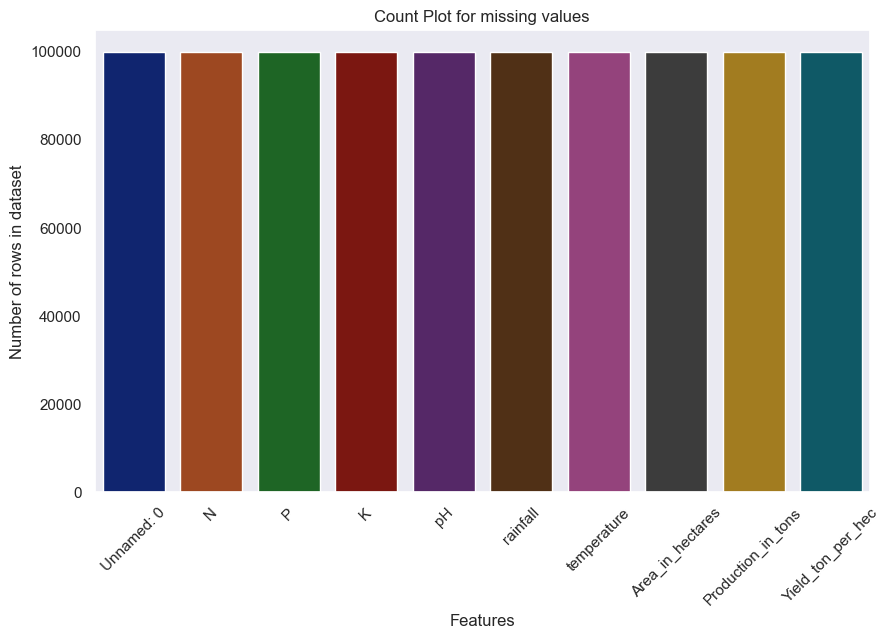

In [3]:
plt.figure(figsize=(10, 6))
sns.set_theme()
plt.grid()
sns.countplot(data=df,palette="dark")
plt.title("Count Plot for missing values")
plt.xlabel("Features")
plt.ylabel("Number of rows in dataset")
plt.xticks(rotation=45)
plt.savefig("../Methodology/Countplot.png")
plt.show()

In [4]:
df = df.drop(["Unnamed: 0"],axis=1)
# df.info()

In [5]:
# for i in df.columns:
#     print(i,df[i].unique(),df[i].nunique())

In [6]:
def outlier_info(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    outlier_count = outliers.shape[0]
    total_count = df.shape[0]
    outlier_percentage = (outlier_count / total_count) * 100

    return outlier_count, outlier_percentage

def outlier_remover(df,column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    df.loc[df[column] < lower_bound, column] = lower_bound
    df.loc[df[column] > upper_bound, column] = upper_bound
    return df
# for i in df.columns:
#     if df[i].dtype != "object":
#         sns.boxplot(df[i])
#         plt.show()
#         print(f"Outlier counter and percentage for {i}: {outlier_info(df, i)}")


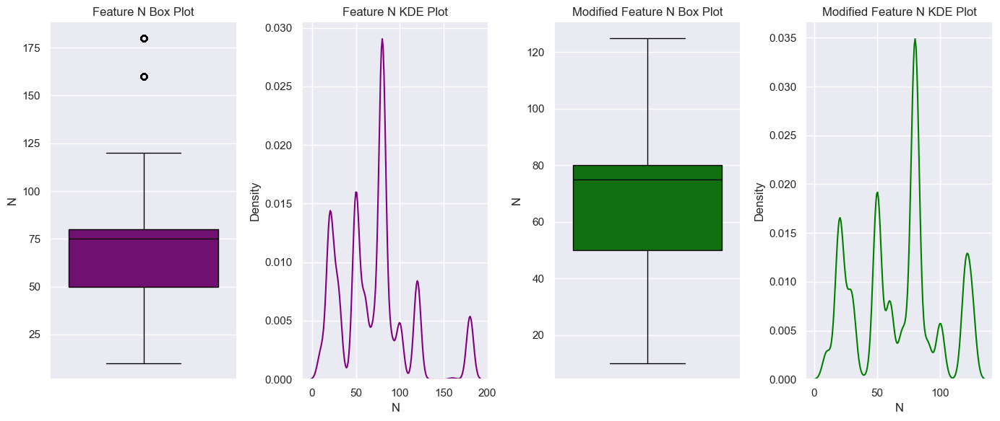

In [7]:
fig,ax = plt.subplots(1,4,figsize=(14,6))
sns.boxplot(data=df["N"],ax=ax[0],color="purple",linecolor="black")
ax[0].set_title("Feature N Box Plot")
sns.kdeplot(data=df["N"],ax=ax[1],color="purple")
ax[1].set_title("Feature N KDE Plot")
df = outlier_remover(df,"N")
sns.boxplot(data=df["N"],ax=ax[2],color="green",linecolor="black")
ax[2].set_title("Modified Feature N Box Plot")
sns.kdeplot(data=df["N"],ax=ax[3],color="green")
ax[3].set_title("Modified Feature N KDE Plot")
plt.tight_layout()
plt.savefig("../Methodology/N_Outlierplot.png")
plt.show()

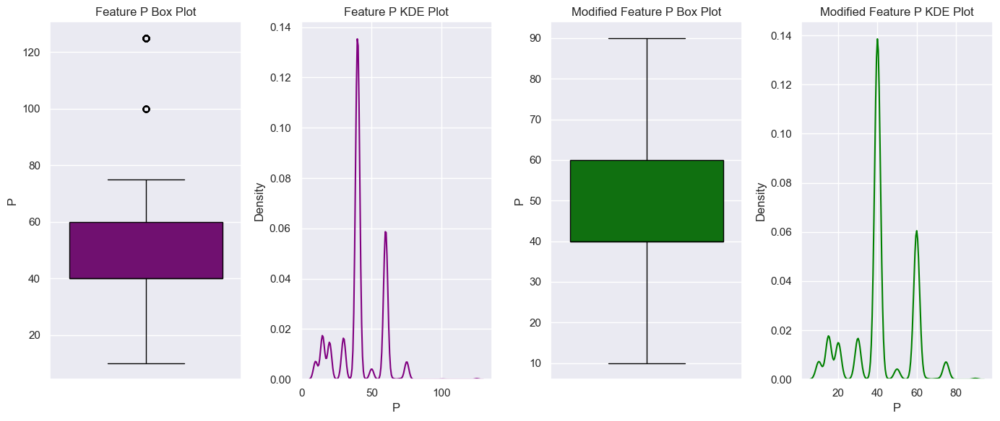

In [8]:
fig,ax = plt.subplots(1,4,figsize=(14,6))
sns.boxplot(data=df["P"],ax=ax[0],color="purple",linecolor="black")
ax[0].set_title("Feature P Box Plot")
sns.kdeplot(data=df["P"],ax=ax[1],color="purple")
ax[1].set_title("Feature P KDE Plot")
df = outlier_remover(df,"P")
sns.boxplot(data=df["P"],ax=ax[2],color="green",linecolor="black")
ax[2].set_title("Modified Feature P Box Plot")
sns.kdeplot(data=df["P"],ax=ax[3],color="green")
ax[3].set_title("Modified Feature P KDE Plot")
plt.tight_layout()
plt.savefig("../Methodology/P_Outlierplot.png")
plt.show()

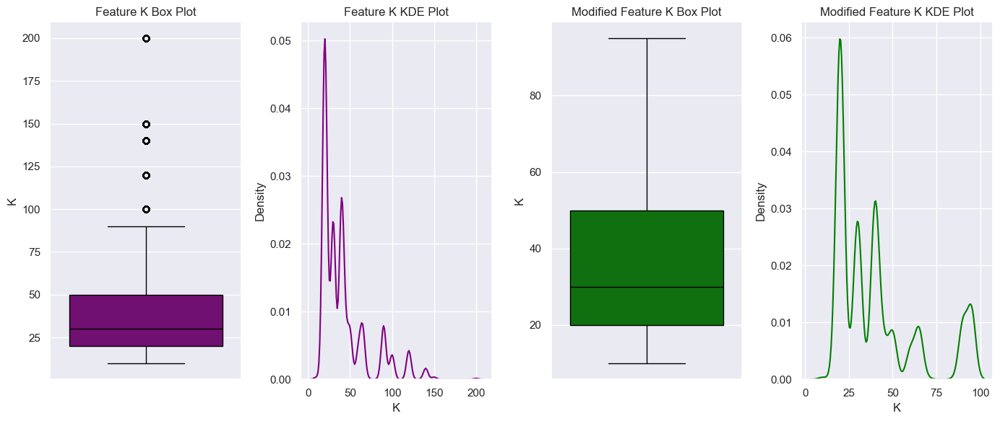

In [9]:
fig,ax = plt.subplots(1,4,figsize=(14,6))
sns.boxplot(data=df["K"],ax=ax[0],color="purple",linecolor="black")
ax[0].set_title("Feature K Box Plot")
sns.kdeplot(data=df["K"],ax=ax[1],color="purple")
ax[1].set_title("Feature K KDE Plot")
df = outlier_remover(df,"K")
sns.boxplot(data=df["K"],ax=ax[2],color="green",linecolor="black")
ax[2].set_title("Modified Feature K Box Plot")
sns.kdeplot(data=df["K"],ax=ax[3],color="green")
ax[3].set_title("Modified Feature K KDE Plot")
plt.tight_layout()
plt.savefig("../Methodology/K_Outlierplot.png")
plt.show()

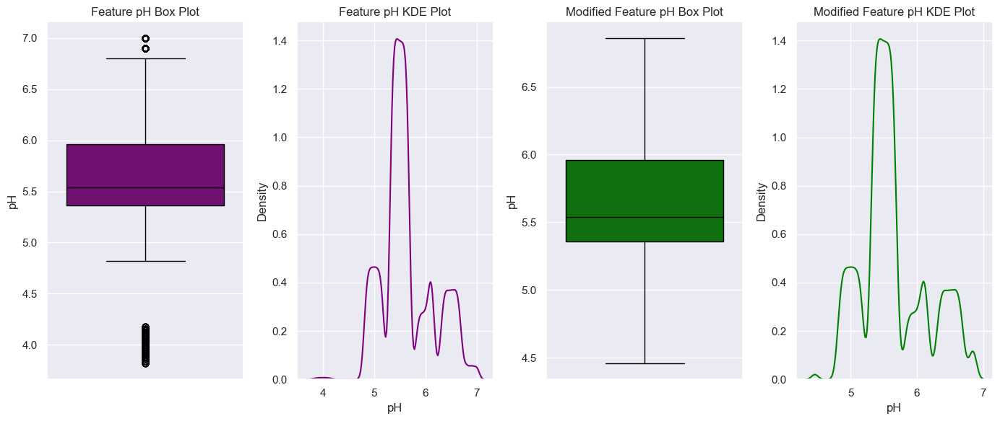

In [10]:
fig,ax = plt.subplots(1,4,figsize=(14,6))
sns.boxplot(data=df["pH"],ax=ax[0],color="purple",linecolor="black")
ax[0].set_title("Feature pH Box Plot")
sns.kdeplot(data=df["pH"],ax=ax[1],color="purple")
ax[1].set_title("Feature pH KDE Plot")
df = outlier_remover(df,"pH")
sns.boxplot(data=df["pH"],ax=ax[2],color="green",linecolor="black")
ax[2].set_title("Modified Feature pH Box Plot")
sns.kdeplot(data=df["pH"],ax=ax[3],color="green")
ax[3].set_title("Modified Feature pH KDE Plot")
plt.tight_layout()
plt.savefig("../Methodology/pH_Outlierplot.png")
plt.show()

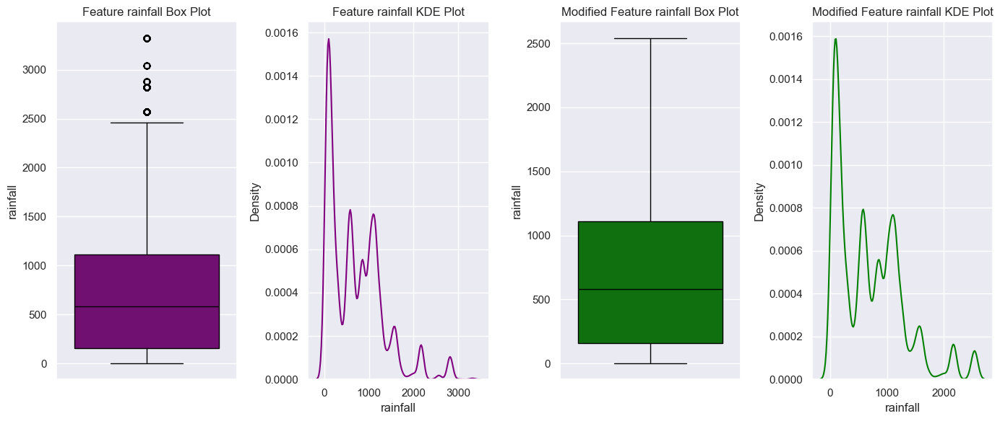

In [11]:
fig,ax = plt.subplots(1,4,figsize=(14,6))
sns.boxplot(data=df["rainfall"],ax=ax[0],color="purple",linecolor="black")
ax[0].set_title("Feature rainfall Box Plot")
sns.kdeplot(data=df["rainfall"],ax=ax[1],color="purple")
ax[1].set_title("Feature rainfall KDE Plot")
df = outlier_remover(df,"rainfall")
sns.boxplot(data=df["rainfall"],ax=ax[2],color="green",linecolor="black")
ax[2].set_title("Modified Feature rainfall Box Plot")
sns.kdeplot(data=df["rainfall"],ax=ax[3],color="green")
ax[3].set_title("Modified Feature rainfall KDE Plot")
plt.tight_layout()
plt.savefig("../Methodology/rainfall_Outlierplot.png")
plt.show()

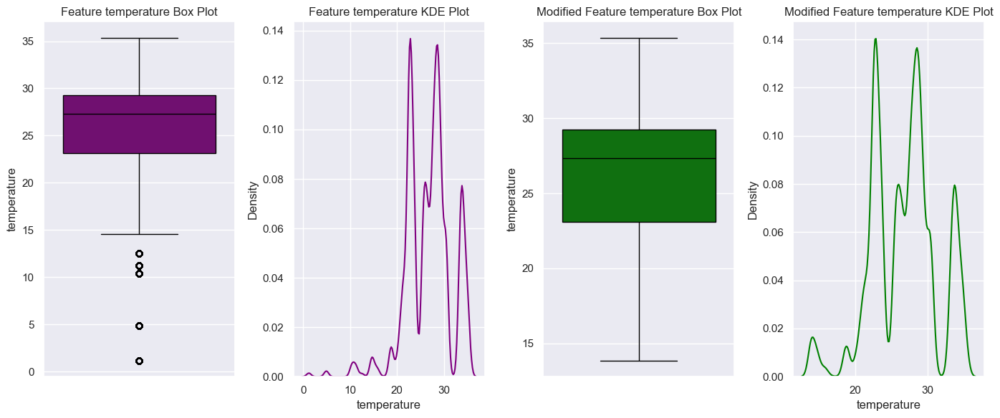

In [12]:
fig,ax = plt.subplots(1,4,figsize=(14,6))
sns.boxplot(data=df["temperature"],ax=ax[0],color="purple",linecolor="black")
ax[0].set_title("Feature temperature Box Plot")
sns.kdeplot(data=df["temperature"],ax=ax[1],color="purple")
ax[1].set_title("Feature temperature KDE Plot")
df = outlier_remover(df,"temperature")
sns.boxplot(data=df["temperature"],ax=ax[2],color="green",linecolor="black")
ax[2].set_title("Modified Feature temperature Box Plot")
sns.kdeplot(data=df["temperature"],ax=ax[3],color="green")
ax[3].set_title("Modified Feature temperature KDE Plot")
plt.tight_layout()
plt.savefig("../Methodology/temperature_Outlierplot.png")
plt.show()


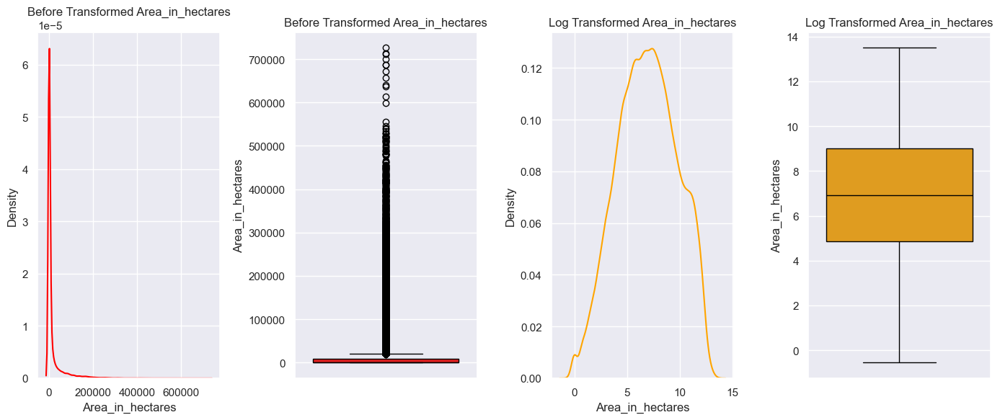

In [13]:
fig,ax = plt.subplots(1,4,figsize=(14,6))
sns.kdeplot(data = df["Area_in_hectares"],ax=ax[0],color="red")
ax[0].set_title("Before Transformed Area_in_hectares")
sns.boxplot(data=df["Area_in_hectares"],ax=ax[1],color="red",linecolor="black")
ax[1].set_title("Before Transformed Area_in_hectares")
sns.kdeplot(data = np.log(df["Area_in_hectares"]),ax=ax[2],color="orange")
ax[2].set_title("Log Transformed Area_in_hectares")
sns.boxplot(data=np.log(df["Area_in_hectares"]),ax=ax[3],color="orange",linecolor="black")
ax[3].set_title("Log Transformed Area_in_hectares")
plt.tight_layout()
plt.savefig("../Methodology/AiHtransplot.png")
plt.show()
df["Area_in_hectares"] = np.log(df["Area_in_hectares"])

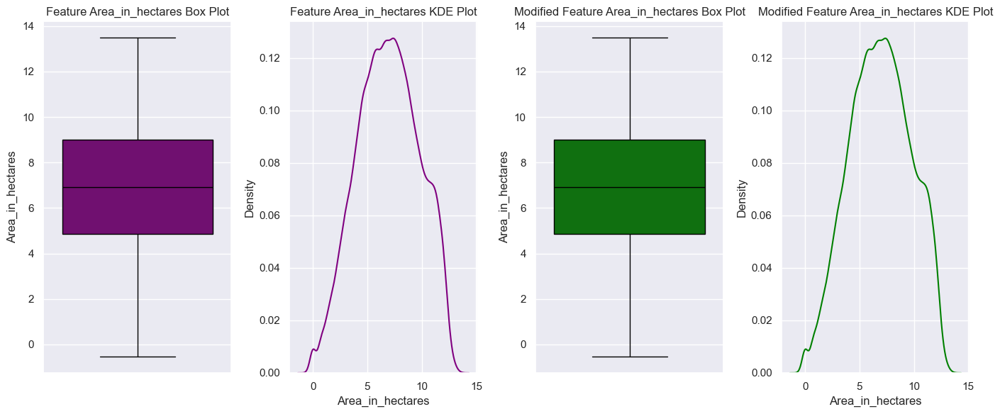

In [14]:
fig,ax = plt.subplots(1,4,figsize=(14,6))
sns.boxplot(data=df["Area_in_hectares"],ax=ax[0],color="purple",linecolor="black")
ax[0].set_title("Feature Area_in_hectares Box Plot")
sns.kdeplot(data=df["Area_in_hectares"],ax=ax[1],color="purple")
ax[1].set_title("Feature Area_in_hectares KDE Plot")
df = outlier_remover(df,"Area_in_hectares")
sns.boxplot(data=df["Area_in_hectares"],ax=ax[2],color="green",linecolor="black")
ax[2].set_title("Modified Feature Area_in_hectares Box Plot")
sns.kdeplot(data=df["Area_in_hectares"],ax=ax[3],color="green")
ax[3].set_title("Modified Feature Area_in_hectares KDE Plot")
plt.tight_layout()
plt.savefig("../Methodology/Area_in_hectares_Outlierplot.png")
plt.show()

d:\Projects\.venv\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
d:\Projects\.venv\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


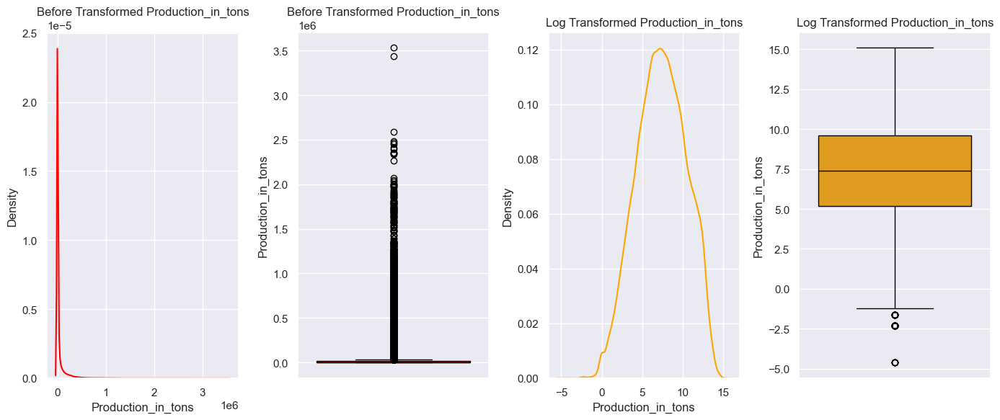

d:\Projects\.venv\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [15]:
fig,ax = plt.subplots(1,4,figsize=(14,6))
sns.kdeplot(data = df["Production_in_tons"],ax=ax[0],color="red")
ax[0].set_title("Before Transformed Production_in_tons")
sns.boxplot(data=df["Production_in_tons"],ax=ax[1],color="red",linecolor="black")
ax[1].set_title("Before Transformed Production_in_tons")
sns.kdeplot(data = np.log(df["Production_in_tons"]),ax=ax[2],color="orange")
ax[2].set_title("Log Transformed Production_in_tons")
sns.boxplot(data=np.log(df["Production_in_tons"]),ax=ax[3],color="orange",linecolor="black")
ax[3].set_title("Log Transformed Production_in_tons")
plt.tight_layout()
plt.savefig("../Methodology/PiTtransplot.png")
plt.show()
df["Production_in_tons"] = np.log(df["Production_in_tons"])

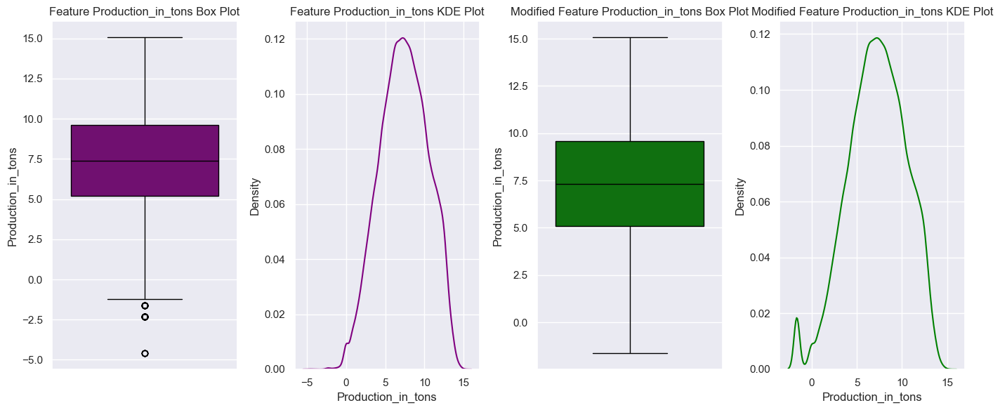

In [16]:
fig,ax = plt.subplots(1,4,figsize=(14,6))
sns.boxplot(data=df["Production_in_tons"],ax=ax[0],color="purple",linecolor="black")
ax[0].set_title("Feature Production_in_tons Box Plot")
sns.kdeplot(data=df["Production_in_tons"],ax=ax[1],color="purple")
ax[1].set_title("Feature Production_in_tons KDE Plot")
df = outlier_remover(df,"Production_in_tons")
sns.boxplot(data=df["Production_in_tons"],ax=ax[2],color="green",linecolor="black")
ax[2].set_title("Modified Feature Production_in_tons Box Plot")
sns.kdeplot(data=df["Production_in_tons"],ax=ax[3],color="green")
ax[3].set_title("Modified Feature Production_in_tons KDE Plot")
plt.tight_layout()
plt.savefig("../Methodology/Production_in_tons_Outlierplot.png")
plt.show()

d:\Projects\.venv\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
d:\Projects\.venv\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


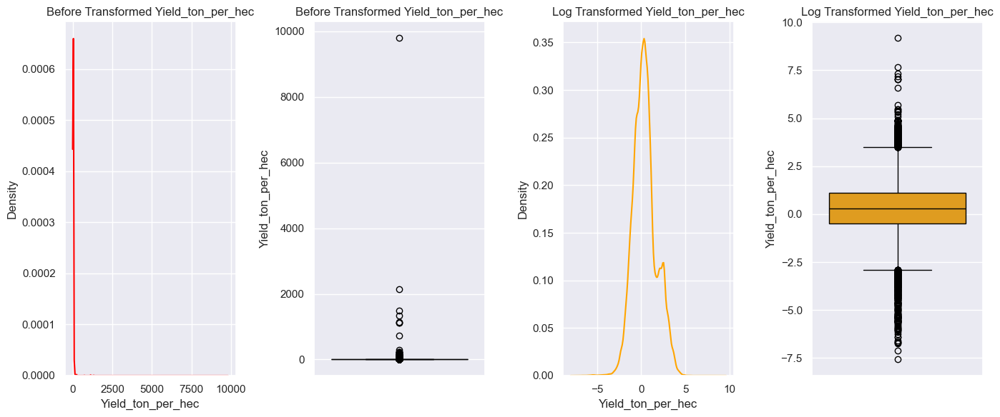

d:\Projects\.venv\lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [17]:
fig,ax = plt.subplots(1,4,figsize=(14,6))
sns.kdeplot(data = df["Yield_ton_per_hec"],ax=ax[0],color="red")
ax[0].set_title("Before Transformed Yield_ton_per_hec")
sns.boxplot(data=df["Yield_ton_per_hec"],ax=ax[1],color="red",linecolor="black")
ax[1].set_title("Before Transformed Yield_ton_per_hec")
sns.kdeplot(data = np.log(df["Yield_ton_per_hec"]),ax=ax[2],color="orange")
ax[2].set_title("Log Transformed Yield_ton_per_hec")
sns.boxplot(data=np.log(df["Yield_ton_per_hec"]),ax=ax[3],color="orange",linecolor="black")
ax[3].set_title("Log Transformed Yield_ton_per_hec")
plt.tight_layout()
plt.savefig("../Methodology/YtpStransplot.png")
plt.show()
df["Yield_ton_per_hec"] = np.log(df["Yield_ton_per_hec"])

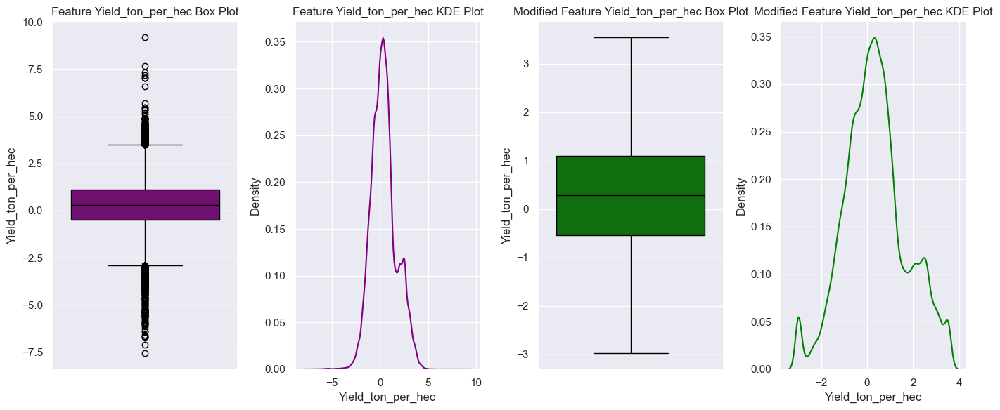

In [18]:
fig,ax = plt.subplots(1,4,figsize=(14,6))
sns.boxplot(data=df["Yield_ton_per_hec"],ax=ax[0],color="purple",linecolor="black")
ax[0].set_title("Feature Yield_ton_per_hec Box Plot")
sns.kdeplot(data=df["Yield_ton_per_hec"],ax=ax[1],color="purple")
ax[1].set_title("Feature Yield_ton_per_hec KDE Plot")
df = outlier_remover(df,"Yield_ton_per_hec")
sns.boxplot(data=df["Yield_ton_per_hec"],ax=ax[2],color="green",linecolor="black")
ax[2].set_title("Modified Feature Yield_ton_per_hec Box Plot")
sns.kdeplot(data=df["Yield_ton_per_hec"],ax=ax[3],color="green")
ax[3].set_title("Modified Feature Yield_ton_per_hec KDE Plot")
plt.tight_layout()
plt.savefig("../Methodology/Yield_ton_per_hec_Outlierplot.png")
plt.show()

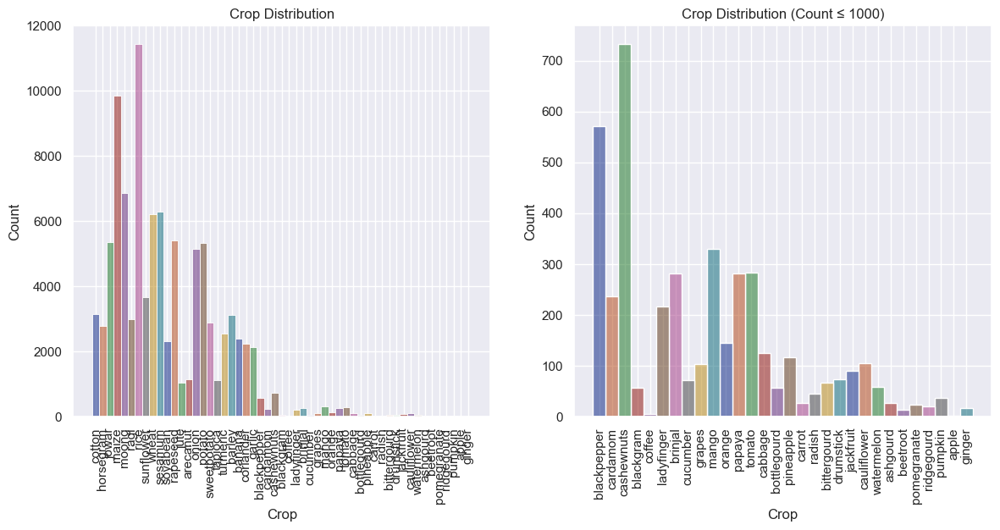

In [19]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))
sns.histplot(data=df, x="Crop", ax=ax[0], kde=True, stat="count", hue="Crop", palette="dark", legend=False)
ax[0].tick_params(axis='x', rotation=90)
ax[0].set_title("Crop Distribution")
crop_counts = df['Crop'].value_counts()
filtered_crops = crop_counts[crop_counts <= 1000].index
filtered_df = df[df['Crop'].isin(filtered_crops)]
sns.histplot(data=filtered_df, x="Crop", ax=ax[1], kde=True, stat="count", hue="Crop", palette="dark", legend=False)
ax[1].tick_params(axis='x', rotation=90)
ax[1].set_title("Crop Distribution (Count ≤ 1000)")
plt.savefig("../Methodology/Crop_Distribution.png")
plt.show()


In [20]:
df = df[df["Crop"] != "apple"]
df = df[df["Crop"] != "coffee"]

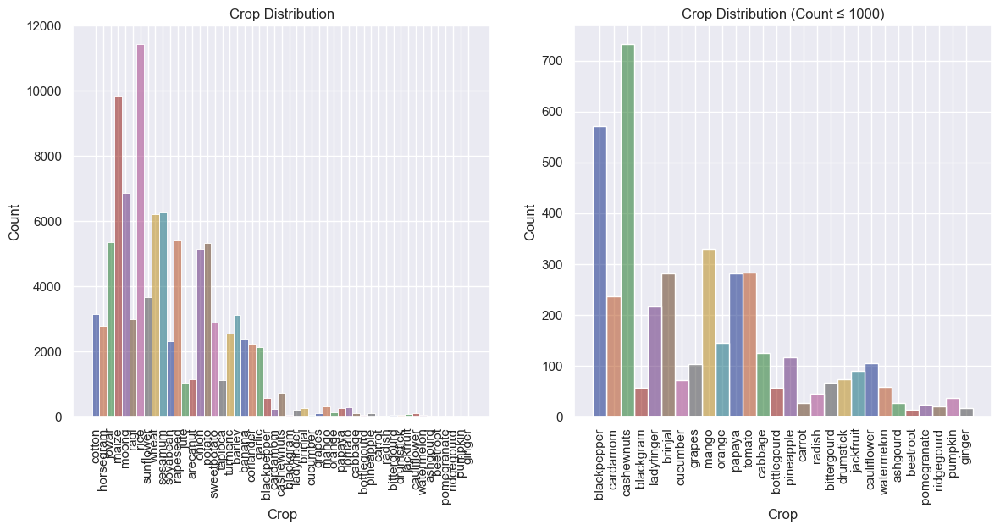

In [21]:
fig, ax = plt.subplots(1, 2, figsize=(14, 6))
sns.histplot(data=df, x="Crop", ax=ax[0], kde=True, stat="count", hue="Crop", palette="dark", legend=False)
ax[0].tick_params(axis='x', rotation=90)
ax[0].set_title("Crop Distribution")
crop_counts = df['Crop'].value_counts()
filtered_crops = crop_counts[crop_counts <= 1000].index
filtered_df = df[df['Crop'].isin(filtered_crops)]
sns.histplot(data=filtered_df, x="Crop", ax=ax[1], kde=True, stat="count", hue="Crop", palette="dark", legend=False)
ax[1].tick_params(axis='x', rotation=90)
ax[1].set_title("Crop Distribution (Count ≤ 1000)")
plt.savefig("../Methodology/Crop_Distribution_Modified.png")
plt.show()

In [22]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
import networkx as nx

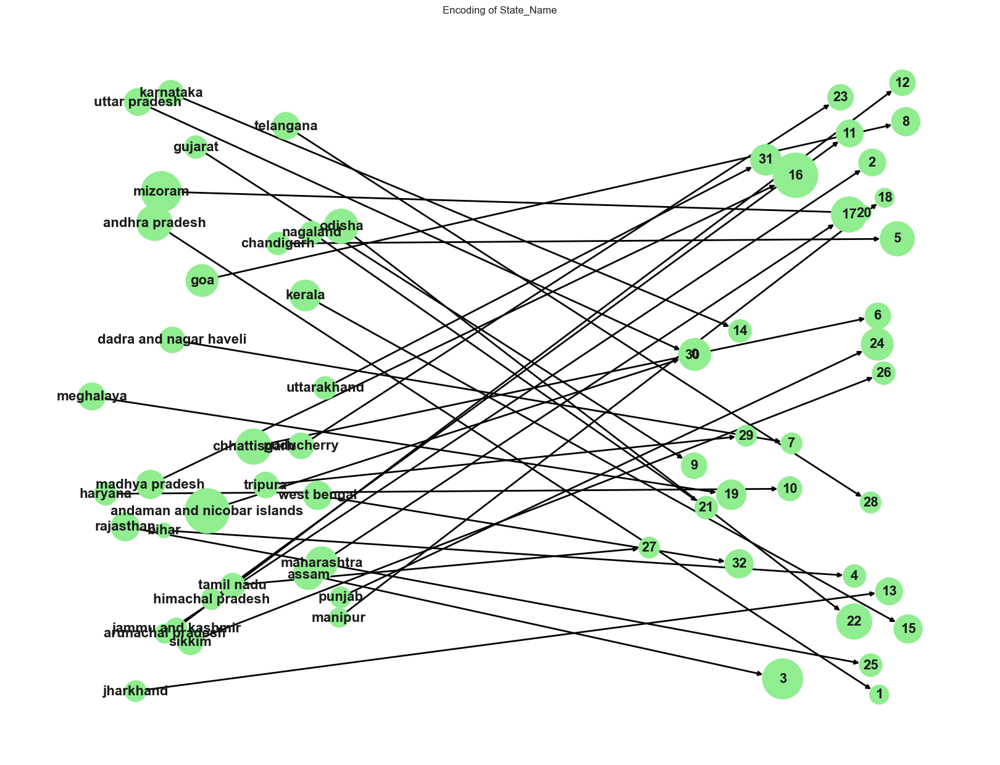

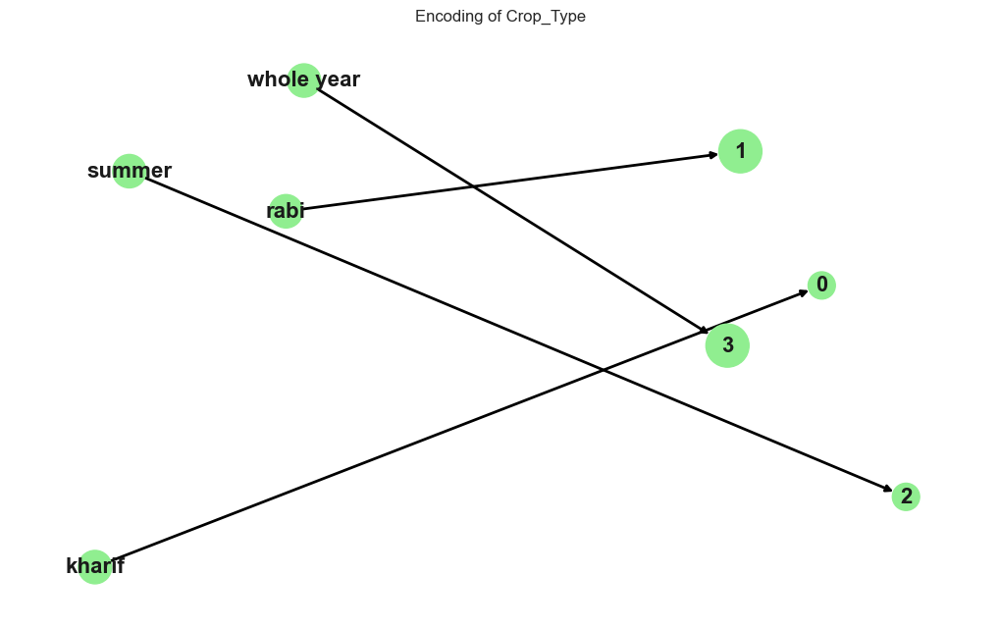

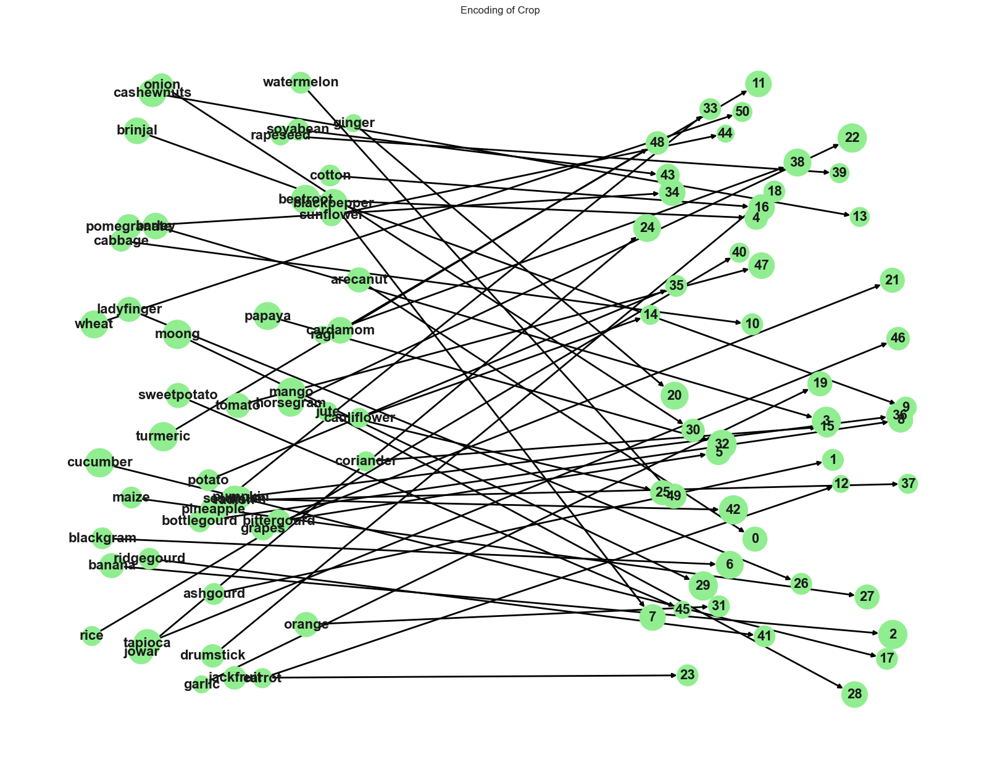

In [23]:
import random

C = ["State_Name", "Crop_Type", "Crop"]
le_D = {}

for col in C:
    le_D[col] = LabelEncoder()
    df[col] = le_D[col].fit_transform(df[col])
    
    original_values = le_D[col].classes_
    encoded_values = le_D[col].transform(le_D[col].classes_)
    
    G = nx.DiGraph()
    for j in range(len(original_values)):
        G.add_edge(f"{original_values[j]}", f"{encoded_values[j]}")
    
    pos = {}
    num_items = len(original_values)
    scale_factor = 20
    for j in range(num_items):
        pos[f"{original_values[j]}"] = (-scale_factor + random.uniform(0, scale_factor), random.uniform(-scale_factor, scale_factor))
    
    for j in range(num_items):
        pos[f"{encoded_values[j]}"] = (scale_factor + random.uniform(0, scale_factor), random.uniform(-scale_factor, scale_factor))
    
    node_size = [len(original_values[j]) * 100 for j in range(num_items)]*2
    if col=="Crop_Type":
        plt.figure(figsize=(10, 6))
    else:    
        plt.figure(figsize=(16, 12))  
    nx.draw(
        G, pos, 
        with_labels=True, 
        node_size=node_size,
        node_color='lightgreen', 
        font_size=16, 
        font_weight='bold', 
        arrows=True, 
        width=2,
        edge_color='black',
    )
    for j in range(len(original_values)):
        plt.annotate(
            '', 
            xy=pos[f"{encoded_values[j]}"], 
            xytext=pos[f"{original_values[j]}"],
            arrowprops=dict(facecolor='black', arrowstyle='->', lw=0)
        )
    
    plt.title(f"Encoding of {col}")
    
    plt.savefig(f"../Methodology/Encoding_of_{col}.png")
    plt.show()


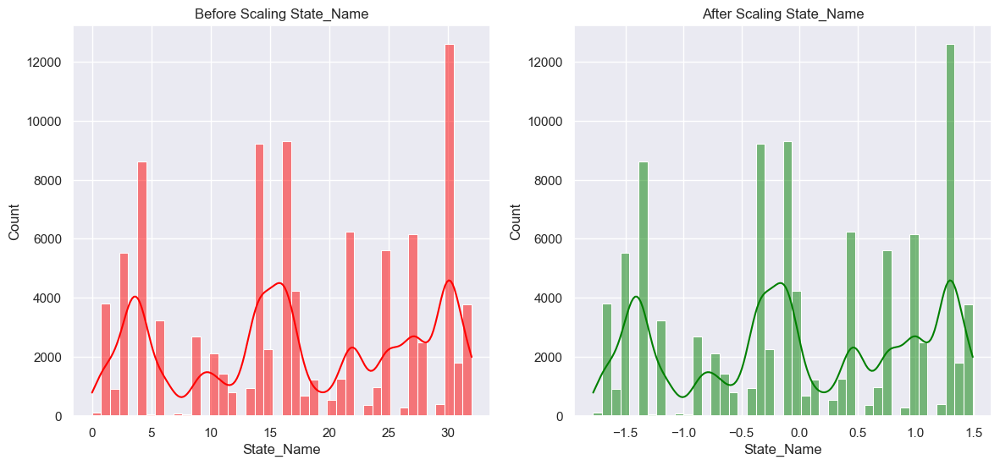

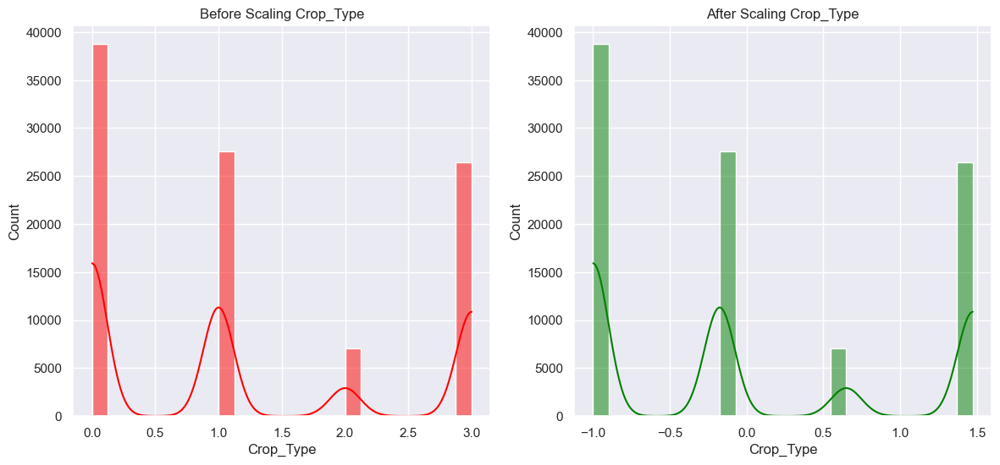

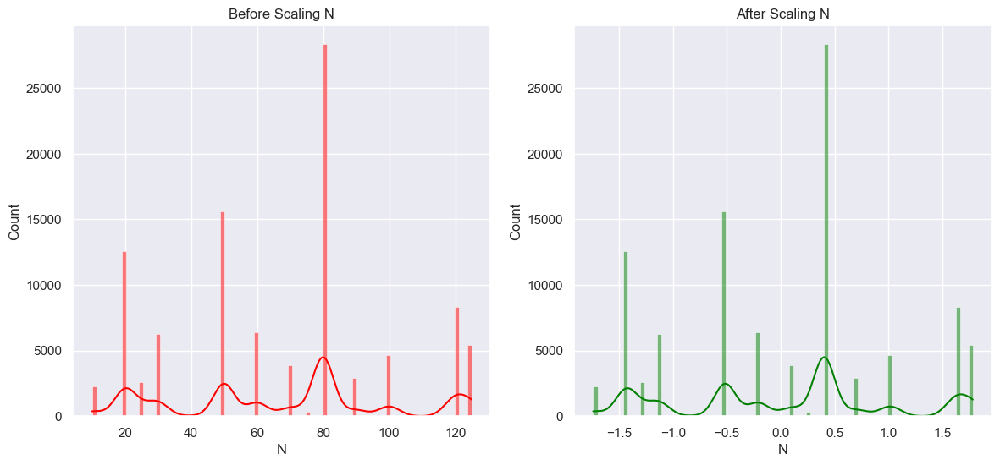

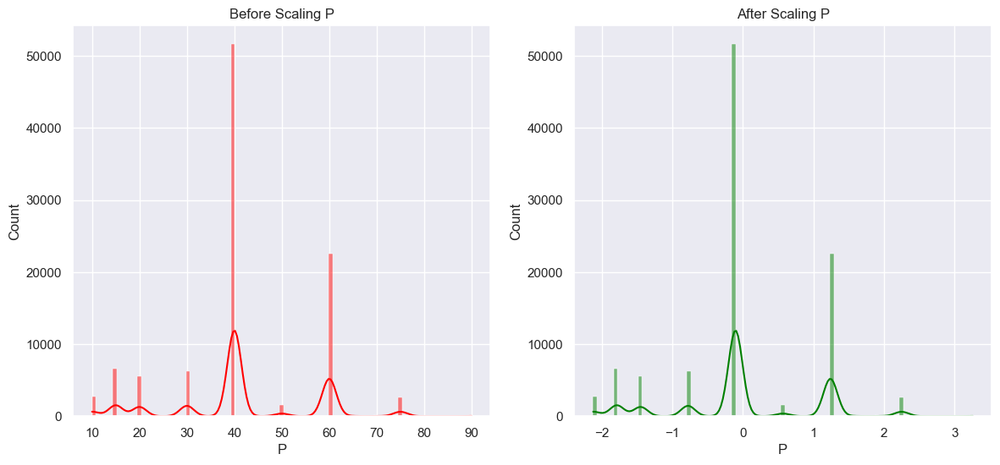

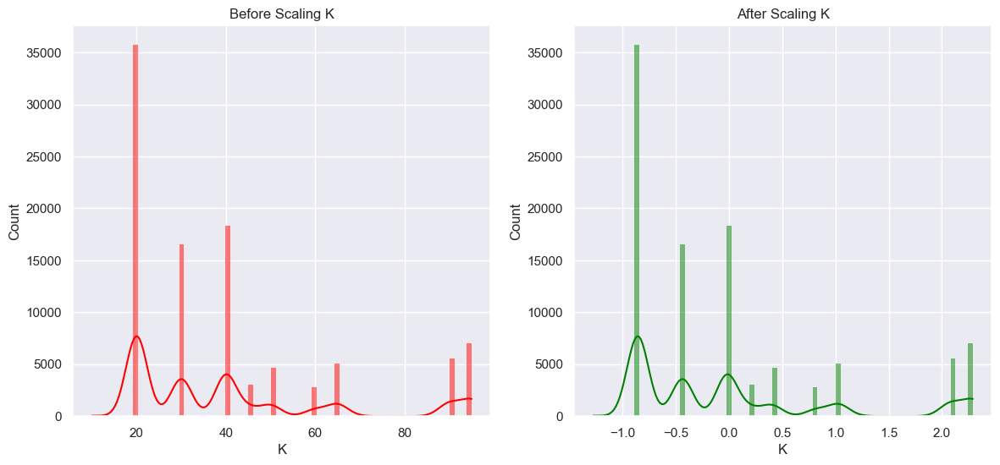

...

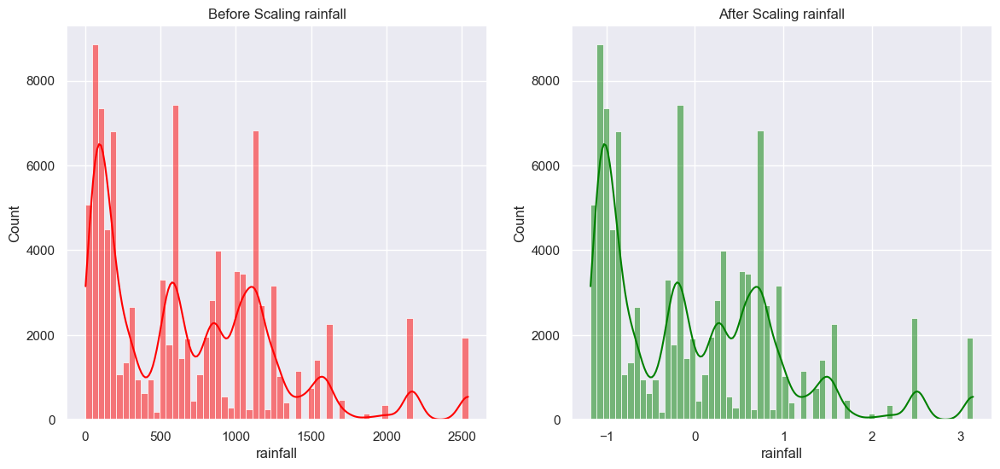

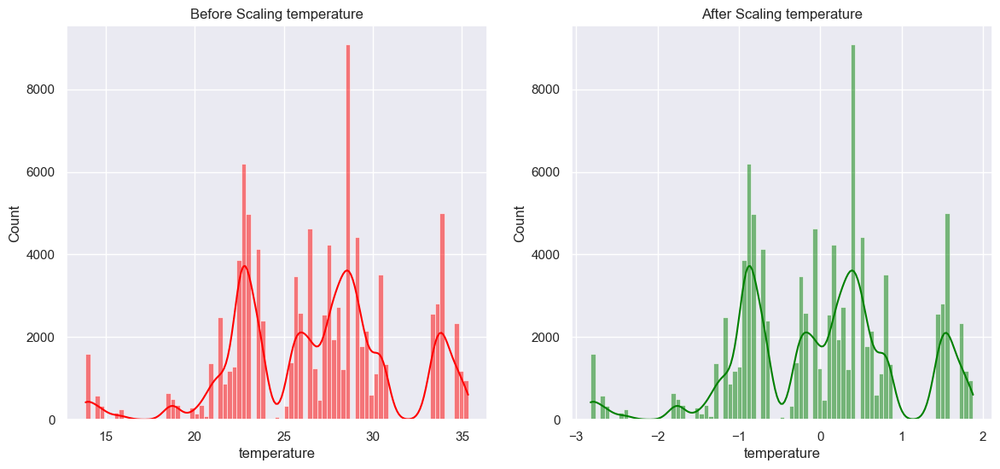

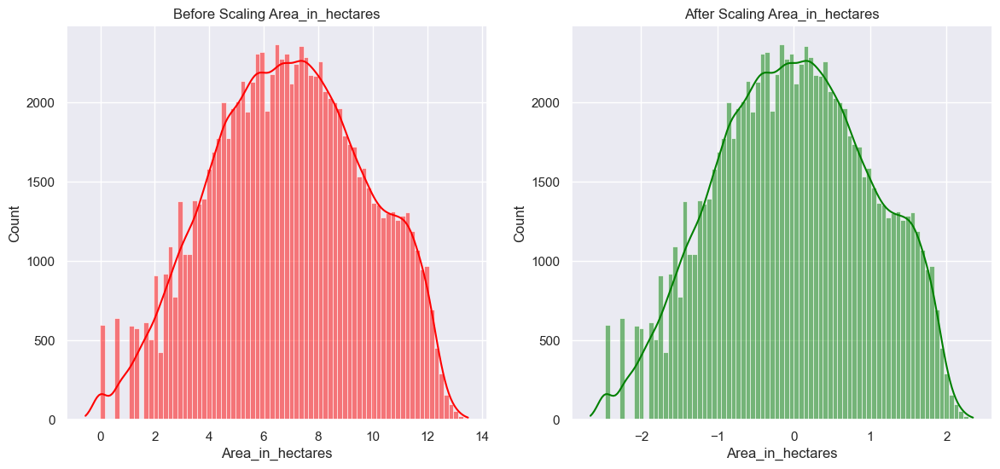

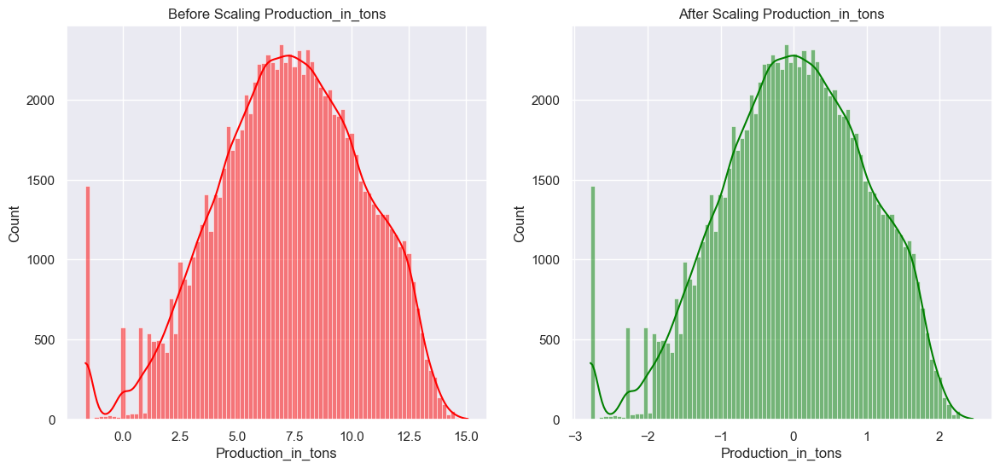

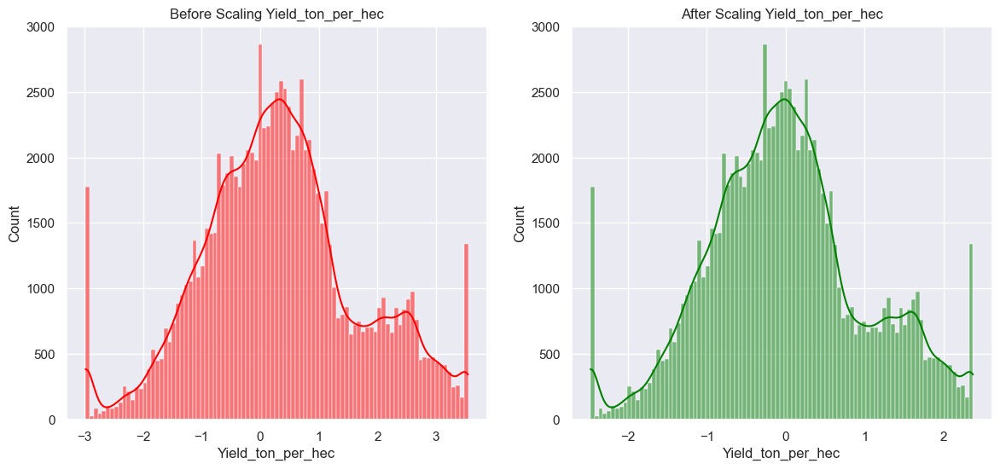

In [24]:
bulk_scaler = StandardScaler()
features_to_scale = ["State_Name","Crop_Type","N","P","K","pH","rainfall","temperature","Area_in_hectares","Production_in_tons","Yield_ton_per_hec"]
df_copy = df.copy()
df[features_to_scale] = bulk_scaler.fit_transform(df[features_to_scale])
for f in features_to_scale:
    fig,ax = plt.subplots(1,2,figsize=(14,6))
    sns.histplot(data=df_copy,x=f,ax=ax[0],color="red",kde=True)
    ax[0].set_title(f"Before Scaling {f}")
    sns.histplot(data=df,x=f,ax=ax[1],color="green",kde=True)
    ax[1].set_title(f"After Scaling {f}")
    plt.savefig(f"../Methodology/Scaling_of_{f}.png")
    plt.show()

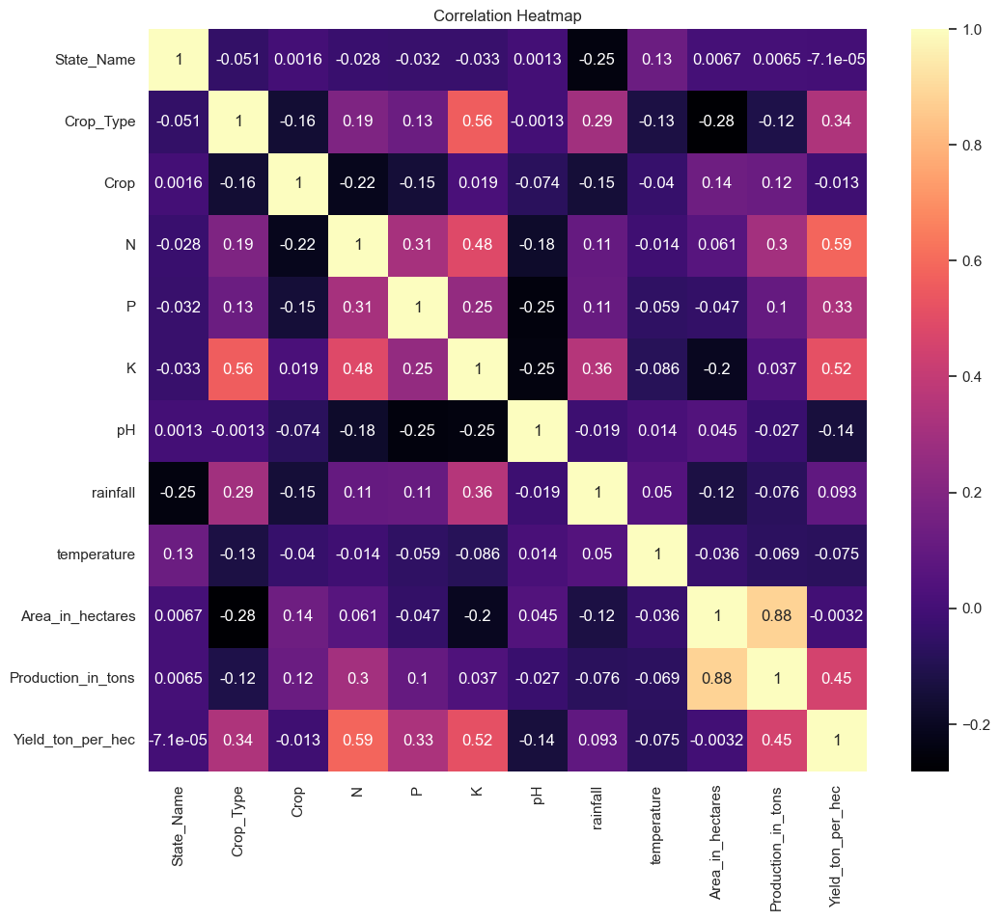

In [25]:
plt.figure(figsize=(12, 10))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='magma')
plt.title('Correlation Heatmap')
plt.savefig("../Methodology/Correlation_Heatmap.png")
plt.show()

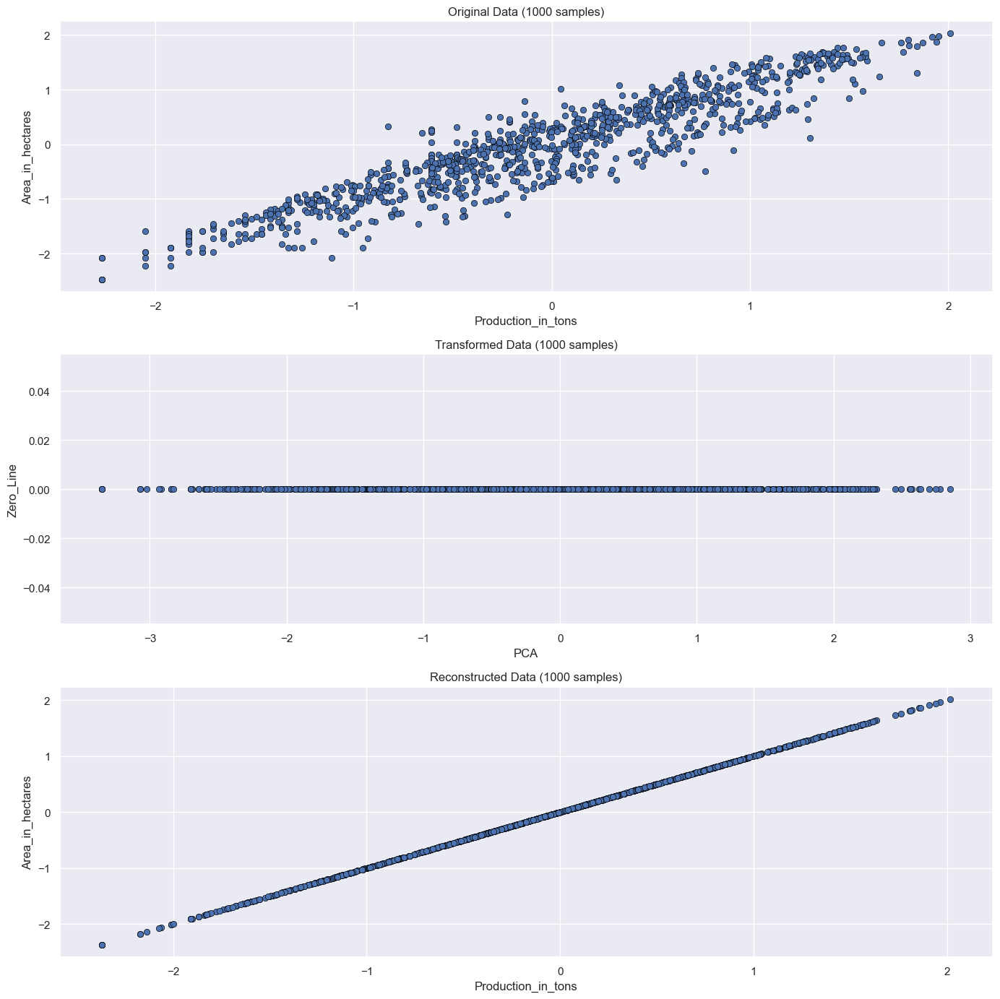

In [26]:
from sklearn.decomposition import PCA

t = df[["Production_in_tons","Area_in_hectares"]].values
pca = PCA(n_components=1)
X_pca = pca.fit_transform(t)
X_reconstructed = pca.inverse_transform(X_pca)
fig,ax = plt.subplots(3,1,figsize=(14,14))

sns.scatterplot(x=t[:1000,0],y=t[:1000,1],ax=ax[0],edgecolor="black")
ax[0].set_title("Original Data (1000 samples)")
ax[0].set_xlabel("Production_in_tons")
ax[0].set_ylabel("Area_in_hectares")

sns.scatterplot(x=X_pca[:1000,0],y=np.zeros_like(X_pca[:1000,0]),ax=ax[1],edgecolor="black")
ax[1].set_title("Transformed Data (1000 samples)")
ax[1].set_xlabel("PCA")
ax[1].set_ylabel("Zero_Line")

sns.scatterplot(x=X_reconstructed[:1000,0],y=X_reconstructed[:1000,1],ax=ax[2],edgecolor="black")
ax[2].set_title("Reconstructed Data (1000 samples)")
ax[2].set_xlabel("Production_in_tons")
ax[2].set_ylabel("Area_in_hectares")

plt.tight_layout()
plt.savefig("../Methodology/PCA.png")
plt.show()


In [27]:
df = df.drop(["Production_in_tons","Area_in_hectares","Yield_ton_per_hec"],axis=1)
df["PCA"] = X_pca
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 99840 entries, 0 to 99848
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   State_Name   99840 non-null  float64
 1   Crop_Type    99840 non-null  float64
 2   Crop         99840 non-null  int32  
 3   N            99840 non-null  float64
 4   P            99840 non-null  float64
 5   K            99840 non-null  float64
 6   pH           99840 non-null  float64
 7   rainfall     99840 non-null  float64
 8   temperature  99840 non-null  float64
 9   PCA          99840 non-null  float64
dtypes: float64(9), int32(1)
memory usage: 8.0 MB


In [28]:
import torch
from torch.utils.data import Dataset, DataLoader, random_split,TensorDataset
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import torch.nn as nn
import torch.optim as optim
from collections import Counter
from imblearn.over_sampling import *
data = df

In [29]:
class CropRecommendationModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(CropRecommendationModel, self).__init__()
        self.fc1 = nn.Linear(input_size, 128)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(128,64)
        self.fc3 = nn.Linear(64,32)
        self.sigmoid = nn.Sigmoid()
        self.fc4 = nn.Linear(32, num_classes)
    
    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        x = self.relu(self.fc3(x))
        x = self.fc4(x)
        return x

In [30]:
from sklearn.datasets import make_classification
from sklearn.decomposition import PCA,IncrementalPCA
from matplotlib.colors import ListedColormap
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve,precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import KFold
import seaborn as sns
from sklearn.model_selection import KFold
import seaborn as sns
from sklearn.manifold import TSNE
#import shap
from sklearn.metrics import precision_recall_fscore_support
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
import pandas as pd
from sklearn.metrics import confusion_matrix, precision_recall_curve, roc_curve, auc
from sklearn.preprocessing import LabelEncoder
import numpy as np
from sklearn.calibration import calibration_curve
from scipy.interpolate import make_interp_spline
import pyswarms as ps
from pyswarms.utils.functions import single_obj as fx

def plot_tsne_pca(features, targets, target_names,name,sample_size=2000):
    # Subsample the data for faster computation
    if len(features) > sample_size:
        idx = np.random.choice(len(features), sample_size, replace=False)
        features_sampled = features[idx]
        targets_sampled = targets[idx]
    else:
        features_sampled = features
        targets_sampled = targets

    # TSNE
    tsne = TSNE(n_components=2, random_state=42, n_jobs=-1)
    tsne_results = tsne.fit_transform(features_sampled)
    
    for i, target_name in enumerate(target_names):
        plt.scatter(tsne_results[targets_sampled == i, 0], tsne_results[targets_sampled == i, 1], label=le_D["Crop"].inverse_transform([target_name])[0], s=10)
    plt.title("t-SNE")
    plt.grid()
    #plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    # plt.show()
    handles, labels = plt.gca().get_legend_handles_labels()
    plt.savefig(f'../Results/{name}_tsne.png', bbox_inches='tight')
    plt.close()
    fig_legend = plt.figure(figsize=(10, 10))
    legend = plt.figlegend(handles, labels, loc='center', ncol=10)
    for label in legend.get_texts():
        label.set_ha('right')
    fig_legend.savefig(f'../Results/{name}_tsne_legend.png', bbox_inches='tight')
    plt.close()
    from IPython.display import Image, display
    display(Image(f'../Results/{name}_tsne.png'))
    display(Image(f'../Results/{name}_tsne_legend.png'))
    
    # PCA
    pca = IncrementalPCA(n_components=2)
    pca_results = pca.fit_transform(features_sampled)
    
    for i, target_name in enumerate(target_names):
        plt.scatter(pca_results[targets_sampled == i, 0], pca_results[targets_sampled == i, 1], label=le_D["Crop"].inverse_transform([target_name])[0], s=10)
    plt.title("PCA")
    plt.grid()
    # plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    # plt.show()
    handles, labels = plt.gca().get_legend_handles_labels()
    plt.savefig(f'../Results/{name}_pca.png', bbox_inches='tight')
    plt.close()
    fig_legend = plt.figure(figsize=(10, 10))
    legend = plt.figlegend(handles, labels, loc='center', ncol=10)
    for label in legend.get_texts():
        label.set_ha('right')
    fig_legend.savefig(f'../Results/{name}_pca_legend.png', bbox_inches='tight')
    plt.close()
    from IPython.display import Image, display
    display(Image(f'../Results/{name}_pca.png'))
    display(Image(f'../Results/{name}_pca_legend.png'))

def plot_radar_chart(metrics_df,name):
    labels = metrics_df['Class']
    num_vars = len(labels)

    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)

    for metric in metrics_df.columns[1:]:
        values = metrics_df[metric].tolist()
        values += values[:1]
        ax.plot(angles, values, label=metric)
        ax.fill(angles, values, alpha=0.1)

    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)
    ax.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
    plt.title('Metrics Radar Chart')
    plt.savefig(f"../Results/{name}_radar_chart.png")
    plt.show()
    
def compute_metrics(val_target, val_predicted, num_classes):
    precision, recall, f1, _ = precision_recall_fscore_support(val_target, val_predicted, average=None, labels=range(num_classes),zero_division=1)
    metrics = {
        'Class': range(num_classes),
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1
    }
    return pd.DataFrame(metrics)

def train_validation(train_features, test_features, train_target, test_target,name,num_epochs=1100,learning_rate=0.001):

    input_size = train_features.shape[1]
    hidden_size = 64
    num_classes = len(data['Crop'].unique())

    model = CropRecommendationModel(input_size, hidden_size, num_classes).to("cuda")
    #learning_rate = 0.001
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    train_losses = []
    test_losses = []
    train_accuracies = []
    test_accuracies = []


    for epoch in range(num_epochs):
        # Training
        model.train()
        outputs = model(train_features)
        loss = criterion(outputs, train_target)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        torch.nn.utils.clip_grad_value_(model.parameters(), clip_value=0.5)
        optimizer.step()
        
        train_losses.append(loss.item())

        with torch.no_grad():
            _, train_predicted = torch.max(outputs.data, 1)
            train_correct = (train_predicted == train_target).sum().item()
            train_accuracy = train_correct / train_target.size(0)
            train_accuracies.append(train_accuracy)

        # Validation
        model.eval()
        with torch.no_grad():
            test_outputs = model(test_features)
            test_loss = criterion(test_outputs, test_target)
            _, test_predicted = torch.max(test_outputs.data, 1)
            test_correct = (test_predicted == test_target).sum().item()
            test_accuracy = test_correct / test_target.size(0)
            test_losses.append(test_loss.item())
            test_accuracies.append(test_accuracy)

    # Plotting all graphs in a single figure
    
    # Loss and Accuracy Graphs
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(num_epochs), train_losses, label='Train Loss', color="orange")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training Epoch vs Loss Plot")
    plt.legend()
    plt.grid()
    
    plt.subplot(1, 2, 2)
    plt.plot(range(num_epochs), test_losses, label='Val Loss')
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Validation Epoch vs Loss Plot")
    plt.legend()
    plt.grid()
    plt.savefig(f'../Results/{name}_loss_plot.png')
    plt.show()
    
    plt.figure(figsize=(10,5))
    plt.subplot(1, 2, 1)
    plt.plot(range(num_epochs), train_accuracies, label='Train Accuracy', color="orange")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title("Training Epoch vs Accuracy Plot")
    plt.legend()
    plt.grid()
    
    plt.subplot(1, 2, 2)
    plt.plot(range(num_epochs), test_accuracies, label='Val Accuracy')
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title("Validation Epoch vs Accuracy Plot")
    plt.legend()
    plt.grid()
    plt.savefig(f'../Results/{name}_accu_plot.png')
    plt.show()
    
    # Confusion Matrix
    model.eval()
    with torch.no_grad():
        test_outputs = model(test_features)
        _, test_predicted = torch.max(test_outputs.data, 1)
    
    test_predicted_names = le_D["Crop"].inverse_transform(test_predicted.cpu())
    test_target_names = le_D["Crop"].inverse_transform(test_target.cpu())
    cm = confusion_matrix(test_target_names, test_predicted_names)
    colors = ["#000000", "#ff0000"]  # Black and Red
    cmap = sns.color_palette(colors)
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, cbar=False, linewidths=0.5, linecolor='white')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.savefig(f'../Results/{name}_cm_plot.png')
    plt.show()
    
    model.eval()
    with torch.no_grad():
        outputs = model(test_features)
        _, predicted = torch.max(outputs.data, 1)
        accuracy = (predicted == test_target).sum().item() / test_target.size(0)

    print(f'Test Accuracy: {accuracy * 100:.2f}%')
    all_metrics = []
    fold_metrics = compute_metrics(test_target.cpu().numpy(), test_predicted.cpu().numpy(), num_classes)
    all_metrics.append(fold_metrics)
    avg_metrics = pd.concat(all_metrics).groupby('Class').mean().reset_index()
    avg_metrics['Class'] = le_D['Crop'].inverse_transform(avg_metrics['Class'].astype(int))
    plot_radar_chart(avg_metrics,name)
    
    val_target_onehot = nn.functional.one_hot(test_target, num_classes=num_classes).cpu().numpy()
    roc_auc_dict = {}

    # Plot ROC curves
    plt.figure(figsize=(10, 8))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(val_target_onehot[:, i], test_outputs.cpu().numpy()[:, i])
        roc_auc_dict[i] = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {le_D["Crop"].inverse_transform([i])[0]} (area = {roc_auc_dict[i]:0.2f})')

    # Plot diagonal line
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.grid()

    # Capture the legend handles and labels
    handles, labels = plt.gca().get_legend_handles_labels()

    # Save the ROC curve plot without the legend
    plt.savefig(f'../Results/{name}_roc_curve.png', bbox_inches='tight')
    plt.close()

    # Create a new figure for the legend
    fig_legend = plt.figure(figsize=(8, 6))
    plt.axis('off')
    legend = plt.figlegend(handles, labels, loc='center', ncol=5)
    for label in legend.get_texts():
        label.set_ha('right')
    fig_legend.savefig(f'../Results/{name}_roc_curve_legend.png', bbox_inches='tight')
    plt.close()

    # Show ROC curve and legend separately
    from IPython.display import Image, display
    display(Image(f'../Results/{name}_roc_curve.png'))
    display(Image(f'../Results/{name}_roc_curve_legend.png'))


    plot_tsne_pca(train_features.cpu(), train_target.cpu(), target_names=data['Crop'].unique(),name=name)
    return model, criterion

def cross_check(features, target, name, k=10, num_epochs=1100,learning_rate=0.001):
    #learning_rate = 0.001
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    fold_results = []

    for fold, (train_idx, val_idx) in enumerate(kf.split(features)):
        train_features, val_features = features[train_idx], features[val_idx]
        train_target, val_target = target[train_idx], target[val_idx]
        input_size = train_features.shape[1]
        hidden_size = 64
        num_classes = len(data['Crop'].unique())

        model = CropRecommendationModel(input_size, hidden_size, num_classes).to("cuda")
        #model = torch.compile(model)
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=learning_rate)
        
        xt = []
        train_losses = []
        val_losses = []

        for epoch in range(num_epochs):
            model.train()
            outputs = model(train_features)
            loss = criterion(outputs, train_target)
            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            torch.nn.utils.clip_grad_value_(model.parameters(), clip_value=0.5)
            optimizer.step()

            xt.append(epoch)
            train_losses.append(loss.item())

            model.eval()
            with torch.no_grad():
                val_outputs = model(val_features)
                val_loss = criterion(val_outputs, val_target)
                val_losses.append(val_loss.item())

        if fold == 0:
            xt = np.array(xt)
            train_losses = np.array(train_losses)
            val_losses = np.array(val_losses)
            plt.plot(xt, train_losses, label='Train Loss')
            plt.plot(xt, val_losses, label='Validation Loss')
            plt.xlabel("Epochs")
            plt.grid()
            plt.ylabel("Loss")
            plt.title("Epoch vs Loss Plot for Fold 1")
            plt.legend()
            plt.show()
            print(f'Epoch [{xt[-1]+1}/{num_epochs}], Train Loss: {train_losses[-1]:.4f}, Validation Loss: {val_losses[-1]:.4f}')

        model.eval()
        with torch.no_grad():
            train_outputs = model(train_features)
            train_loss = criterion(train_outputs, train_target)
            _, train_predicted = torch.max(train_outputs.data, 1)
            train_correct = (train_predicted == train_target).sum().item()
            train_accuracy = train_correct / train_target.size(0)

            val_outputs = model(val_features)
            val_loss = criterion(val_outputs, val_target)
            _, val_predicted = torch.max(val_outputs.data, 1)
            val_correct = (val_predicted == val_target).sum().item()
            val_accuracy = val_correct / val_target.size(0)

            # Compute additional metrics
            train_precision = precision_score(train_target.cpu(), train_predicted.cpu(), average='weighted',zero_division=0)
            train_recall = recall_score(train_target.cpu(), train_predicted.cpu(), average='weighted',zero_division=0)
            #train_recall_ng = recall_score(train_target.cpu(), train_predicted.cpu(), average='weighted',zero_division=0,pos_label=0)
            train_f1 = f1_score(train_target.cpu(), train_predicted.cpu(), average='weighted',zero_division=0)

            val_precision = precision_score(val_target.cpu(), val_predicted.cpu(), average='weighted',zero_division=0)
            val_recall = recall_score(val_target.cpu(), val_predicted.cpu(), average='weighted',zero_division=0)
            #val_recall_ng = recall_score(val_target.cpu(), val_predicted.cpu(), average='weighted',zero_division=0,pos_label=0)
            val_f1 = f1_score(val_target.cpu(), val_predicted.cpu(), average='weighted',zero_division=0)
            
            conf_mat_train = confusion_matrix(train_target.cpu(), train_predicted.cpu())
            conf_mat_val = confusion_matrix(val_target.cpu(), val_predicted.cpu())
            tnr_per_class_train = []
            tnr_per_class_val = []
            for i in range(len(conf_mat_train)):
                tn = np.sum(np.delete(np.delete(conf_mat_train, i, axis=0), i, axis=1))
                fp = np.sum(np.delete(conf_mat_train[:, i], i))
                tnr = tn / (tn + fp) if (tn + fp) > 0 else 0
                tnr_per_class_train.append(tnr)
            for i in range(len(conf_mat_val)):
                tn = np.sum(np.delete(np.delete(conf_mat_val, i, axis=0), i, axis=1))
                fp = np.sum(np.delete(conf_mat_val[:, i], i))
                tnr = tn / (tn + fp) if (tn + fp) > 0 else 0
                tnr_per_class_val.append(tnr)
            
            train_tnr = np.mean(tnr_per_class_train)
            val_tnr = np.mean(tnr_per_class_val)
            
        fold_results.append({
            'fold': fold+1,
            'train_loss': train_loss.item(),
            'train_accuracy': train_accuracy,
            'val_loss': val_loss.item(),
            'val_accuracy': val_accuracy,
            'train_precision': train_precision,
            'train_recall': train_recall,
            'train_tnr': train_tnr,
            'train_f1': train_f1,
            'val_precision': val_precision,
            'val_recall': val_recall,
            'val_tnr': val_tnr,
            'val_f1': val_f1
        })
        print(f'Fold {fold+1}, Train Loss: {train_loss.item()}, Train Accuracy: {train_accuracy*100:.2f}%, Validation Loss: {val_loss.item()}, Validation Accuracy: {val_accuracy*100:.2f}%')
        print(f'Fold {fold+1}, Train Precision: {train_precision:.4f}, Train Recall: {train_recall:.4f},Train Negative Rate: {train_tnr:.4f} ,Train F1: {train_f1:.4f}')
        print(f'Fold {fold+1}, Validation Precision: {val_precision:.4f}, Validation Recall: {val_recall:.4f},Validation Negative Rate: {val_tnr:.4f} ,Validation F1: {val_f1:.4f}')

    # Visualization of k-fold cross-validation results
    train_losses = [result['train_loss'] for result in fold_results]
    val_losses = [result['val_loss'] for result in fold_results]
    train_accuracies = [result['train_accuracy'] for result in fold_results]
    val_accuracies = [result['val_accuracy'] for result in fold_results]
    train_precisions = [result['train_precision'] for result in fold_results]
    val_precisions = [result['val_precision'] for result in fold_results]
    train_recalls = [result['train_recall'] for result in fold_results]
    val_recalls = [result['val_recall'] for result in fold_results]
    train_f1s = [result['train_f1'] for result in fold_results]
    val_f1s = [result['val_f1'] for result in fold_results]
    train_tnrs = [result['train_tnr'] for result in fold_results]
    val_tnrs = [result['val_tnr'] for result in fold_results]

    avg_train_loss = np.mean(train_losses)
    avg_val_loss = np.mean(val_losses)
    avg_train_accuracy = np.mean(train_accuracies)
    avg_val_accuracy = np.mean(val_accuracies)
    avg_train_precision = np.mean(train_precisions)
    avg_val_precision = np.mean(val_precisions)
    avg_train_recall = np.mean(train_recalls)
    avg_val_recall = np.mean(val_recalls)
    avg_train_f1 = np.mean(train_f1s)
    avg_val_f1 = np.mean(val_f1s)
    avg_train_tnr = np.mean(train_tnrs)
    avg_val_tnr = np.mean(val_tnrs)
    
    avg_results = {
            'fold': "Average",
            'train_loss': avg_train_loss,
            'train_accuracy': avg_train_accuracy,
            'val_loss': avg_val_loss,
            'val_accuracy': avg_val_accuracy,
            'train_precision': avg_train_precision,
            'train_recall': avg_train_recall,
            'train_tnr': avg_train_tnr,
            'train_f1': avg_train_f1,
            'val_precision': avg_val_precision,
            'val_recall': avg_val_recall,
            'val_tnr': avg_val_tnr,
            'val_f1': avg_val_f1
        }
    
    fold_results.append(avg_results)
    results_df = pd.DataFrame(fold_results)

    def smooth_curve(x, y):
        x_smooth = np.linspace(min(x), max(x), 300)
        spl = make_interp_spline(x, y, k=3)
        y_smooth = spl(x_smooth)
        return x_smooth, y_smooth

    plt.figure(figsize=(20, 16))

    # Plotting losses for each fold
    plt.subplot(6, 1, 1)
    x_smooth, y_smooth = smooth_curve(range(1, k + 1), train_losses)
    plt.plot(x_smooth, y_smooth, marker='', linestyle='-', color='b', label='Train Loss')
    x_smooth, y_smooth = smooth_curve(range(1, k + 1), val_losses)
    plt.plot(x_smooth, y_smooth, marker='', linestyle='-', color='r', label='Validation Loss')
    plt.xlabel("Fold")
    plt.ylabel("Loss")
    plt.title("Loss per Fold")
    plt.grid()
    plt.legend()

    # Plotting accuracies for each fold
    plt.subplot(6, 1, 2)
    x_smooth, y_smooth = smooth_curve(range(1, k + 1), train_accuracies)
    plt.plot(x_smooth, y_smooth, marker='', linestyle='-', color='b', label='Train Accuracy')
    x_smooth, y_smooth = smooth_curve(range(1, k + 1), val_accuracies)
    plt.plot(x_smooth, y_smooth, marker='', linestyle='-', color='r', label='Validation Accuracy')
    plt.xlabel("Fold")
    plt.ylabel("Accuracy")
    plt.title("Accuracy per Fold")
    plt.grid()
    plt.legend()

    # Plotting precision for each fol6
    plt.subplot(6, 1, 3)
    x_smooth, y_smooth = smooth_curve(range(1, k + 1), train_precisions)
    plt.plot(x_smooth, y_smooth, marker='', linestyle='-', color='b', label='Train Precision')
    x_smooth, y_smooth = smooth_curve(range(1, k + 1), val_precisions)
    plt.plot(x_smooth, y_smooth, marker='', linestyle='-', color='r', label='Validation Precision')
    plt.xlabel("Fold")
    plt.ylabel("Precision")
    plt.title("Precision per Fold")
    plt.grid()
    plt.legend()

    # Plotting recall for each fold
    plt.subplot(6, 1, 4)
    x_smooth, y_smooth = smooth_curve(range(1, k + 1), train_recalls)
    plt.plot(x_smooth, y_smooth, marker='', linestyle='-', color='b', label='Train Recall')
    x_smooth, y_smooth = smooth_curve(range(1, k + 1), val_recalls)
    plt.plot(x_smooth, y_smooth, marker='', linestyle='-', color='r', label='Validation Recall')
    plt.xlabel("Fold")
    plt.ylabel("Recall")
    plt.title("Recall per Fold")
    plt.grid()
    plt.legend()
    
    plt.subplot(6, 1, 5)
    x_smooth, y_smooth = smooth_curve(range(1, k + 1), train_tnrs)
    plt.plot(x_smooth, y_smooth, marker='', linestyle='-', color='b', label='Train Negative Rate')
    x_smooth, y_smooth = smooth_curve(range(1, k + 1), val_tnrs)
    plt.plot(x_smooth, y_smooth, marker='', linestyle='-', color='r', label='Validation Negative Rate')
    plt.xlabel("Fold")
    plt.ylabel("Recall")
    plt.title("Recall per Fold")
    plt.grid()
    plt.legend()


    # Plotting F1 score for each fold
    plt.subplot(6, 1, 6)
    x_smooth, y_smooth = smooth_curve(range(1, k + 1), train_f1s)
    plt.plot(x_smooth, y_smooth, marker='', linestyle='-', color='b', label='Train F1')
    x_smooth, y_smooth = smooth_curve(range(1, k + 1), val_f1s)
    plt.plot(x_smooth, y_smooth, marker='', linestyle='-', color='r', label='Validation F1')
    plt.xlabel("Fold")
    plt.ylabel("F1 Score")
    plt.title("F1 Score per Fold")
    plt.grid()
    plt.legend()


    plt.tight_layout()
    plt.savefig(f'../Results/{name}_Xvalidation_plot.png')
    plt.show()

    print(f'Average Train Loss: {avg_train_loss:.4f}')
    print(f'Average Validation Loss: {avg_val_loss:.4f}')
    print(f'Average Train Accuracy: {avg_train_accuracy*100:.4f}%')
    print(f'Average Validation Accuracy: {avg_val_accuracy*100:.4f}%')
    print(f'Average Train Precision: {avg_train_precision*100:.4f}%')
    print(f'Average Validation Precision: {avg_val_precision*100:.4f}%')
    print(f'Average Train Recall: {avg_train_recall*100:.4f}%')
    print(f'Average Validation Recall: {avg_val_recall*100:.4f}%')
    print(f'Average Train Negative Rate: {avg_train_tnr*100:.4f}%')
    print(f'Average Validation Negative Rate: {avg_val_tnr*100:.4f}%')
    print(f'Average Train F1: {avg_train_f1*100:.4f}%')
    print(f'Average Validation F1: {avg_val_f1*100:.4f}%')
    
    return results_df

from pyswarm import pso



In [31]:
# Store the history of PSO
from pyswarm import pso
pso_history = []

# Define the fitness function with logging for visualization
def fitness_function(params, train_features, test_features, train_target, test_target):
    global pso_history  # To store history
    
    # Extract the hyperparameters
    num_epochs = int(params[0])
    learning_rate = params[1]

    # Define the model
    input_size = train_features.shape[1]
    hidden_size = 64
    num_classes = len(train_target.unique())

    model = CropRecommendationModel(input_size, hidden_size, num_classes).to("cuda")
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    # Training and Validation loop
    for epoch in range(num_epochs):
        model.train()
        outputs = model(train_features)
        loss = criterion(outputs, train_target)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Validation
    model.eval()
    with torch.no_grad():
        test_outputs = model(test_features)
        test_loss = criterion(test_outputs, test_target)
        _, test_predicted = torch.max(test_outputs.data, 1)
        test_correct = (test_predicted == test_target).sum().item()
        test_accuracy = test_correct / test_target.size(0)

    # Store the current state
    pso_history.append({
        'num_epochs': num_epochs,
        'learning_rate': learning_rate,
        'test_accuracy': test_accuracy
    })

    return -test_accuracy  # Since we want to maximize accuracy, minimize negative accuracy

# PSO wrapper function
def pso_optimize(train_features, test_features, train_target, test_target, lb, ub, num_particles=10, maxiter=20):
    global pso_history
    pso_history = []  # Reset history

    # Run PSO
    optimal_params, optimal_val = pso(
        fitness_function,
        lb,
        ub,
        args=(train_features, test_features, train_target, test_target),
        swarmsize=num_particles,
        maxiter=maxiter
    )

    optimal_num_epochs = int(optimal_params[0])
    optimal_learning_rate = optimal_params[1]

    print(f"Optimal num_epochs: {optimal_num_epochs}")
    print(f"Optimal learning_rate: {optimal_learning_rate}")
    print(f"Optimal validation accuracy: {-optimal_val}")

    # Visualization
    visualize_pso_history(pso_history)

    return optimal_num_epochs, optimal_learning_rate

# Function to visualize the PSO history
def visualize_pso_history(history):
    # Convert history to a DataFrame for easier plotting
    import pandas as pd
    history_df = pd.DataFrame(history)

    plt.figure(figsize=(14, 6))
    plt.grid(True)
    # Plot validation accuracy over iterations
    sns.lineplot(data=history_df, x=history_df.index, y="test_accuracy", marker="o")
    plt.title("PSO Optimization Progress")
    plt.xlabel("Iteration")
    plt.ylabel("Validation Accuracy")
    plt.show()

    # Plot the evolution of num_epochs and learning_rate
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    sns.lineplot(data=history_df, x=history_df.index, y="num_epochs", marker="o", ax=axes[0])
    axes[0].set_title("Evolution of num_epochs")
    axes[0].set_xlabel("Iteration")
    axes[0].set_ylabel("num_epochs")

    sns.lineplot(data=history_df, x=history_df.index, y="learning_rate", marker="o", ax=axes[1])
    axes[1].set_title("Evolution of learning_rate")
    axes[1].set_xlabel("Iteration")
    axes[1].set_ylabel("learning_rate")

    plt.tight_layout()
    plt.show()

# Example usage
# Define the bounds for the hyperparameters
lb = [100, 0.001]  # Lower bounds: [num_epochs, learning_rate]
ub = [2000, 0.01]  # Upper bounds: [num_epochs, learning_rate]

In [32]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek,SMOTEENN


In [33]:
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK
from hyperopt.pyll.base import scope
from tqdm import tqdm
import logging
import sys
from statsmodels.nonparametric.smoothers_lowess import lowess

def objective(params):
    num_epochs = int(params['num_epochs'])
    learning_rate = params['learning_rate']
    
    # Define the model
    input_size = train_features.shape[1]
    hidden_size = 64
    num_classes = len(train_target.unique())

    model = CropRecommendationModel(input_size, hidden_size, num_classes).to("cuda")
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    # Training loop
    for epoch in range(num_epochs):
        model.train()
        outputs = model(train_features)
        loss = criterion(outputs, train_target)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        torch.nn.utils.clip_grad_value_(model.parameters(), clip_value=0.5)
        optimizer.step()

    # Validation
    model.eval()
    with torch.no_grad():
        test_outputs = model(test_features)
        _, test_predicted = torch.max(test_outputs.data, 1)
        test_correct = (test_predicted == test_target).sum().item()
        test_accuracy = test_correct / test_target.size(0)
    
    # Since we want to maximize accuracy, we return negative accuracy for minimization
    return {'loss': -test_accuracy, 'status': STATUS_OK}

space = {
    'num_epochs': scope.int(hp.quniform('num_epochs', 100, 1000, 100)),
    'learning_rate': hp.loguniform('learning_rate', -5, -2)
}


# Run the TPE optimization

In [34]:

features = data.drop(columns=['Crop']).values
target = data['Crop'].values


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")
name = f"{model_name}_Simple"
train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
# optimal_num_epochs, optimal_learning_rate = pso_optimize(
#     train_features, 
#     test_features, 
#     train_target, 
#     test_target, 
#     lb, 
#     ub,
#     num_particles=20,
#     maxiter=10
# )


100%|██████████| 20/20 [01:25<00:00,  4.28s/trial, best loss: -0.9701021634615384]
Best hyperparameters found: {'learning_rate': 0.01143710866630004, 'num_epochs': 900}


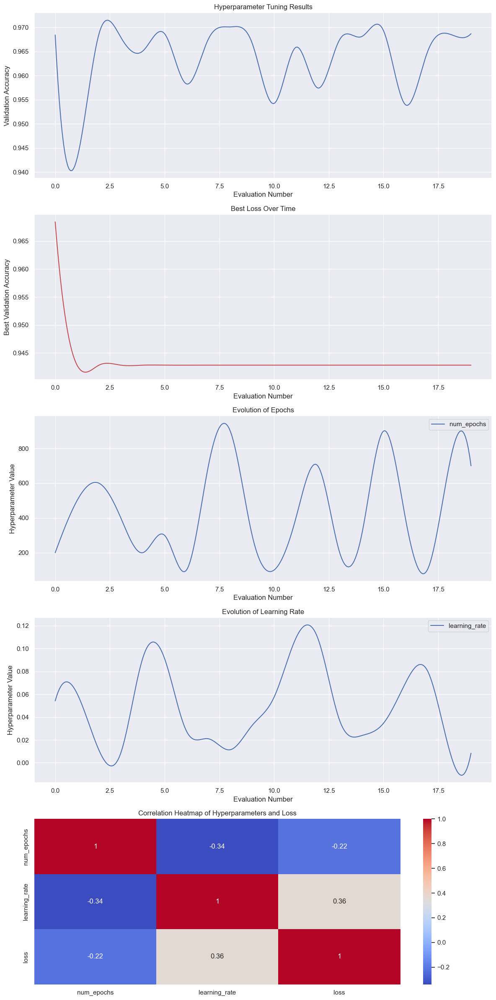

Best num_epochs: 900
Best learning_rate: 0.01143710866630004


In [35]:
logging.getLogger('hyperopt.tpe').setLevel(logging.ERROR)
trials = Trials()
best = fmin(
    fn=objective,
    space=space,
    algo=tpe.suggest,
    max_evals=20,
    trials=trials,
    verbose=True,
    rstate=np.random.default_rng(),
    show_progressbar=True,
    return_argmin=False,
)
print("Best hyperparameters found:", best)

results_df = pd.DataFrame({
    'num_epochs': [trial['misc']['vals']['num_epochs'][0] for trial in trials.trials],
    'learning_rate': [trial['misc']['vals']['learning_rate'][0] for trial in trials.trials],
    'loss': [trial['result']['loss'] for trial in trials.trials],
})
losses = [-trial['result']['loss'] for trial in trials.trials]

def smooth_curve(x, y):
    x_smooth = np.linspace(min(x), max(x), 300)
    spl = make_interp_spline(x, y, k=3)  # Cubic spline interpolation
    y_smooth = spl(x_smooth)
    return x_smooth, y_smooth

s = "Orginal"
fig, axs = plt.subplots(5, 1, figsize=(12, 24))
# Smooth losses
x_smooth, smoothed_losses = smooth_curve(range(len(losses)), losses)
sns.lineplot(x=x_smooth, y=smoothed_losses, color='b', ax=axs[0])
axs[0].set_title('Hyperparameter Tuning Results')
axs[0].set_xlabel('Evaluation Number')
axs[0].set_ylabel('Validation Accuracy')

# Best losses over time
best_losses = [min(losses[:i+1]) for i in range(len(losses))]
x_smooth_best, smoothed_best_losses = smooth_curve(range(len(best_losses)), best_losses)
sns.lineplot(x=x_smooth_best, y=smoothed_best_losses, color='r', ax=axs[1])
axs[1].set_title('Best Loss Over Time')
axs[1].set_xlabel('Evaluation Number')
axs[1].set_ylabel('Best Validation Accuracy')

# Evolution of epochs
x_smooth_epochs, smoothed_epochs = smooth_curve(range(len(results_df['num_epochs'])), results_df['num_epochs'])
sns.lineplot(x=x_smooth_epochs, y=smoothed_epochs,label='num_epochs', ax=axs[2])
axs[2].set_title('Evolution of Epochs')
axs[2].set_xlabel('Evaluation Number')
axs[2].set_ylabel('Hyperparameter Value')

# Evolution of learning rate
x_smooth_lr, smoothed_learning_rate = smooth_curve(range(len(results_df['learning_rate'])), results_df['learning_rate'])
sns.lineplot(x=x_smooth_lr, y=smoothed_learning_rate, label='learning_rate', ax=axs[3])
axs[3].set_title('Evolution of Learning Rate')
axs[3].set_xlabel('Evaluation Number')
axs[3].set_ylabel('Hyperparameter Value')

# Correlation heatmap
sns.heatmap(results_df.corr(), annot=True, cmap='coolwarm', ax=axs[4])
axs[4].set_title('Correlation Heatmap of Hyperparameters and Loss')

plt.tight_layout()
save_path = f"../Methodology/HT{s}.png"
plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

optimal_num_epochs = best['num_epochs']
optimal_learning_rate = best['learning_rate']
print(f"Best num_epochs: {optimal_num_epochs}")
print(f"Best learning_rate: {optimal_learning_rate}")

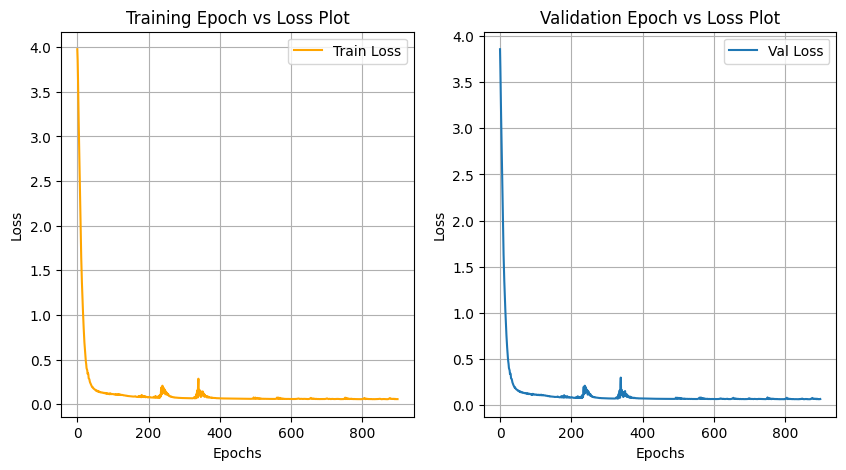

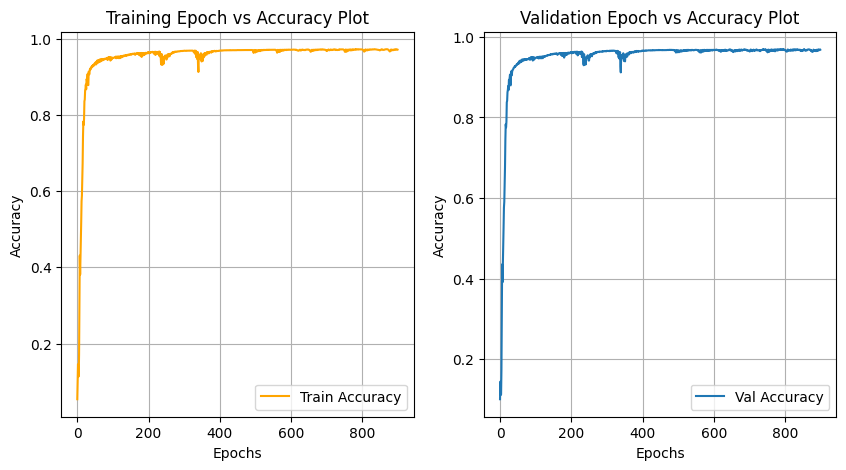

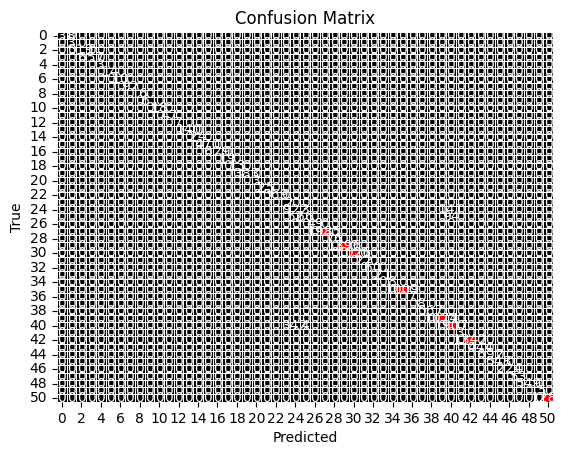

Test Accuracy: 96.81%


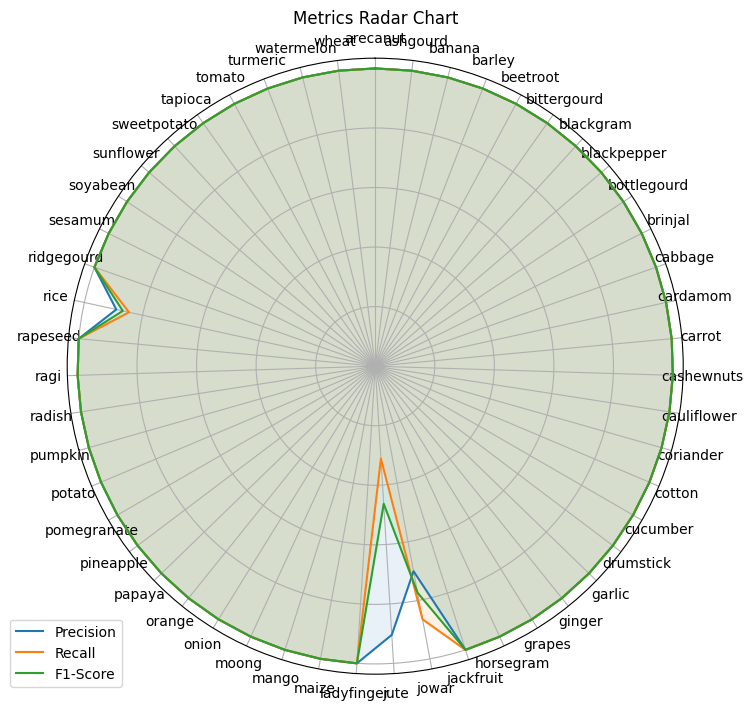

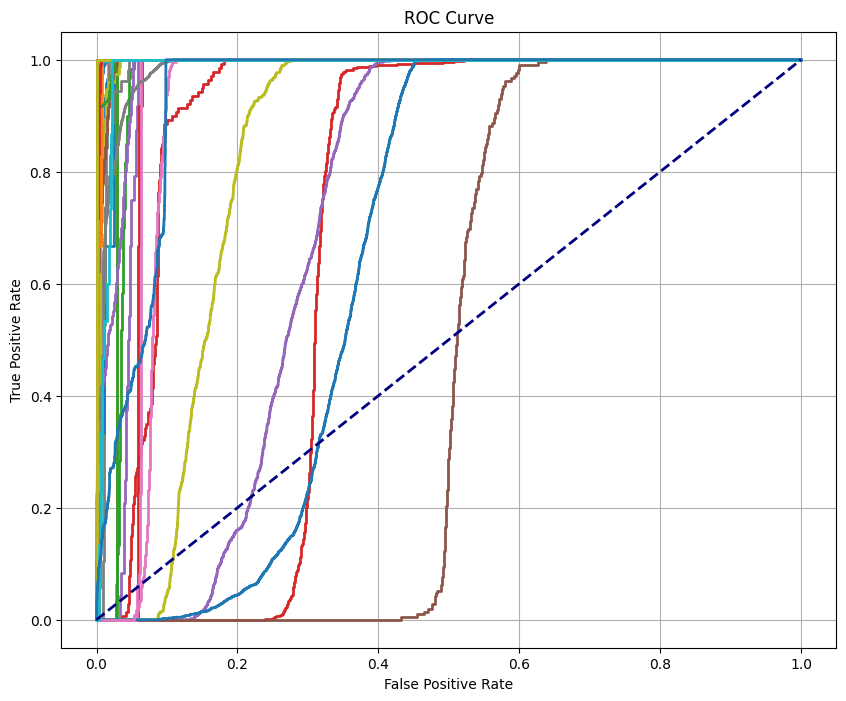

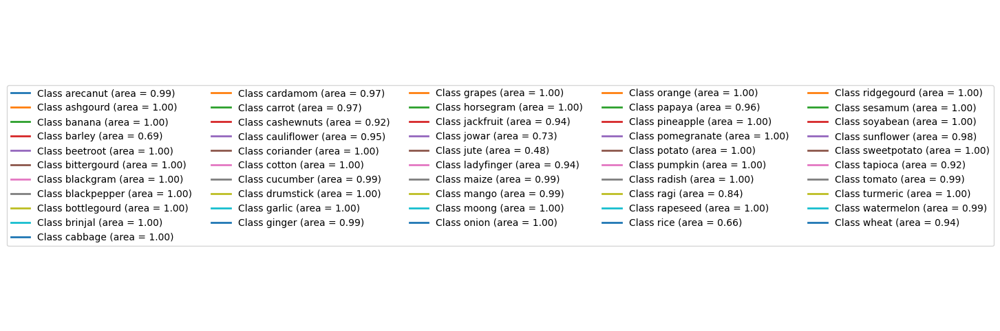

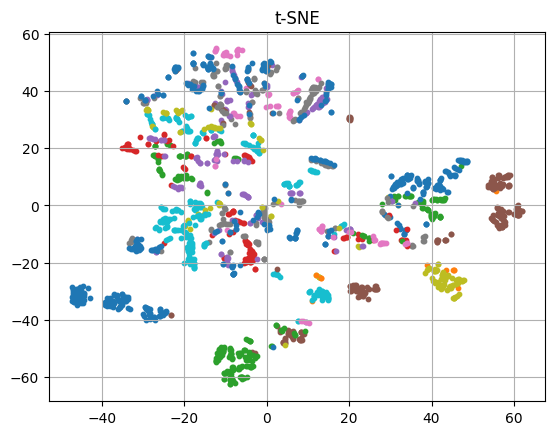

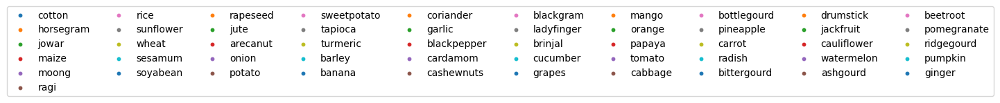

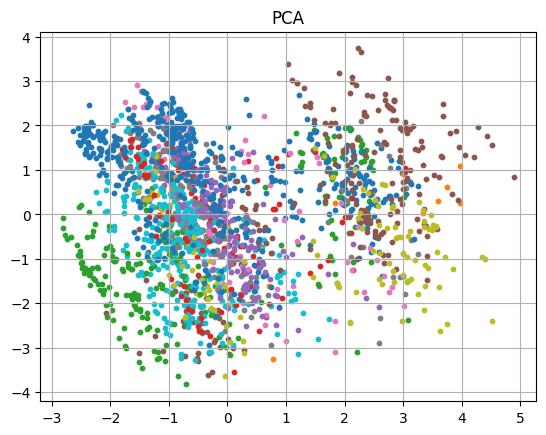

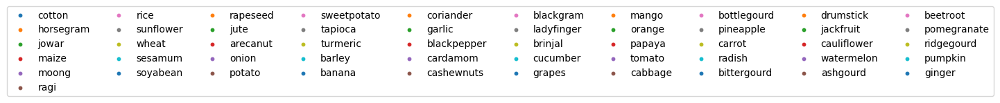

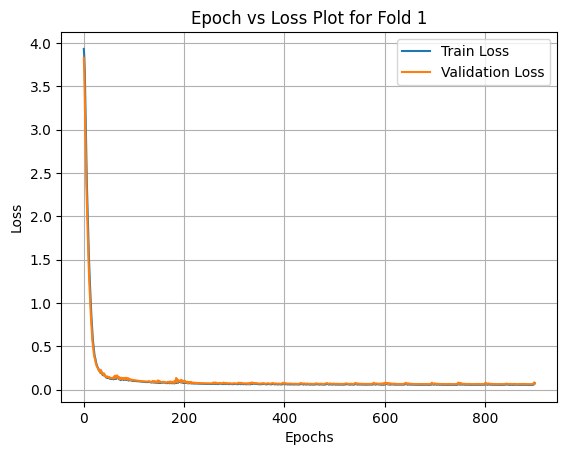

Epoch [900/900], Train Loss: 0.0759, Validation Loss: 0.0695
Fold 1, Train Loss: 0.05960443988442421, Train Accuracy: 96.96%, Validation Loss: 0.06946093589067459, Validation Accuracy: 96.62%
Fold 1, Train Precision: 0.9731, Train Recall: 0.9696,Train Negative Rate: 0.9994 ,Train F1: 0.9700
Fold 1, Validation Precision: 0.9703, Validation Recall: 0.9662,Validation Negative Rate: 0.9993 ,Validation F1: 0.9666
Fold 2, Train Loss: 0.05654038488864899, Train Accuracy: 97.11%, Validation Loss: 0.06234600022435188, Validation Accuracy: 96.71%
Fold 2, Train Precision: 0.9728, Train Recall: 0.9711,Train Negative Rate: 0.9994 ,Train F1: 0.9712
Fold 2, Validation Precision: 0.9695, Validation Recall: 0.9671,Validation Negative Rate: 0.9993 ,Validation F1: 0.9671
Fold 3, Train Loss: 0.05539054423570633, Train Accuracy: 97.18%, Validation Loss: 0.06016426905989647, Validation Accuracy: 97.12%
Fold 3, Train Precision: 0.9725, Train Recall: 0.9718,Train Negative Rate: 0.9994 ,Train F1: 0.9718
Fold 3

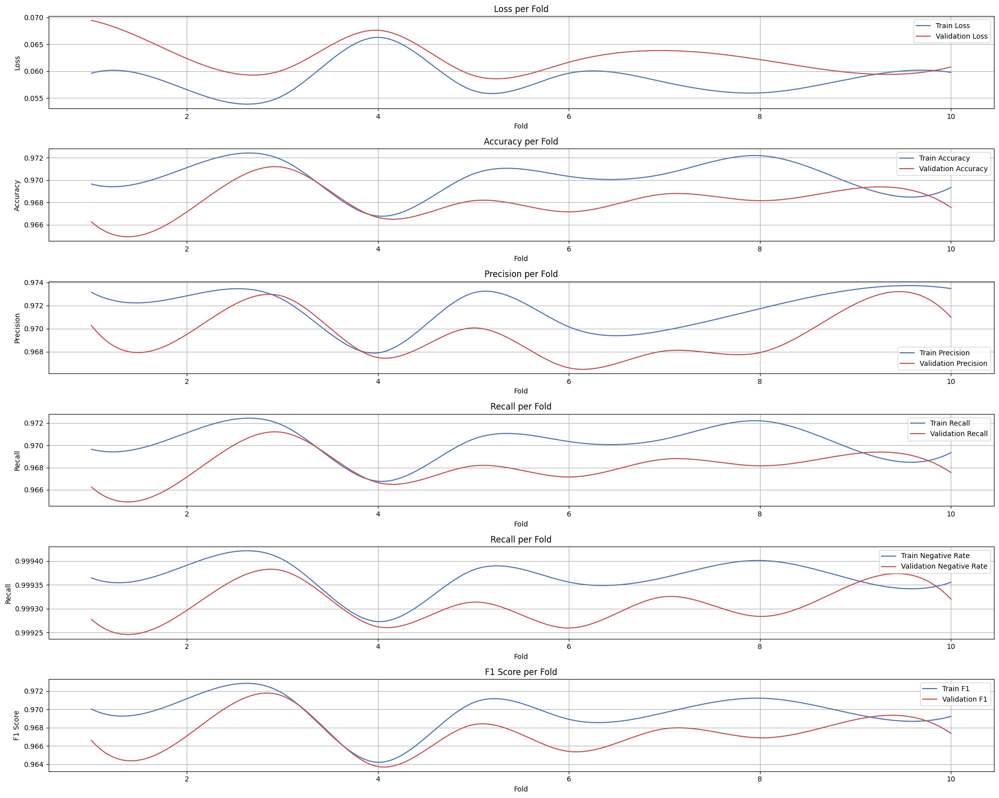

Average Train Loss: 0.0586
Average Validation Loss: 0.0627
Average Train Accuracy: 97.0185%
Average Validation Accuracy: 96.8019%
Average Train Precision: 97.1811%
Average Validation Precision: 96.9586%
Average Train Recall: 97.0185%
Average Validation Recall: 96.8019%
Average Train Negative Rate: 99.9365%
Average Validation Negative Rate: 99.9307%
Average Train F1: 96.9640%
Average Validation F1: 96.7372%


In [36]:
sns.reset_orig()
model,criterion = train_validation(train_features, test_features, train_target, test_target,name,optimal_num_epochs, optimal_learning_rate)
df1 = cross_check(features,target,name,10,optimal_num_epochs, optimal_learning_rate)
sns.set_theme()

In [37]:
features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("Random OverSampler")
ROSample = RandomOverSampler(sampling_strategy="all")
features,target = ROSample.fit_resample(features,target)

resampled_data = pd.DataFrame(features)
resampled_data['Crop'] = target
limited_data = resampled_data.groupby('Crop', group_keys=False).apply(
    lambda x: x.sample(n=1000, random_state=42) if len(x) > 1000 else x
).reset_index(drop=True)
features = limited_data.drop(columns=['Crop']).values
target = limited_data['Crop'].values

features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")
name = f"{model_name}_ROS"
train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
# pso_history = []
# optimal_num_epochs, optimal_learning_rate = pso_optimize(
#     train_features, 
#     test_features, 
#     train_target, 
#     test_target, 
#     lb, 
#     ub,
#     num_particles=20,
#     maxiter=10
# )


Random OverSampler


C:\Users\shyam\AppData\Local\Temp\ipykernel_21432\4109702440.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  limited_data = resampled_data.groupby('Crop', group_keys=False).apply(


100%|██████████| 20/20 [00:59<00:00,  2.97s/trial, best loss: -0.9908823529411764]
Best hyperparameters found: {'learning_rate': 0.007764380780095308, 'num_epochs': 900}


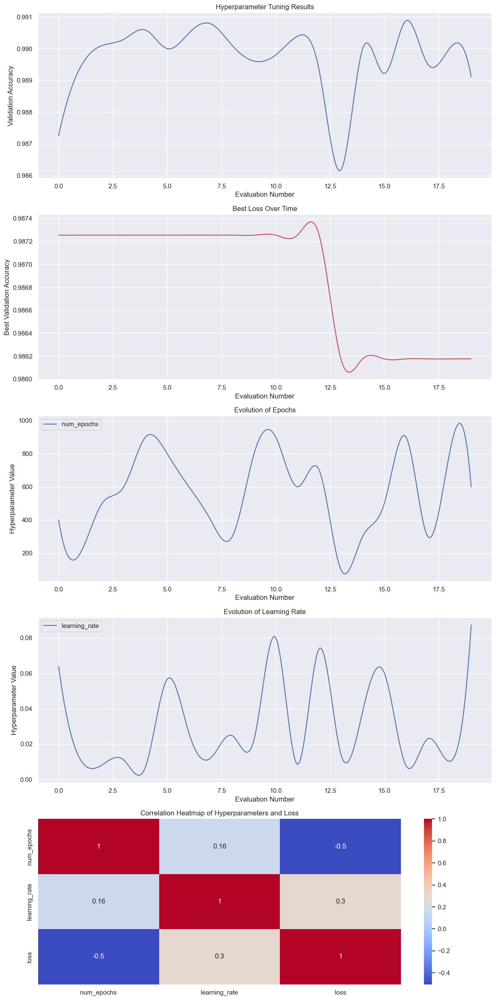

Best num_epochs: 900
Best learning_rate: 0.007764380780095308


In [38]:
logging.getLogger('hyperopt.tpe').setLevel(logging.ERROR)
trials = Trials()
best = fmin(
    fn=objective,
    space=space,
    algo=tpe.suggest,
    max_evals=20,
    trials=trials,
    verbose=True,
    rstate=np.random.default_rng(),
    show_progressbar=True,
    return_argmin=False,
)
print("Best hyperparameters found:", best)

results_df = pd.DataFrame({
    'num_epochs': [trial['misc']['vals']['num_epochs'][0] for trial in trials.trials],
    'learning_rate': [trial['misc']['vals']['learning_rate'][0] for trial in trials.trials],
    'loss': [trial['result']['loss'] for trial in trials.trials],
})
losses = [-trial['result']['loss'] for trial in trials.trials]

def smooth_curve(x, y):
    x_smooth = np.linspace(min(x), max(x), 300)
    spl = make_interp_spline(x, y, k=3)  # Cubic spline interpolation
    y_smooth = spl(x_smooth)
    return x_smooth, y_smooth

s = "ROS"
fig, axs = plt.subplots(5, 1, figsize=(12, 24))
# Smooth losses
x_smooth, smoothed_losses = smooth_curve(range(len(losses)), losses)
sns.lineplot(x=x_smooth, y=smoothed_losses, color='b', ax=axs[0])
axs[0].set_title('Hyperparameter Tuning Results')
axs[0].set_xlabel('Evaluation Number')
axs[0].set_ylabel('Validation Accuracy')

# Best losses over time
best_losses = [min(losses[:i+1]) for i in range(len(losses))]
x_smooth_best, smoothed_best_losses = smooth_curve(range(len(best_losses)), best_losses)
sns.lineplot(x=x_smooth_best, y=smoothed_best_losses, color='r', ax=axs[1])
axs[1].set_title('Best Loss Over Time')
axs[1].set_xlabel('Evaluation Number')
axs[1].set_ylabel('Best Validation Accuracy')

# Evolution of epochs
x_smooth_epochs, smoothed_epochs = smooth_curve(range(len(results_df['num_epochs'])), results_df['num_epochs'])
sns.lineplot(x=x_smooth_epochs, y=smoothed_epochs,label='num_epochs', ax=axs[2])
axs[2].set_title('Evolution of Epochs')
axs[2].set_xlabel('Evaluation Number')
axs[2].set_ylabel('Hyperparameter Value')

# Evolution of learning rate
x_smooth_lr, smoothed_learning_rate = smooth_curve(range(len(results_df['learning_rate'])), results_df['learning_rate'])
sns.lineplot(x=x_smooth_lr, y=smoothed_learning_rate, label='learning_rate', ax=axs[3])
axs[3].set_title('Evolution of Learning Rate')
axs[3].set_xlabel('Evaluation Number')
axs[3].set_ylabel('Hyperparameter Value')

# Correlation heatmap
sns.heatmap(results_df.corr(), annot=True, cmap='coolwarm', ax=axs[4])
axs[4].set_title('Correlation Heatmap of Hyperparameters and Loss')

plt.tight_layout()
save_path = f"../Methodology/HT{s}.png"
plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

optimal_num_epochs = best['num_epochs']
optimal_learning_rate = best['learning_rate']
print(f"Best num_epochs: {optimal_num_epochs}")
print(f"Best learning_rate: {optimal_learning_rate}")

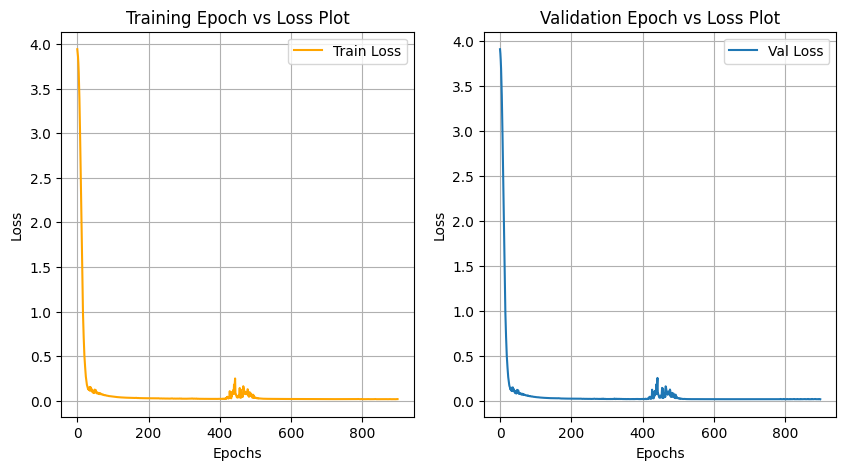

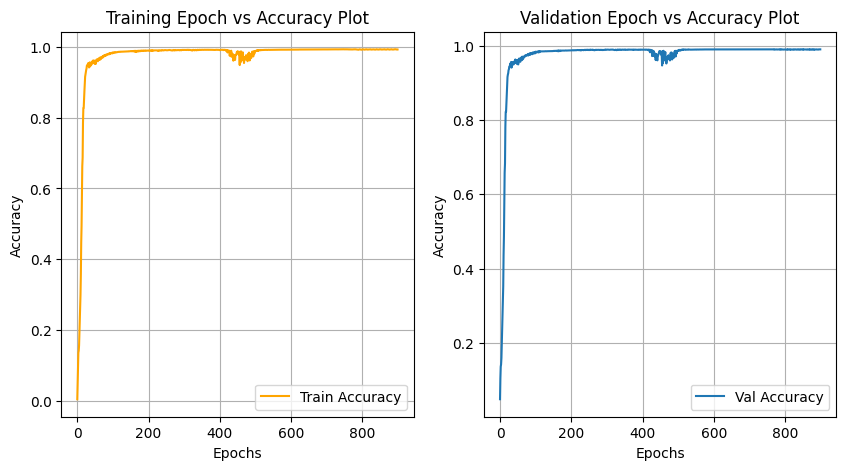

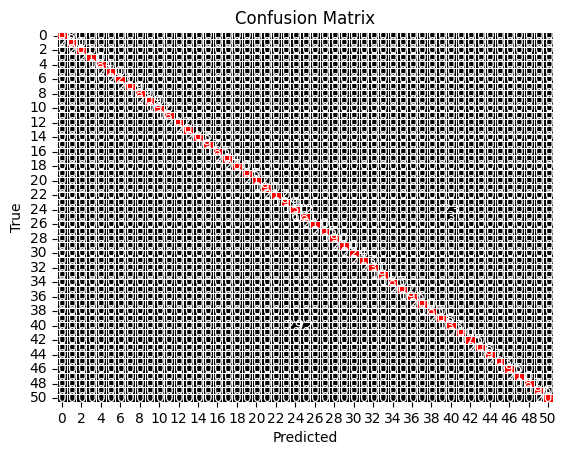

Test Accuracy: 99.07%


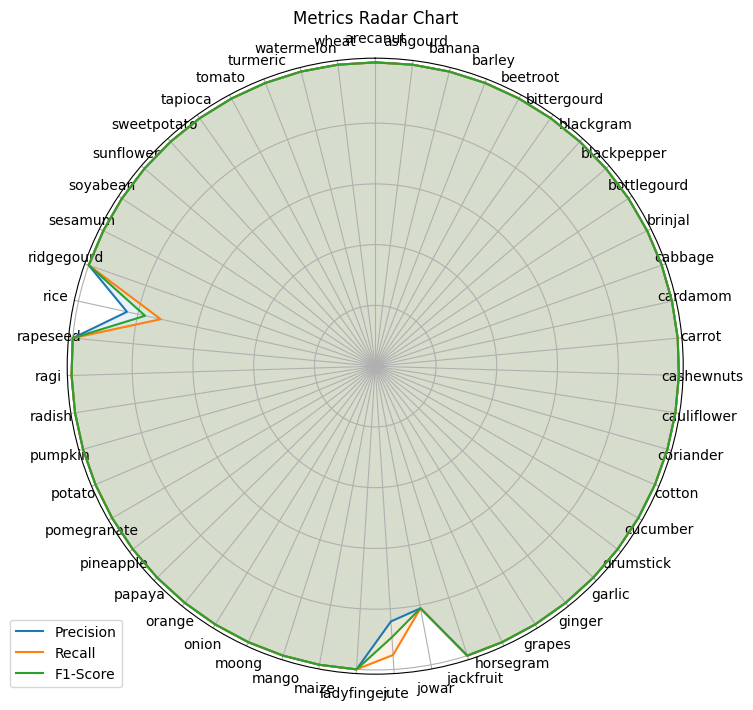

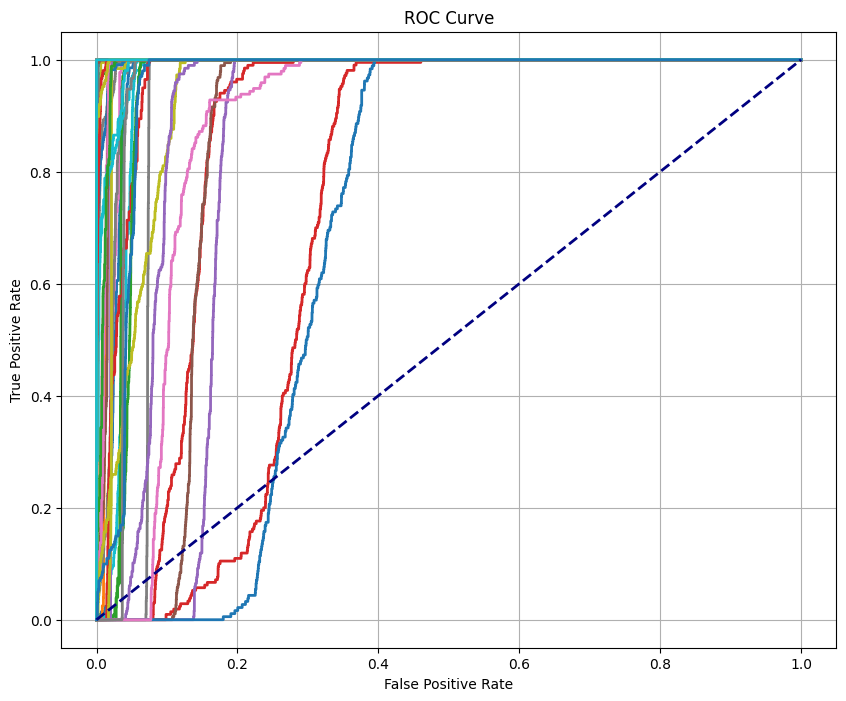

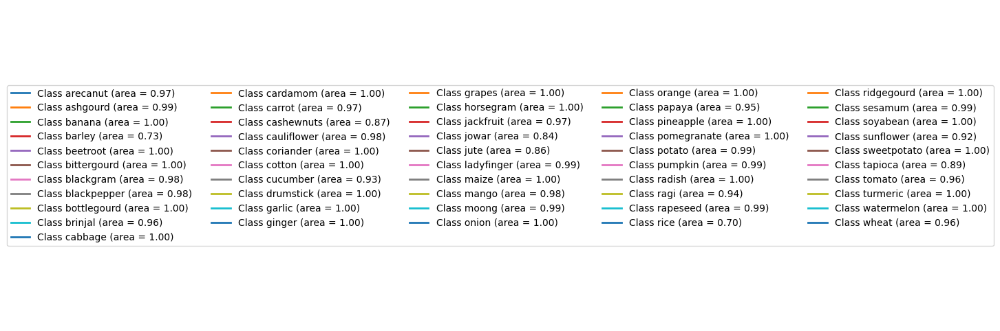

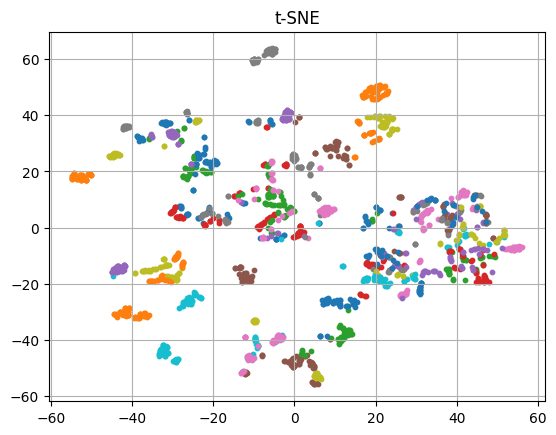

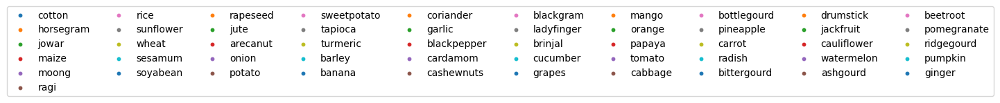

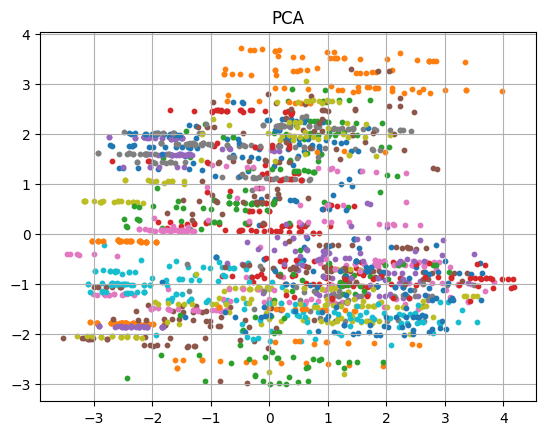

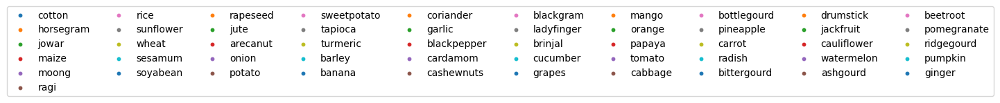

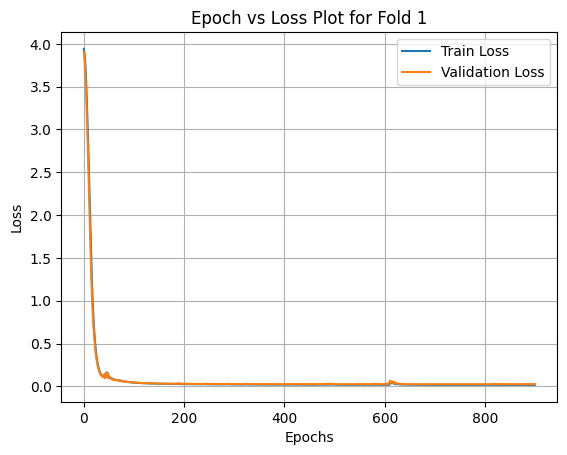

Epoch [900/900], Train Loss: 0.0173, Validation Loss: 0.0265
Fold 1, Train Loss: 0.017723148688673973, Train Accuracy: 99.20%, Validation Loss: 0.02651129849255085, Validation Accuracy: 98.94%
Fold 1, Train Precision: 0.9920, Train Recall: 0.9920,Train Negative Rate: 0.9998 ,Train F1: 0.9919
Fold 1, Validation Precision: 0.9895, Validation Recall: 0.9894,Validation Negative Rate: 0.9998 ,Validation F1: 0.9892
Fold 2, Train Loss: 0.016828443855047226, Train Accuracy: 99.26%, Validation Loss: 0.021351782605051994, Validation Accuracy: 99.25%
Fold 2, Train Precision: 0.9927, Train Recall: 0.9926,Train Negative Rate: 0.9999 ,Train F1: 0.9925
Fold 2, Validation Precision: 0.9927, Validation Recall: 0.9925,Validation Negative Rate: 0.9999 ,Validation F1: 0.9924
Fold 3, Train Loss: 0.01826779730618, Train Accuracy: 99.20%, Validation Loss: 0.022499902173876762, Validation Accuracy: 98.92%
Fold 3, Train Precision: 0.9920, Train Recall: 0.9920,Train Negative Rate: 0.9998 ,Train F1: 0.9919
Fold 

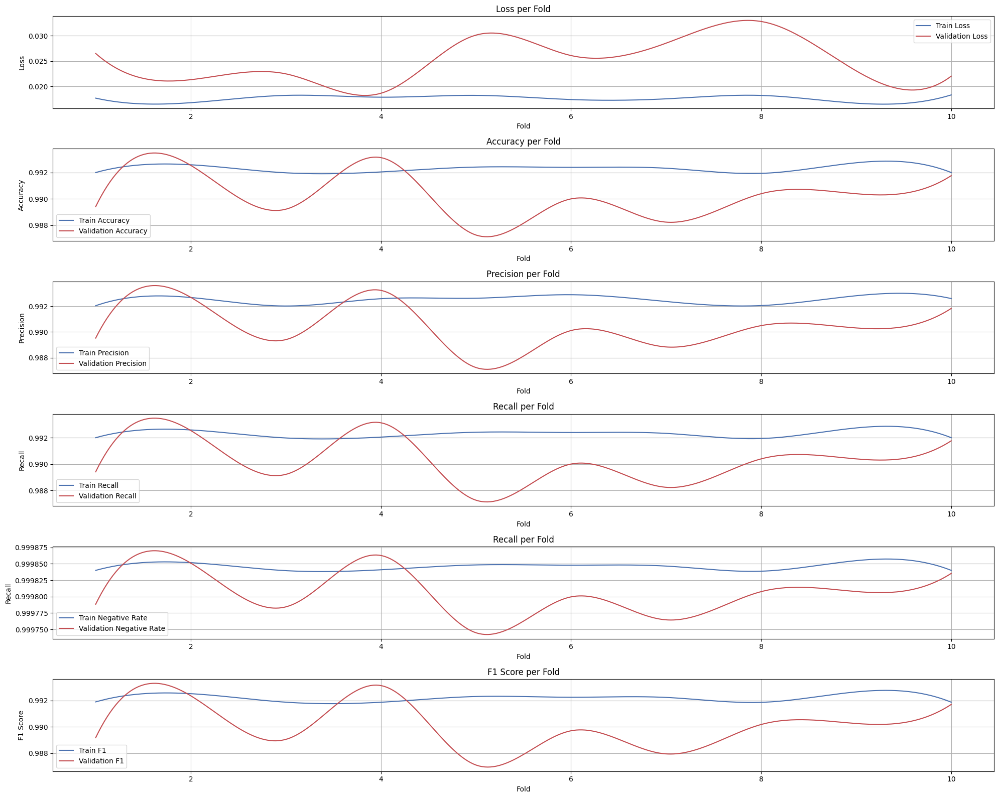

Average Train Loss: 0.0177
Average Validation Loss: 0.0252
Average Train Accuracy: 99.2246%
Average Validation Accuracy: 99.0235%
Average Train Precision: 99.2468%
Average Validation Precision: 99.0369%
Average Train Recall: 99.2246%
Average Validation Recall: 99.0235%
Average Train Negative Rate: 99.9845%
Average Validation Negative Rate: 99.9805%
Average Train F1: 99.2126%
Average Validation F1: 99.0056%


In [39]:
sns.reset_orig()
model,criterion = train_validation(train_features, test_features, train_target, test_target,name,optimal_num_epochs, optimal_learning_rate)
df2 = cross_check(features,target,name,10,optimal_num_epochs, optimal_learning_rate)
sns.set_theme()

In [40]:
features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("Random UnderSampler")
ROSample = RandomUnderSampler(sampling_strategy="all")
features,target = ROSample.fit_resample(features,target)


features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")
name = f"{model_name}_RUS"
train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
# pso_history = []
# optimal_num_epochs, optimal_learning_rate = pso_optimize(
#     train_features, 
#     test_features, 
#     train_target, 
#     test_target, 
#     lb, 
#     ub,
#     num_particles=20,
#     maxiter=10
# )


Random UnderSampler


100%|██████████| 20/20 [00:32<00:00,  1.62s/trial, best loss: -0.958041958041958]
Best hyperparameters found: {'learning_rate': 0.02445509001900085, 'num_epochs': 800}


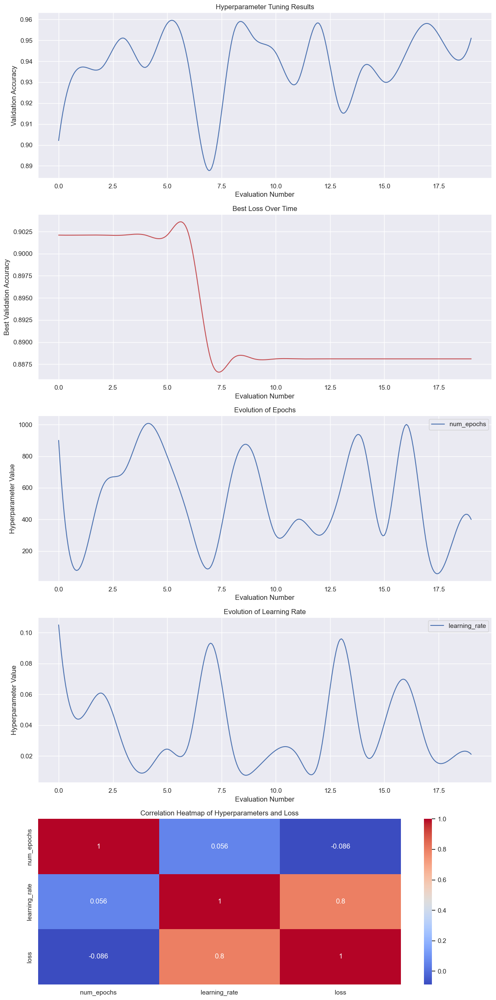

Best num_epochs: 800
Best learning_rate: 0.02445509001900085


In [41]:
logging.getLogger('hyperopt.tpe').setLevel(logging.ERROR)
trials = Trials()
best = fmin(
    fn=objective,
    space=space,
    algo=tpe.suggest,
    max_evals=20,
    trials=trials,
    verbose=True,
    rstate=np.random.default_rng(),
    show_progressbar=True,
    return_argmin=False,
)
print("Best hyperparameters found:", best)

results_df = pd.DataFrame({
    'num_epochs': [trial['misc']['vals']['num_epochs'][0] for trial in trials.trials],
    'learning_rate': [trial['misc']['vals']['learning_rate'][0] for trial in trials.trials],
    'loss': [trial['result']['loss'] for trial in trials.trials],
})
losses = [-trial['result']['loss'] for trial in trials.trials]

def smooth_curve(x, y):
    x_smooth = np.linspace(min(x), max(x), 300)
    spl = make_interp_spline(x, y, k=3)  # Cubic spline interpolation
    y_smooth = spl(x_smooth)
    return x_smooth, y_smooth

s = "RUS"
fig, axs = plt.subplots(5, 1, figsize=(12, 24))
# Smooth losses
x_smooth, smoothed_losses = smooth_curve(range(len(losses)), losses)
sns.lineplot(x=x_smooth, y=smoothed_losses, color='b', ax=axs[0])
axs[0].set_title('Hyperparameter Tuning Results')
axs[0].set_xlabel('Evaluation Number')
axs[0].set_ylabel('Validation Accuracy')

# Best losses over time
best_losses = [min(losses[:i+1]) for i in range(len(losses))]
x_smooth_best, smoothed_best_losses = smooth_curve(range(len(best_losses)), best_losses)
sns.lineplot(x=x_smooth_best, y=smoothed_best_losses, color='r', ax=axs[1])
axs[1].set_title('Best Loss Over Time')
axs[1].set_xlabel('Evaluation Number')
axs[1].set_ylabel('Best Validation Accuracy')

# Evolution of epochs
x_smooth_epochs, smoothed_epochs = smooth_curve(range(len(results_df['num_epochs'])), results_df['num_epochs'])
sns.lineplot(x=x_smooth_epochs, y=smoothed_epochs,label='num_epochs', ax=axs[2])
axs[2].set_title('Evolution of Epochs')
axs[2].set_xlabel('Evaluation Number')
axs[2].set_ylabel('Hyperparameter Value')

# Evolution of learning rate
x_smooth_lr, smoothed_learning_rate = smooth_curve(range(len(results_df['learning_rate'])), results_df['learning_rate'])
sns.lineplot(x=x_smooth_lr, y=smoothed_learning_rate, label='learning_rate', ax=axs[3])
axs[3].set_title('Evolution of Learning Rate')
axs[3].set_xlabel('Evaluation Number')
axs[3].set_ylabel('Hyperparameter Value')

# Correlation heatmap
sns.heatmap(results_df.corr(), annot=True, cmap='coolwarm', ax=axs[4])
axs[4].set_title('Correlation Heatmap of Hyperparameters and Loss')

plt.tight_layout()
save_path = f"../Methodology/HT{s}.png"
plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

optimal_num_epochs = best['num_epochs']
optimal_learning_rate = best['learning_rate']
print(f"Best num_epochs: {optimal_num_epochs}")
print(f"Best learning_rate: {optimal_learning_rate}")

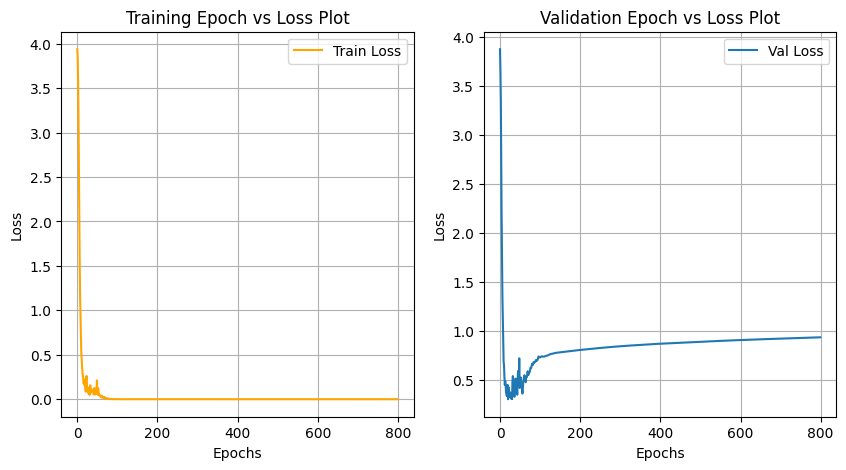

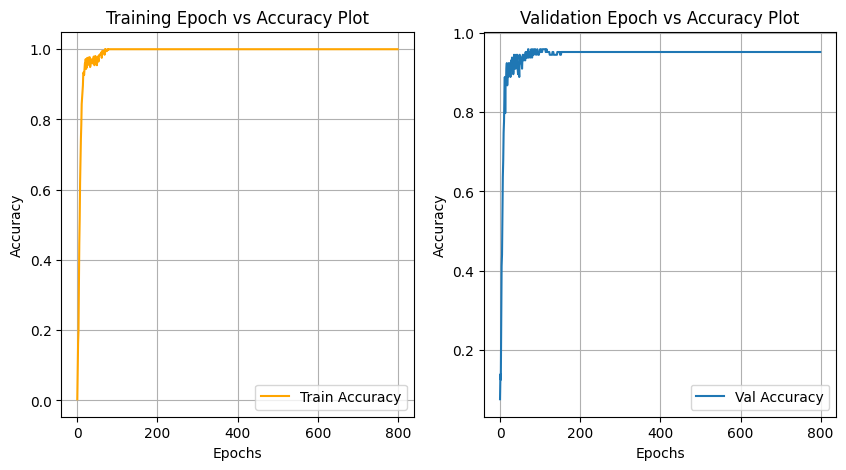

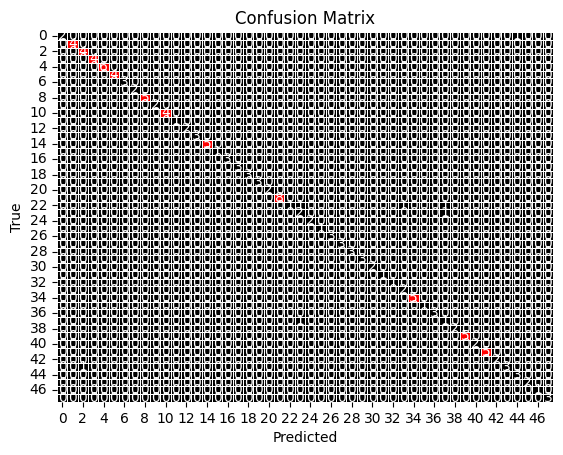

Test Accuracy: 95.10%


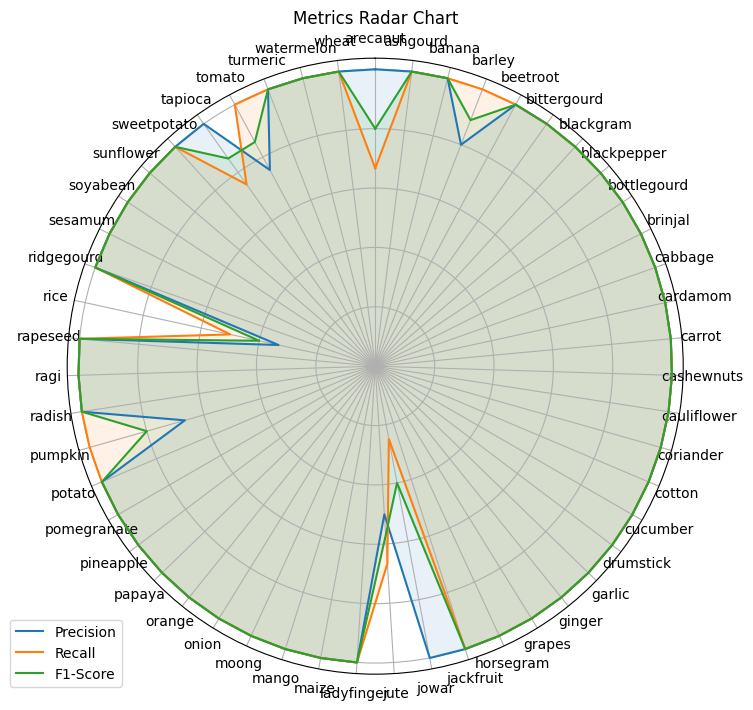

d:\Projects\.venv\lib\site-packages\sklearn\metrics\_ranking.py:1183: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
d:\Projects\.venv\lib\site-packages\sklearn\metrics\_ranking.py:1183: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
d:\Projects\.venv\lib\site-packages\sklearn\metrics\_ranking.py:1183: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


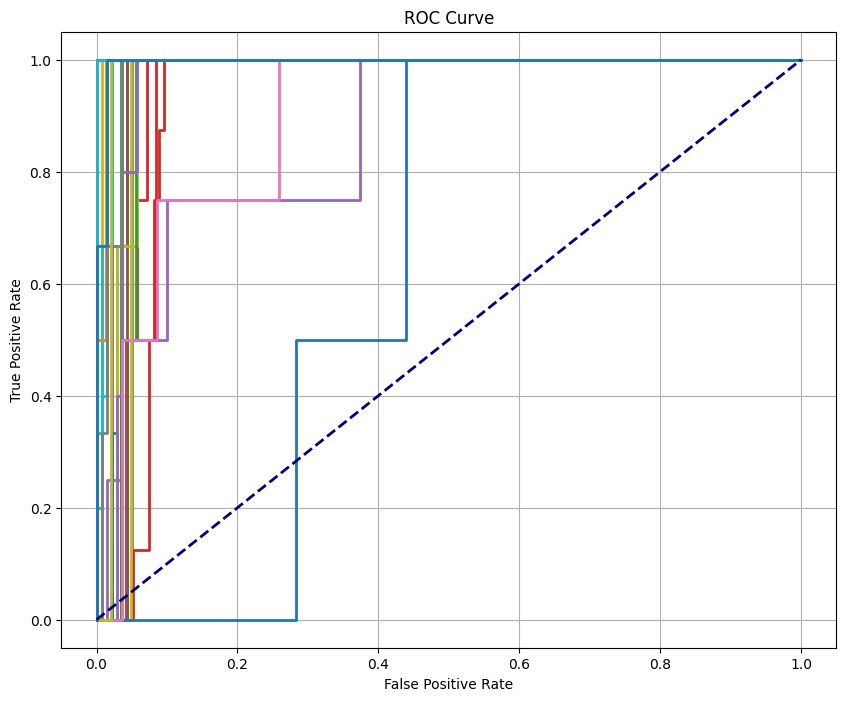

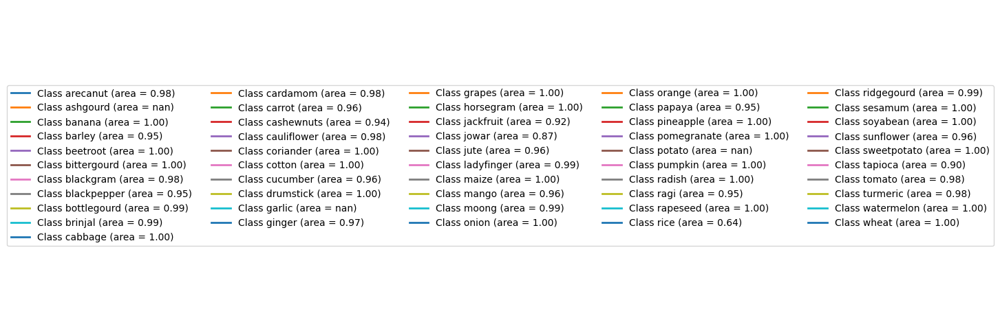

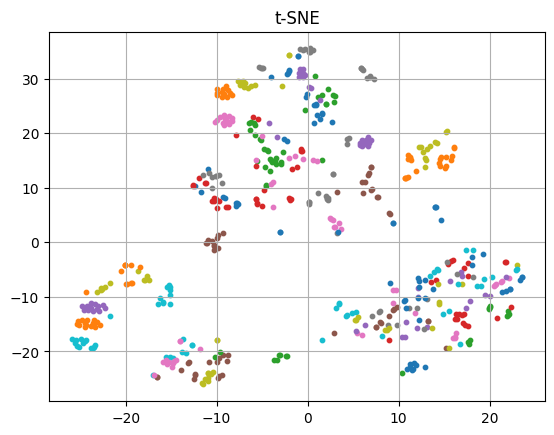

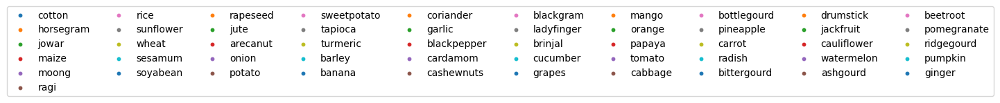

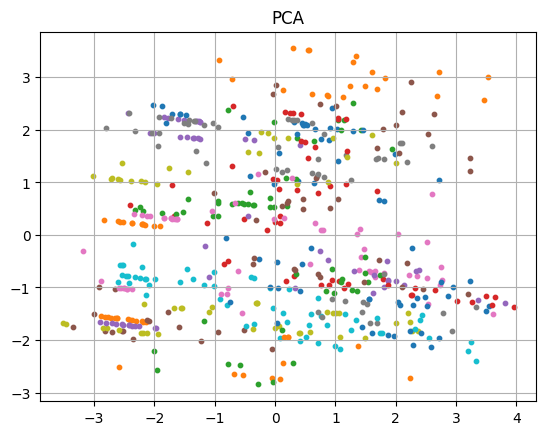

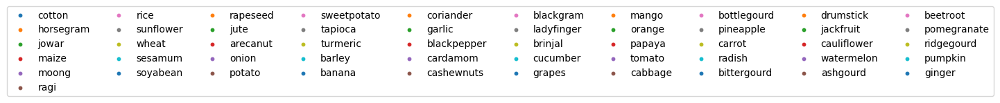

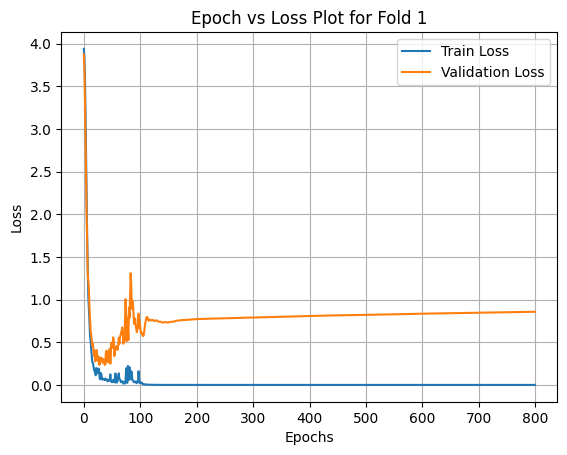

Epoch [800/800], Train Loss: 0.0000, Validation Loss: 0.8578
Fold 1, Train Loss: 7.875672054069582e-06, Train Accuracy: 100.00%, Validation Loss: 0.8578144907951355, Validation Accuracy: 94.44%
Fold 1, Train Precision: 1.0000, Train Recall: 1.0000,Train Negative Rate: 1.0000 ,Train F1: 1.0000
Fold 1, Validation Precision: 0.9630, Validation Recall: 0.9444,Validation Negative Rate: 0.9987 ,Validation F1: 0.9454
Fold 2, Train Loss: 9.630570275476202e-06, Train Accuracy: 100.00%, Validation Loss: 1.090084433555603, Validation Accuracy: 94.44%
Fold 2, Train Precision: 1.0000, Train Recall: 1.0000,Train Negative Rate: 1.0000 ,Train F1: 1.0000
Fold 2, Validation Precision: 0.9606, Validation Recall: 0.9444,Validation Negative Rate: 0.9985 ,Validation F1: 0.9426
Fold 3, Train Loss: 8.631817763671279e-06, Train Accuracy: 100.00%, Validation Loss: 0.3783813416957855, Validation Accuracy: 97.22%
Fold 3, Train Precision: 1.0000, Train Recall: 1.0000,Train Negative Rate: 1.0000 ,Train F1: 1.0000
F

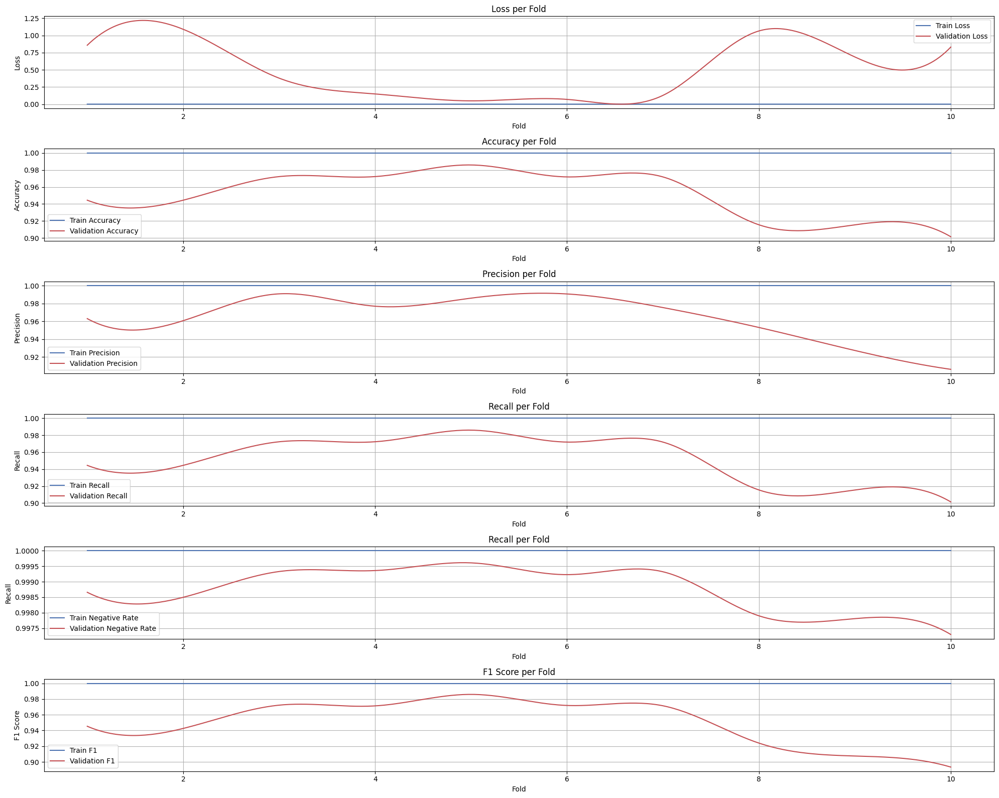

Average Train Loss: 0.0000
Average Validation Loss: 0.5304
Average Train Accuracy: 100.0000%
Average Validation Accuracy: 94.9531%
Average Train Precision: 100.0000%
Average Validation Precision: 96.2947%
Average Train Recall: 100.0000%
Average Validation Recall: 94.9531%
Average Train Negative Rate: 100.0000%
Average Validation Negative Rate: 99.8700%
Average Train F1: 100.0000%
Average Validation F1: 94.8554%


In [42]:
sns.reset_orig()
model,criterion = train_validation(train_features, test_features, train_target, test_target,name,optimal_num_epochs, optimal_learning_rate)
df3 = cross_check(features,target,name,10,optimal_num_epochs, optimal_learning_rate)
sns.set_theme()

In [43]:
features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("SMOTE")

ROSample = SMOTE()
features,target = ROSample.fit_resample(features,target)

resampled_data = pd.DataFrame(features)
resampled_data['Crop'] = target
limited_data = resampled_data.groupby('Crop', group_keys=False).apply(
    lambda x: x.sample(n=1000, random_state=42) if len(x) > 1000 else x
).reset_index(drop=True)
features = limited_data.drop(columns=['Crop']).values
target = limited_data['Crop'].values

features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")
name = f"{model_name}_SMOTE"
train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
# pso_history = []
# optimal_num_epochs, optimal_learning_rate = pso_optimize(
#     train_features, 
#     test_features, 
#     train_target, 
#     test_target, 
#     lb, 
#     ub,
#     num_particles=20,
#     maxiter=10
# )


SMOTE


C:\Users\shyam\AppData\Local\Temp\ipykernel_21432\3432304820.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  limited_data = resampled_data.groupby('Crop', group_keys=False).apply(


100%|██████████| 20/20 [00:58<00:00,  2.93s/trial, best loss: -0.9899019607843137]
Best hyperparameters found: {'learning_rate': 0.013700051466028167, 'num_epochs': 500}


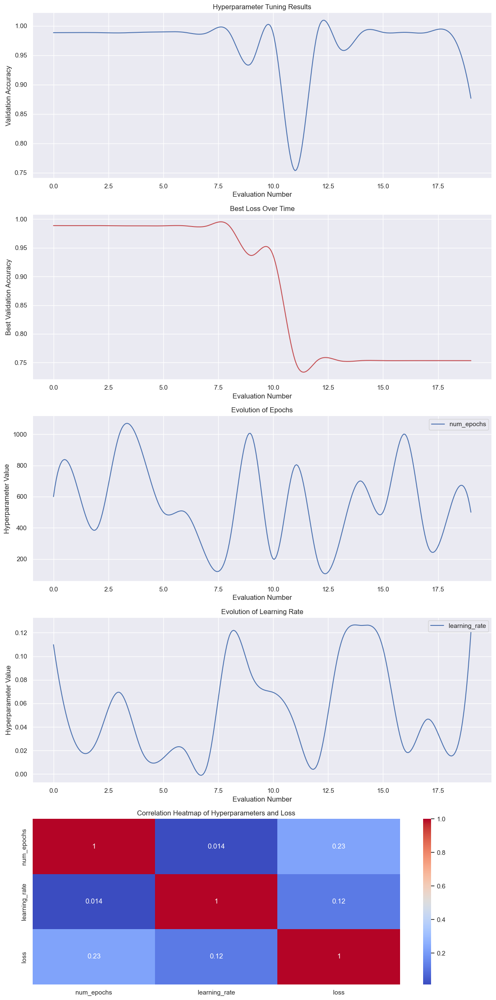

Best num_epochs: 500
Best learning_rate: 0.013700051466028167


In [44]:
logging.getLogger('hyperopt.tpe').setLevel(logging.ERROR)
trials = Trials()
best = fmin(
    fn=objective,
    space=space,
    algo=tpe.suggest,
    max_evals=20,
    trials=trials,
    verbose=True,
    rstate=np.random.default_rng(),
    show_progressbar=True,
    return_argmin=False,
)
print("Best hyperparameters found:", best)

results_df = pd.DataFrame({
    'num_epochs': [trial['misc']['vals']['num_epochs'][0] for trial in trials.trials],
    'learning_rate': [trial['misc']['vals']['learning_rate'][0] for trial in trials.trials],
    'loss': [trial['result']['loss'] for trial in trials.trials],
})
losses = [-trial['result']['loss'] for trial in trials.trials]

def smooth_curve(x, y):
    x_smooth = np.linspace(min(x), max(x), 300)
    spl = make_interp_spline(x, y, k=3)  # Cubic spline interpolation
    y_smooth = spl(x_smooth)
    return x_smooth, y_smooth

s = "SMOTE"
fig, axs = plt.subplots(5, 1, figsize=(12, 24))
# Smooth losses
x_smooth, smoothed_losses = smooth_curve(range(len(losses)), losses)
sns.lineplot(x=x_smooth, y=smoothed_losses, color='b', ax=axs[0])
axs[0].set_title('Hyperparameter Tuning Results')
axs[0].set_xlabel('Evaluation Number')
axs[0].set_ylabel('Validation Accuracy')

# Best losses over time
best_losses = [min(losses[:i+1]) for i in range(len(losses))]
x_smooth_best, smoothed_best_losses = smooth_curve(range(len(best_losses)), best_losses)
sns.lineplot(x=x_smooth_best, y=smoothed_best_losses, color='r', ax=axs[1])
axs[1].set_title('Best Loss Over Time')
axs[1].set_xlabel('Evaluation Number')
axs[1].set_ylabel('Best Validation Accuracy')

# Evolution of epochs
x_smooth_epochs, smoothed_epochs = smooth_curve(range(len(results_df['num_epochs'])), results_df['num_epochs'])
sns.lineplot(x=x_smooth_epochs, y=smoothed_epochs,label='num_epochs', ax=axs[2])
axs[2].set_title('Evolution of Epochs')
axs[2].set_xlabel('Evaluation Number')
axs[2].set_ylabel('Hyperparameter Value')

# Evolution of learning rate
x_smooth_lr, smoothed_learning_rate = smooth_curve(range(len(results_df['learning_rate'])), results_df['learning_rate'])
sns.lineplot(x=x_smooth_lr, y=smoothed_learning_rate, label='learning_rate', ax=axs[3])
axs[3].set_title('Evolution of Learning Rate')
axs[3].set_xlabel('Evaluation Number')
axs[3].set_ylabel('Hyperparameter Value')

# Correlation heatmap
sns.heatmap(results_df.corr(), annot=True, cmap='coolwarm', ax=axs[4])
axs[4].set_title('Correlation Heatmap of Hyperparameters and Loss')

plt.tight_layout()
save_path = f"../Methodology/HT{s}.png"
plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

optimal_num_epochs = best['num_epochs']
optimal_learning_rate = best['learning_rate']
print(f"Best num_epochs: {optimal_num_epochs}")
print(f"Best learning_rate: {optimal_learning_rate}")

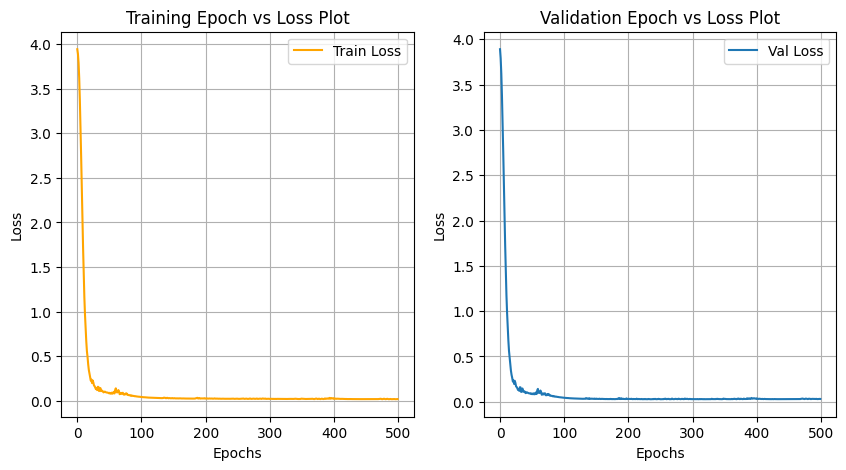

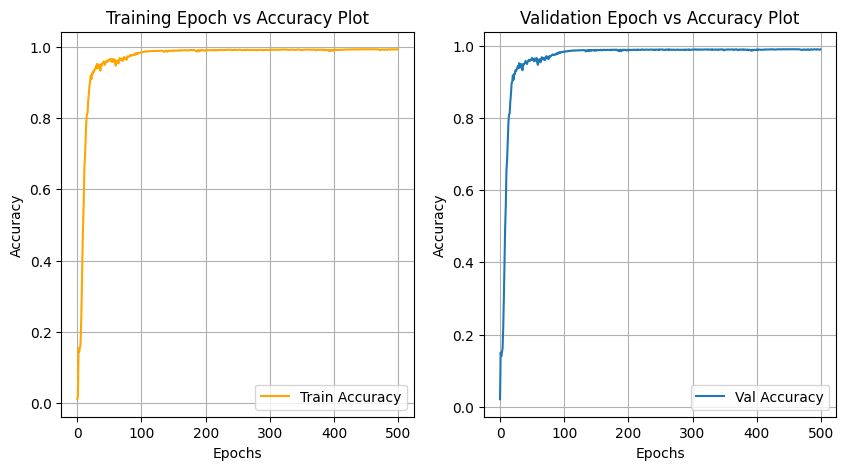

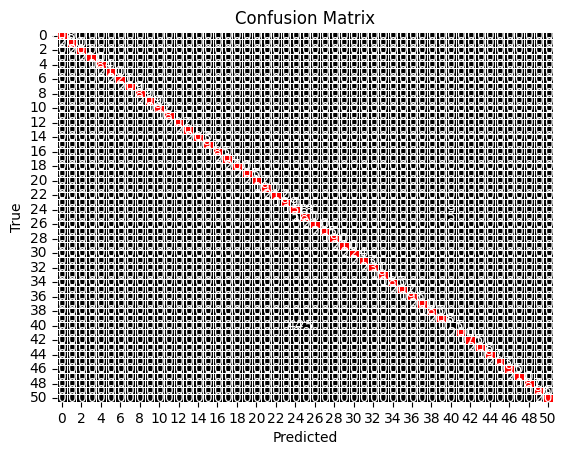

Test Accuracy: 98.96%


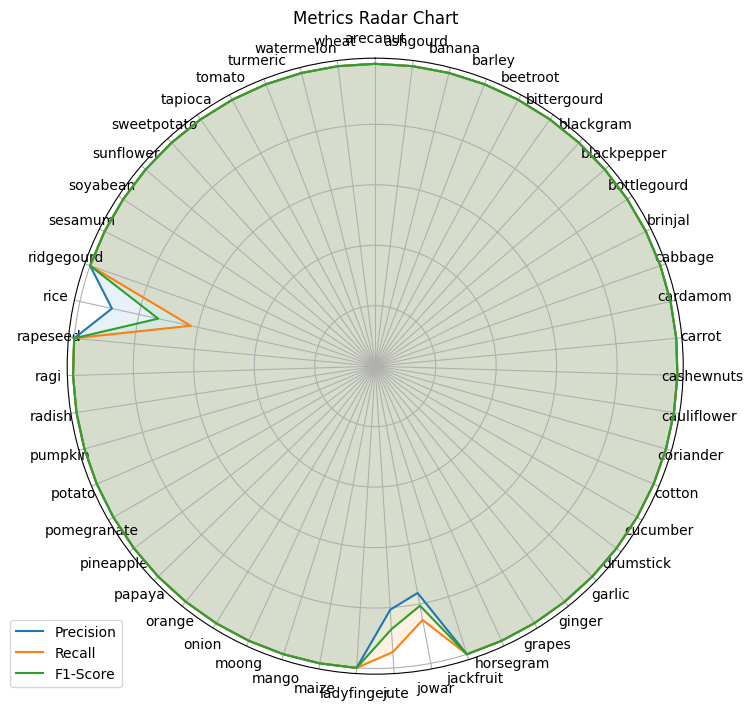

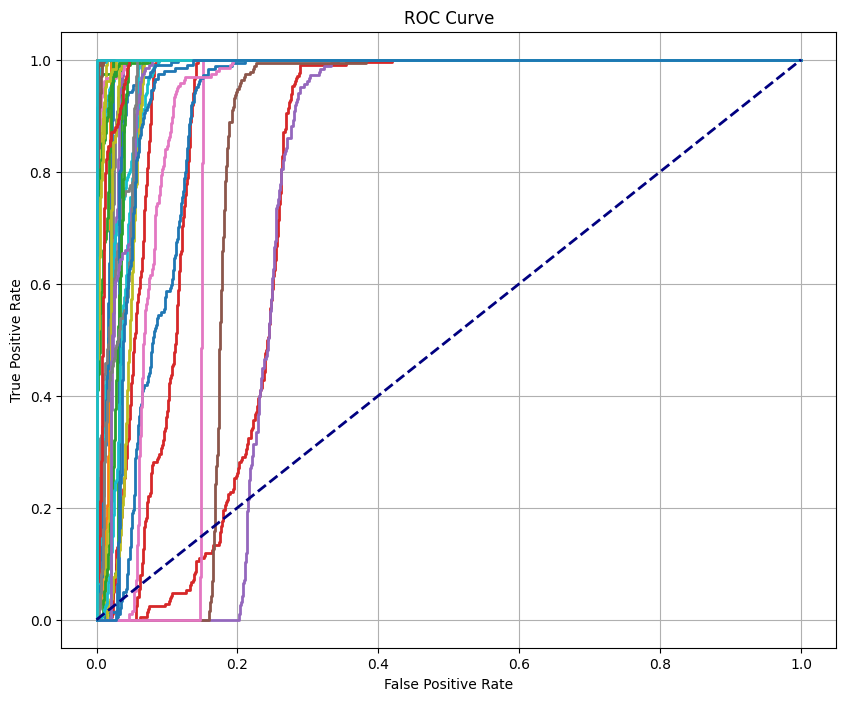

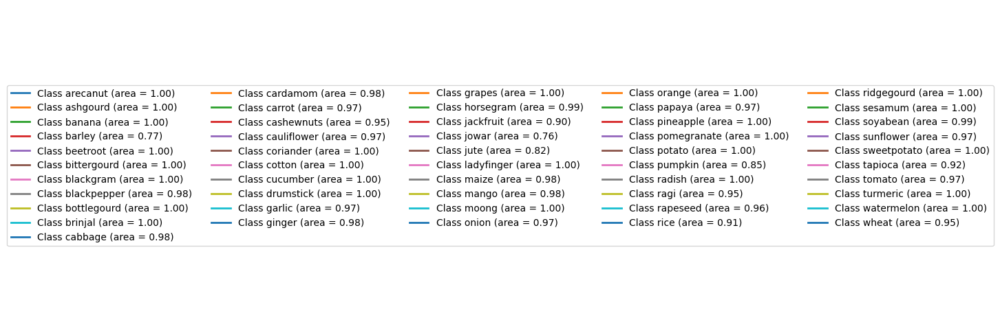

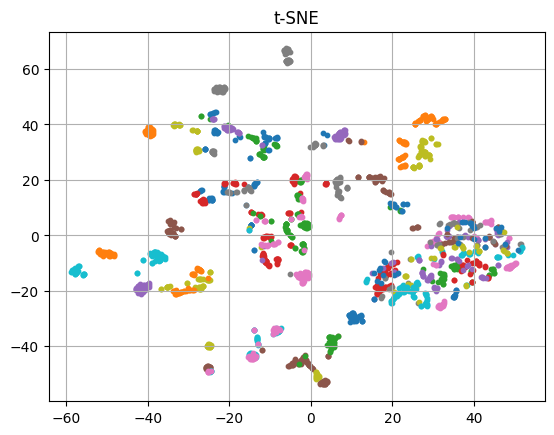

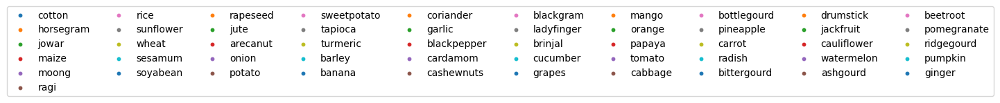

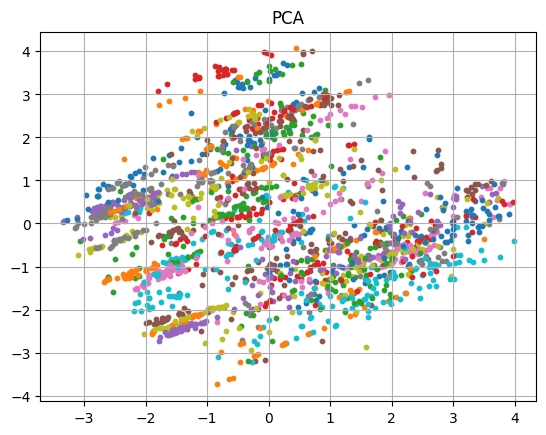

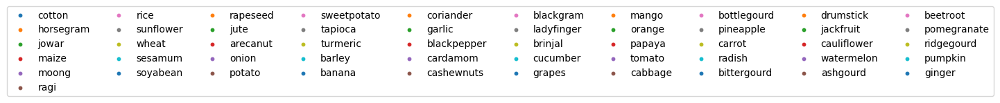

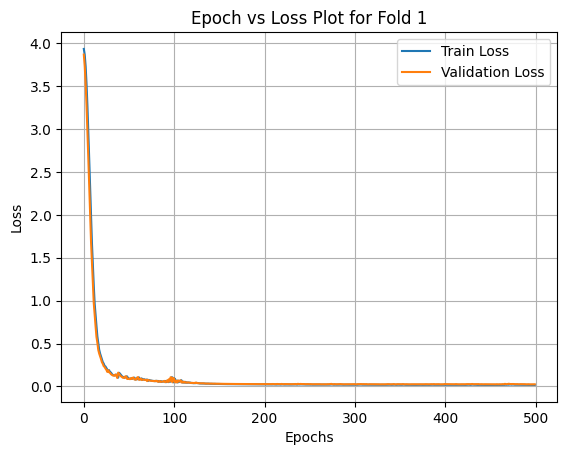

Epoch [500/500], Train Loss: 0.0180, Validation Loss: 0.0250
Fold 1, Train Loss: 0.017970701679587364, Train Accuracy: 99.23%, Validation Loss: 0.0249819103628397, Validation Accuracy: 98.98%
Fold 1, Train Precision: 0.9924, Train Recall: 0.9923,Train Negative Rate: 0.9998 ,Train F1: 0.9922
Fold 1, Validation Precision: 0.9901, Validation Recall: 0.9898,Validation Negative Rate: 0.9998 ,Validation F1: 0.9895
Fold 2, Train Loss: 0.019132154062390327, Train Accuracy: 99.20%, Validation Loss: 0.03458050638437271, Validation Accuracy: 98.82%
Fold 2, Train Precision: 0.9920, Train Recall: 0.9920,Train Negative Rate: 0.9998 ,Train F1: 0.9919
Fold 2, Validation Precision: 0.9882, Validation Recall: 0.9882,Validation Negative Rate: 0.9998 ,Validation F1: 0.9881
Fold 3, Train Loss: 0.019639555364847183, Train Accuracy: 99.14%, Validation Loss: 0.02452719211578369, Validation Accuracy: 98.92%
Fold 3, Train Precision: 0.9915, Train Recall: 0.9914,Train Negative Rate: 0.9998 ,Train F1: 0.9912
Fold

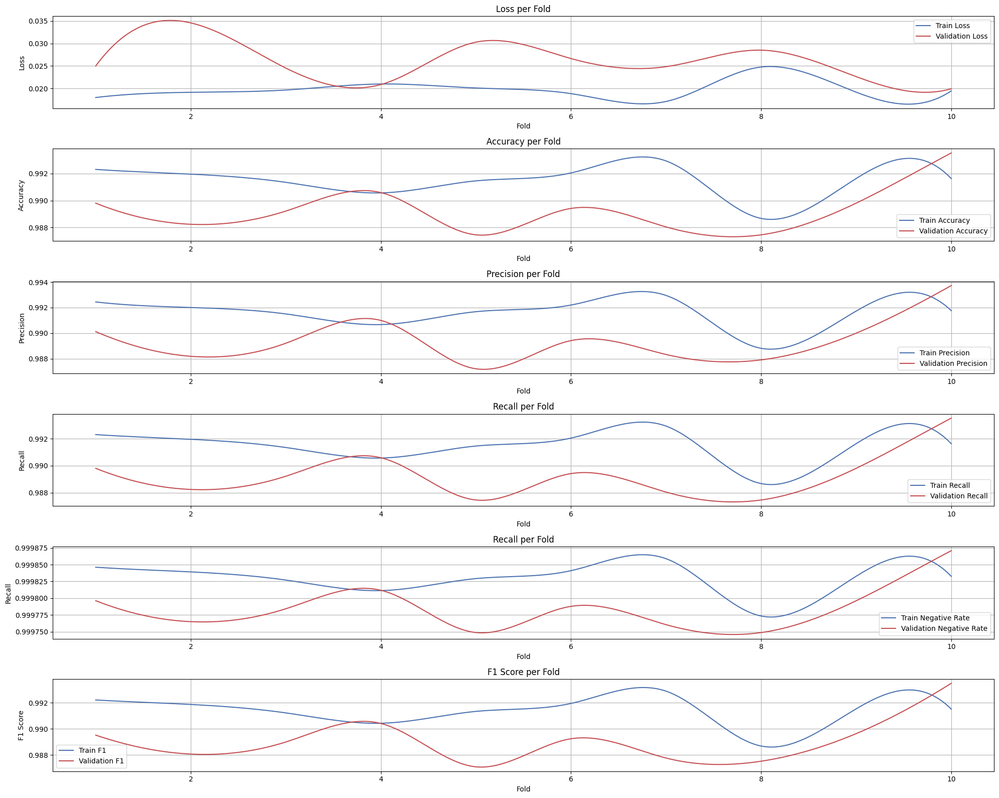

Average Train Loss: 0.0197
Average Validation Loss: 0.0258
Average Train Accuracy: 99.1458%
Average Validation Accuracy: 98.9353%
Average Train Precision: 99.1578%
Average Validation Precision: 98.9511%
Average Train Recall: 99.1458%
Average Validation Recall: 98.9353%
Average Train Negative Rate: 99.9829%
Average Validation Negative Rate: 99.9787%
Average Train F1: 99.1359%
Average Validation F1: 98.9177%


In [45]:
sns.reset_orig()
model,criterion = train_validation(train_features, test_features, train_target, test_target,name,optimal_num_epochs, optimal_learning_rate)
df4 = cross_check(features,target,name,10,optimal_num_epochs, optimal_learning_rate)
sns.set_theme()

In [46]:
features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("SMOTE + Tomek")

ROSample = SMOTETomek()
features,target = ROSample.fit_resample(features,target)

resampled_data = pd.DataFrame(features)
resampled_data['Crop'] = target
limited_data = resampled_data.groupby('Crop', group_keys=False).apply(
    lambda x: x.sample(n=1000, random_state=42) if len(x) > 1000 else x
).reset_index(drop=True)
features = limited_data.drop(columns=['Crop']).values
target = limited_data['Crop'].values

features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")
name = f"{model_name}_SMOTETOMEK"
train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
# pso_history = []
# optimal_num_epochs, optimal_learning_rate = pso_optimize(
#     train_features, 
#     test_features, 
#     train_target, 
#     test_target, 
#     lb, 
#     ub,
#     num_particles=20,
#     maxiter=10
# )


SMOTE + Tomek


C:\Users\shyam\AppData\Local\Temp\ipykernel_21432\1627562867.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  limited_data = resampled_data.groupby('Crop', group_keys=False).apply(


100%|██████████| 20/20 [00:51<00:00,  2.59s/trial, best loss: -0.9928431372549019]
Best hyperparameters found: {'learning_rate': 0.018093355760548935, 'num_epochs': 900}


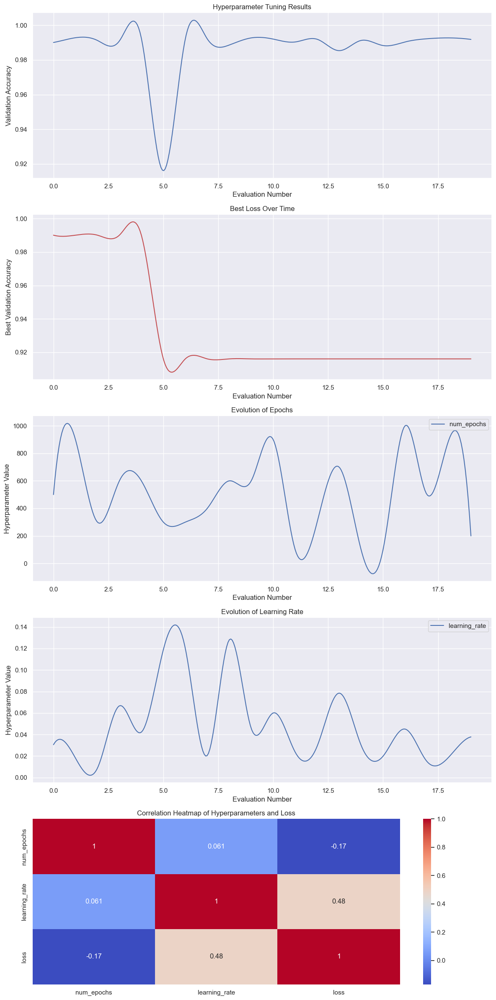

Best num_epochs: 900
Best learning_rate: 0.018093355760548935


In [47]:
logging.getLogger('hyperopt.tpe').setLevel(logging.ERROR)
trials = Trials()
best = fmin(
    fn=objective,
    space=space,
    algo=tpe.suggest,
    max_evals=20,
    trials=trials,
    verbose=True,
    rstate=np.random.default_rng(),
    show_progressbar=True,
    return_argmin=False,
)
print("Best hyperparameters found:", best)

results_df = pd.DataFrame({
    'num_epochs': [trial['misc']['vals']['num_epochs'][0] for trial in trials.trials],
    'learning_rate': [trial['misc']['vals']['learning_rate'][0] for trial in trials.trials],
    'loss': [trial['result']['loss'] for trial in trials.trials],
})
losses = [-trial['result']['loss'] for trial in trials.trials]

def smooth_curve(x, y):
    x_smooth = np.linspace(min(x), max(x), 300)
    spl = make_interp_spline(x, y, k=3)  # Cubic spline interpolation
    y_smooth = spl(x_smooth)
    return x_smooth, y_smooth

s = "SMOTE_Tomek"
fig, axs = plt.subplots(5, 1, figsize=(12, 24))
# Smooth losses
x_smooth, smoothed_losses = smooth_curve(range(len(losses)), losses)
sns.lineplot(x=x_smooth, y=smoothed_losses, color='b', ax=axs[0])
axs[0].set_title('Hyperparameter Tuning Results')
axs[0].set_xlabel('Evaluation Number')
axs[0].set_ylabel('Validation Accuracy')

# Best losses over time
best_losses = [min(losses[:i+1]) for i in range(len(losses))]
x_smooth_best, smoothed_best_losses = smooth_curve(range(len(best_losses)), best_losses)
sns.lineplot(x=x_smooth_best, y=smoothed_best_losses, color='r', ax=axs[1])
axs[1].set_title('Best Loss Over Time')
axs[1].set_xlabel('Evaluation Number')
axs[1].set_ylabel('Best Validation Accuracy')

# Evolution of epochs
x_smooth_epochs, smoothed_epochs = smooth_curve(range(len(results_df['num_epochs'])), results_df['num_epochs'])
sns.lineplot(x=x_smooth_epochs, y=smoothed_epochs,label='num_epochs', ax=axs[2])
axs[2].set_title('Evolution of Epochs')
axs[2].set_xlabel('Evaluation Number')
axs[2].set_ylabel('Hyperparameter Value')

# Evolution of learning rate
x_smooth_lr, smoothed_learning_rate = smooth_curve(range(len(results_df['learning_rate'])), results_df['learning_rate'])
sns.lineplot(x=x_smooth_lr, y=smoothed_learning_rate, label='learning_rate', ax=axs[3])
axs[3].set_title('Evolution of Learning Rate')
axs[3].set_xlabel('Evaluation Number')
axs[3].set_ylabel('Hyperparameter Value')

# Correlation heatmap
sns.heatmap(results_df.corr(), annot=True, cmap='coolwarm', ax=axs[4])
axs[4].set_title('Correlation Heatmap of Hyperparameters and Loss')

plt.tight_layout()
save_path = f"../Methodology/HT{s}.png"
plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

optimal_num_epochs = best['num_epochs']
optimal_learning_rate = best['learning_rate']
print(f"Best num_epochs: {optimal_num_epochs}")
print(f"Best learning_rate: {optimal_learning_rate}")

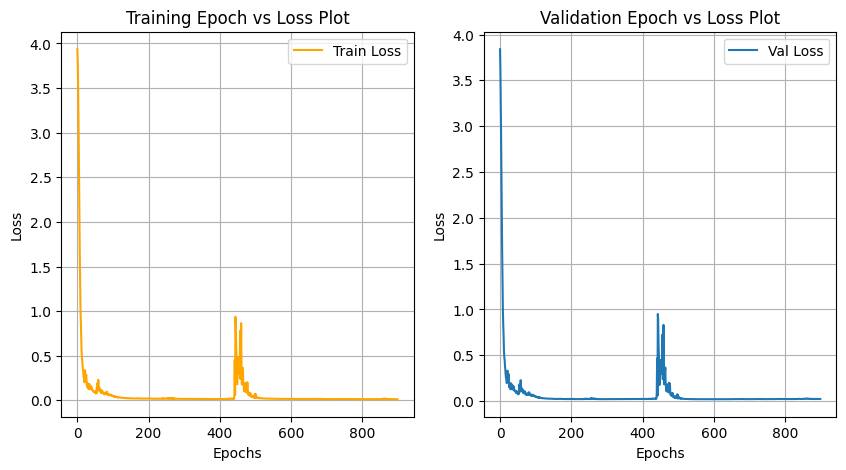

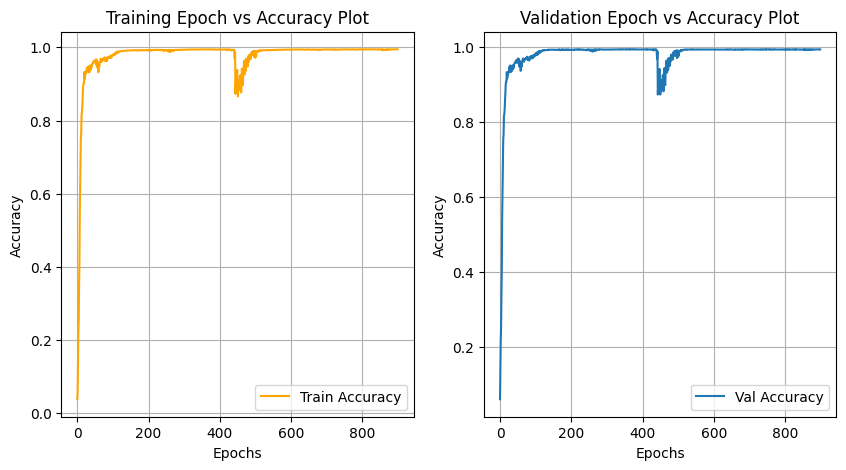

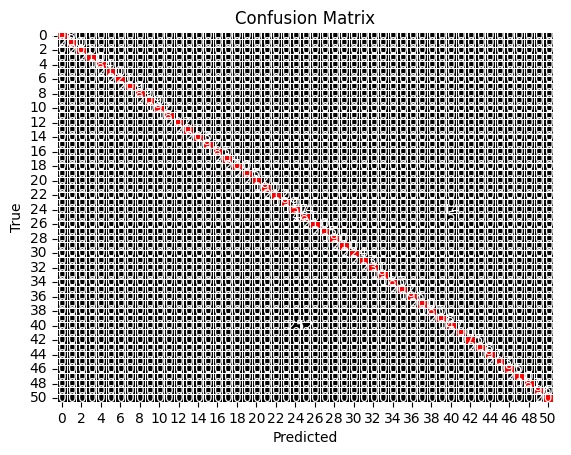

Test Accuracy: 99.27%


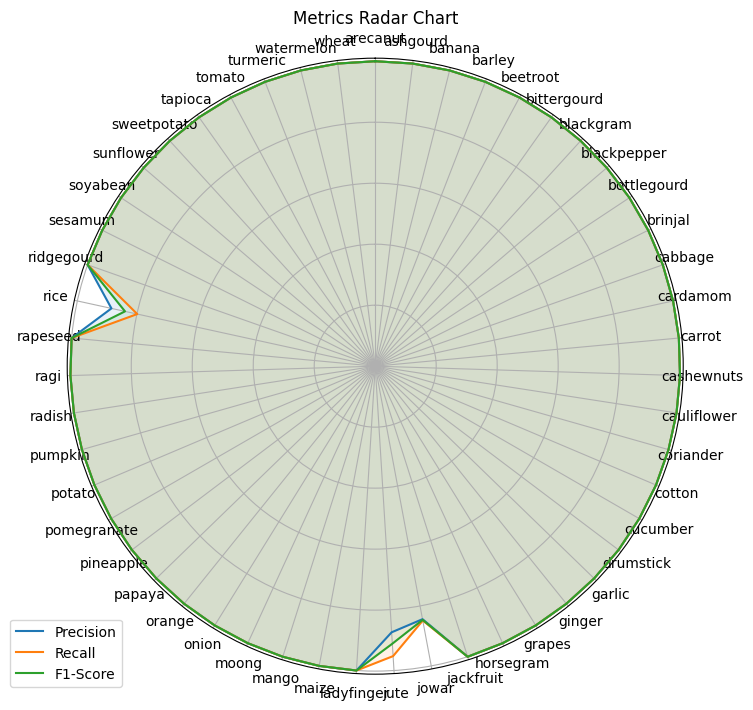

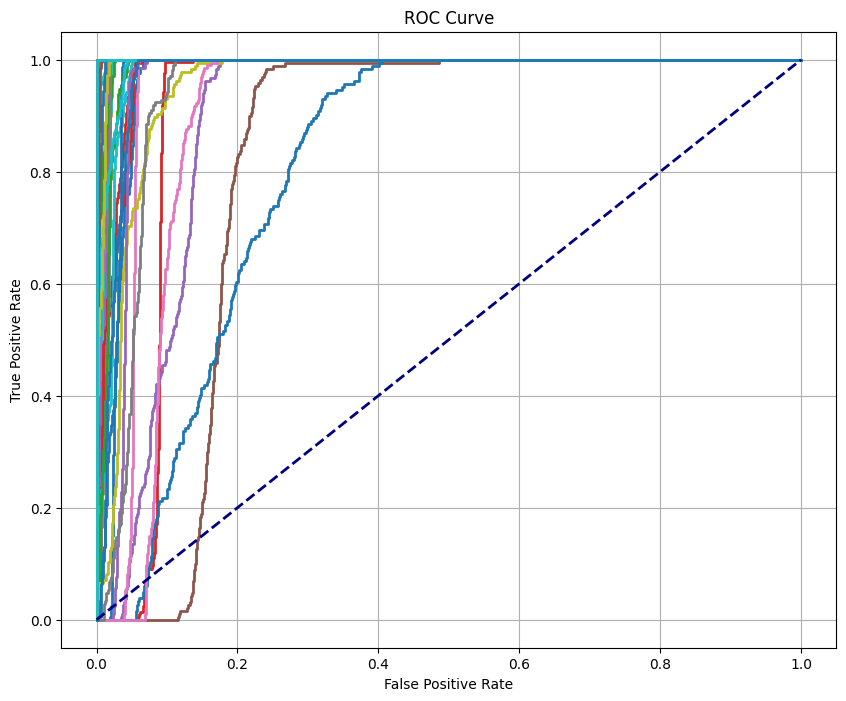

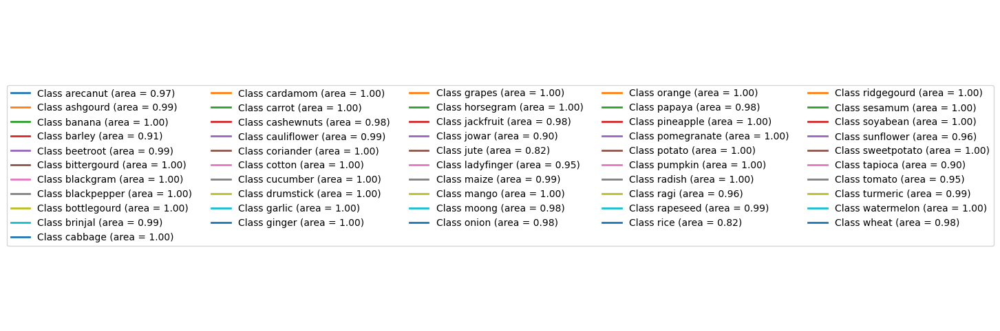

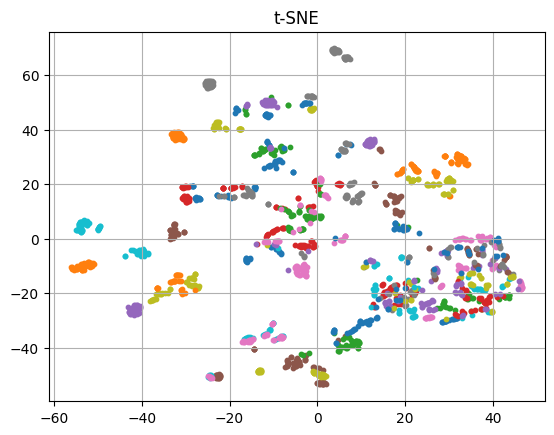

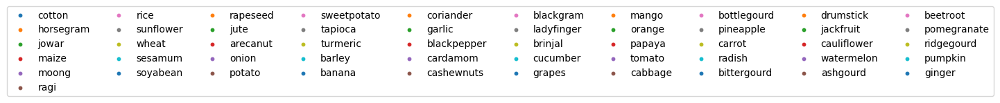

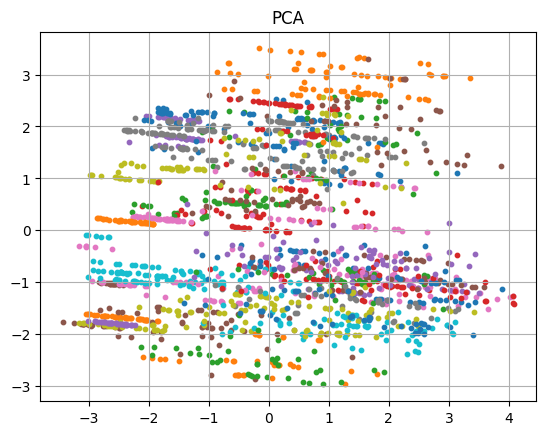

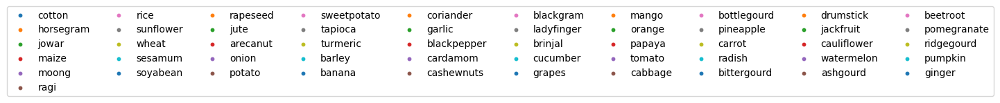

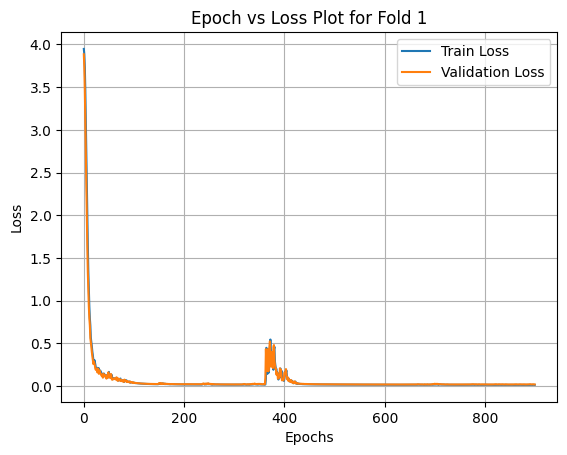

Epoch [900/900], Train Loss: 0.0137, Validation Loss: 0.0190
Fold 1, Train Loss: 0.013543791137635708, Train Accuracy: 99.46%, Validation Loss: 0.01904097944498062, Validation Accuracy: 99.37%
Fold 1, Train Precision: 0.9948, Train Recall: 0.9946,Train Negative Rate: 0.9999 ,Train F1: 0.9946
Fold 1, Validation Precision: 0.9938, Validation Recall: 0.9937,Validation Negative Rate: 0.9999 ,Validation F1: 0.9937
Fold 2, Train Loss: 0.014683674089610577, Train Accuracy: 99.40%, Validation Loss: 0.024764155969023705, Validation Accuracy: 99.25%
Fold 2, Train Precision: 0.9941, Train Recall: 0.9940,Train Negative Rate: 0.9999 ,Train F1: 0.9940
Fold 2, Validation Precision: 0.9925, Validation Recall: 0.9925,Validation Negative Rate: 0.9999 ,Validation F1: 0.9925
Fold 3, Train Loss: 0.014354337006807327, Train Accuracy: 99.41%, Validation Loss: 0.023863617330789566, Validation Accuracy: 99.14%
Fold 3, Train Precision: 0.9943, Train Recall: 0.9941,Train Negative Rate: 0.9999 ,Train F1: 0.9941
F

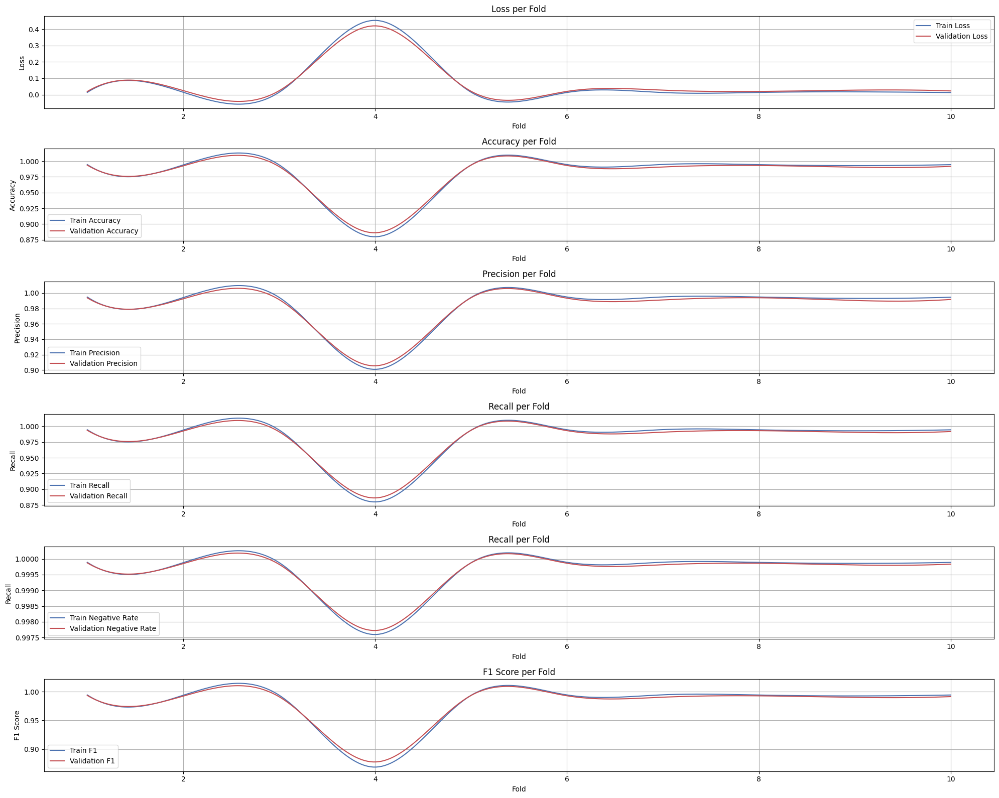

Average Train Loss: 0.0581
Average Validation Loss: 0.0626
Average Train Accuracy: 98.2758%
Average Validation Accuracy: 98.1667%
Average Train Precision: 98.5057%
Average Validation Precision: 98.3737%
Average Train Recall: 98.2758%
Average Validation Recall: 98.1667%
Average Train Negative Rate: 99.9655%
Average Validation Negative Rate: 99.9633%
Average Train F1: 98.1596%
Average Validation F1: 98.0730%


In [48]:
sns.reset_orig()
model,criterion = train_validation(train_features, test_features, train_target, test_target,name,optimal_num_epochs, optimal_learning_rate)
df5 = cross_check(features,target,name,10,optimal_num_epochs, optimal_learning_rate)
sns.set_theme()

In [49]:
features = data.drop(columns=['Crop']).values
target = data['Crop'].values

print("SMOTEENN")

ROSample = SMOTEENN()
features,target = ROSample.fit_resample(features,target)

resampled_data = pd.DataFrame(features)
resampled_data['Crop'] = target
limited_data = resampled_data.groupby('Crop', group_keys=False).apply(
    lambda x: x.sample(n=1000, random_state=42) if len(x) > 1000 else x
).reset_index(drop=True)
features = limited_data.drop(columns=['Crop']).values
target = limited_data['Crop'].values

features = torch.tensor(features, dtype=torch.float32).float().to("cuda")
target = torch.tensor(target, dtype=torch.long).long().to("cuda")
name = f"{model_name}_SMOTEENN"
train_features, test_features, train_target, test_target = train_test_split(features, target, test_size=0.2, random_state=42)
# pso_history = []
# optimal_num_epochs, optimal_learning_rate = pso_optimize(
#     train_features, 
#     test_features, 
#     train_target, 
#     test_target, 
#     lb, 
#     ub,
#     num_particles=20,
#     maxiter=10
# )

SMOTEENN


C:\Users\shyam\AppData\Local\Temp\ipykernel_21432\2042858133.py:11: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  limited_data = resampled_data.groupby('Crop', group_keys=False).apply(


100%|██████████| 20/20 [01:01<00:00,  3.05s/trial, best loss: -0.9973529411764706]
Best hyperparameters found: {'learning_rate': 0.07276633670078085, 'num_epochs': 700}


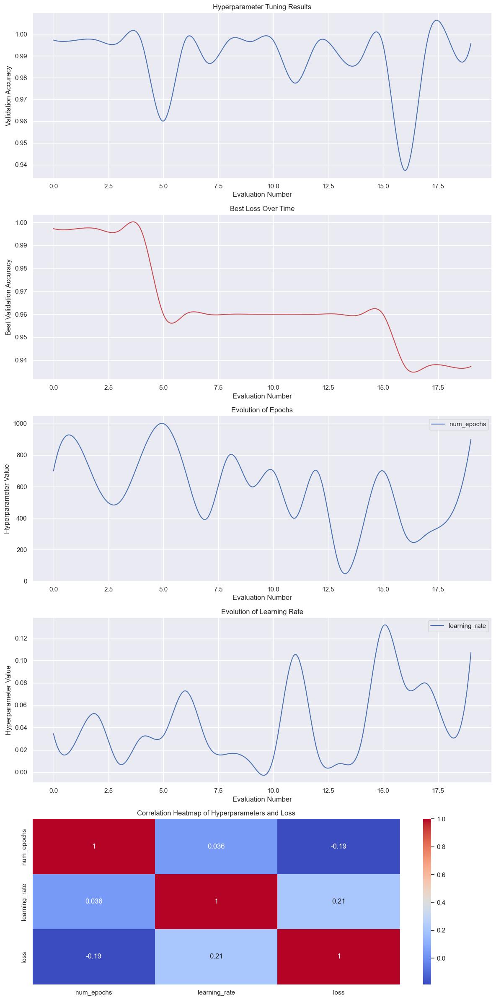

Best num_epochs: 700
Best learning_rate: 0.07276633670078085


In [50]:
logging.getLogger('hyperopt.tpe').setLevel(logging.ERROR)
trials = Trials()
best = fmin(
    fn=objective,
    space=space,
    algo=tpe.suggest,
    max_evals=20,
    trials=trials,
    verbose=True,
    rstate=np.random.default_rng(),
    show_progressbar=True,
    return_argmin=False,
)
print("Best hyperparameters found:", best)

results_df = pd.DataFrame({
    'num_epochs': [trial['misc']['vals']['num_epochs'][0] for trial in trials.trials],
    'learning_rate': [trial['misc']['vals']['learning_rate'][0] for trial in trials.trials],
    'loss': [trial['result']['loss'] for trial in trials.trials],
})
losses = [-trial['result']['loss'] for trial in trials.trials]

def smooth_curve(x, y):
    x_smooth = np.linspace(min(x), max(x), 300)
    spl = make_interp_spline(x, y, k=3)  # Cubic spline interpolation
    y_smooth = spl(x_smooth)
    return x_smooth, y_smooth

s = "SMOTEENN"
fig, axs = plt.subplots(5, 1, figsize=(12, 24))
# Smooth losses
x_smooth, smoothed_losses = smooth_curve(range(len(losses)), losses)
sns.lineplot(x=x_smooth, y=smoothed_losses, color='b', ax=axs[0])
axs[0].set_title('Hyperparameter Tuning Results')
axs[0].set_xlabel('Evaluation Number')
axs[0].set_ylabel('Validation Accuracy')

# Best losses over time
best_losses = [min(losses[:i+1]) for i in range(len(losses))]
x_smooth_best, smoothed_best_losses = smooth_curve(range(len(best_losses)), best_losses)
sns.lineplot(x=x_smooth_best, y=smoothed_best_losses, color='r', ax=axs[1])
axs[1].set_title('Best Loss Over Time')
axs[1].set_xlabel('Evaluation Number')
axs[1].set_ylabel('Best Validation Accuracy')

# Evolution of epochs
x_smooth_epochs, smoothed_epochs = smooth_curve(range(len(results_df['num_epochs'])), results_df['num_epochs'])
sns.lineplot(x=x_smooth_epochs, y=smoothed_epochs,label='num_epochs', ax=axs[2])
axs[2].set_title('Evolution of Epochs')
axs[2].set_xlabel('Evaluation Number')
axs[2].set_ylabel('Hyperparameter Value')

# Evolution of learning rate
x_smooth_lr, smoothed_learning_rate = smooth_curve(range(len(results_df['learning_rate'])), results_df['learning_rate'])
sns.lineplot(x=x_smooth_lr, y=smoothed_learning_rate, label='learning_rate', ax=axs[3])
axs[3].set_title('Evolution of Learning Rate')
axs[3].set_xlabel('Evaluation Number')
axs[3].set_ylabel('Hyperparameter Value')

# Correlation heatmap
sns.heatmap(results_df.corr(), annot=True, cmap='coolwarm', ax=axs[4])
axs[4].set_title('Correlation Heatmap of Hyperparameters and Loss')

plt.tight_layout()
save_path = f"../Methodology/HT{s}.png"
plt.savefig(save_path, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

optimal_num_epochs = best['num_epochs']
optimal_learning_rate = best['learning_rate']
print(f"Best num_epochs: {optimal_num_epochs}")
print(f"Best learning_rate: {optimal_learning_rate}")

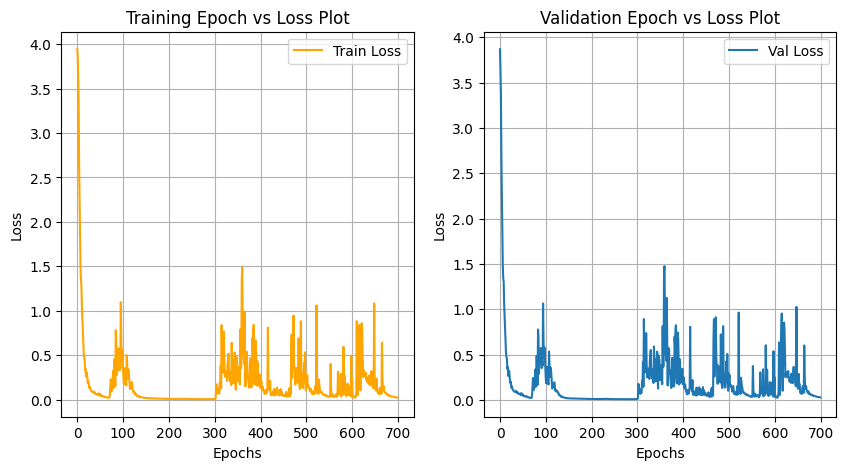

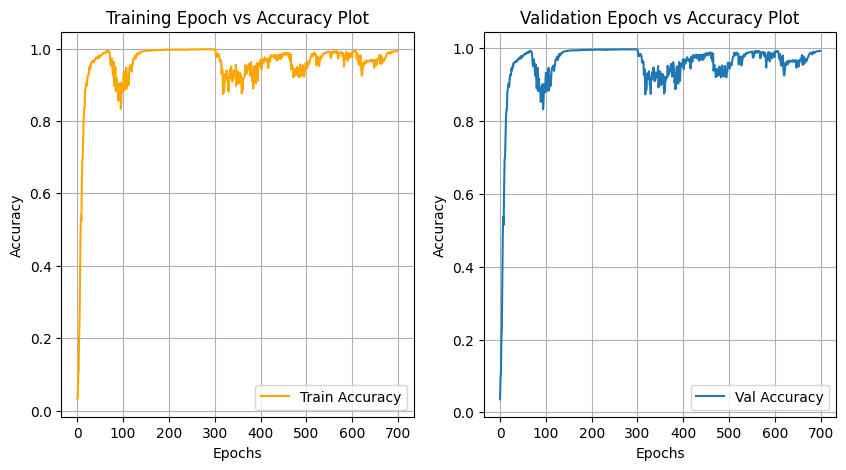

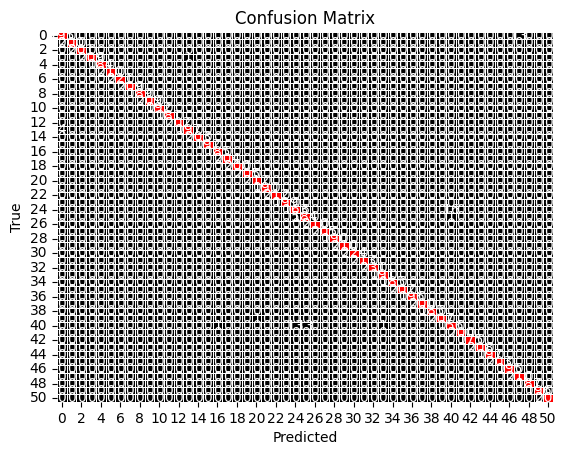

Test Accuracy: 99.26%


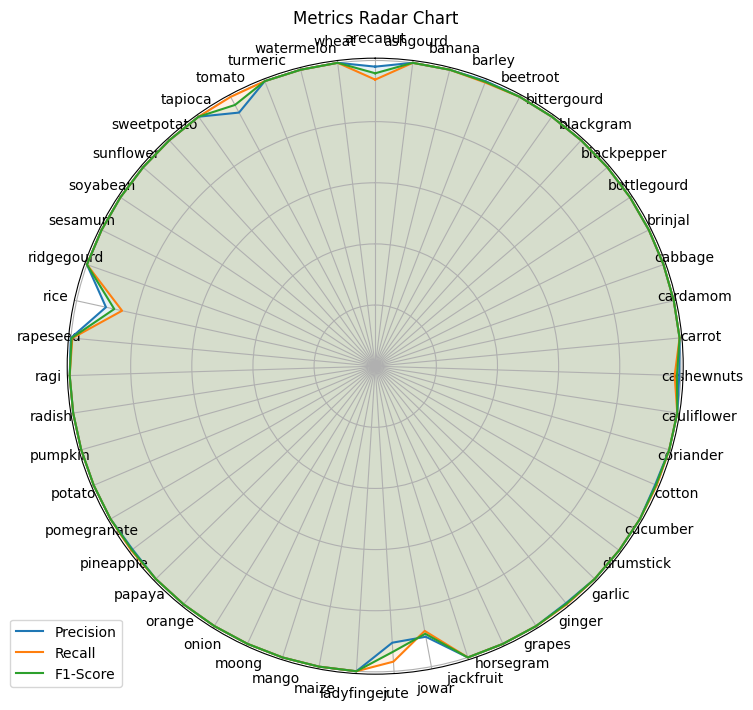

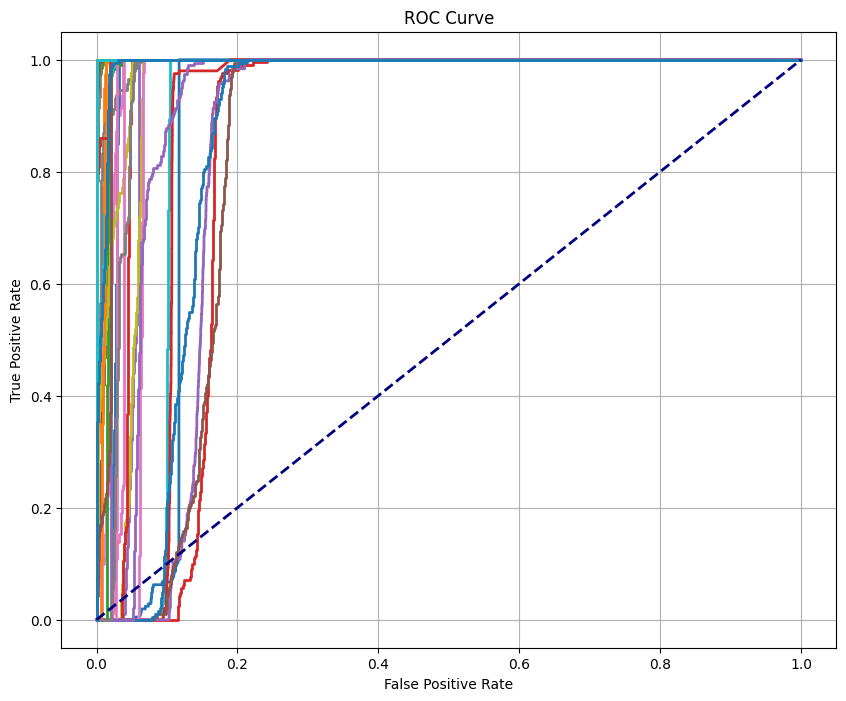

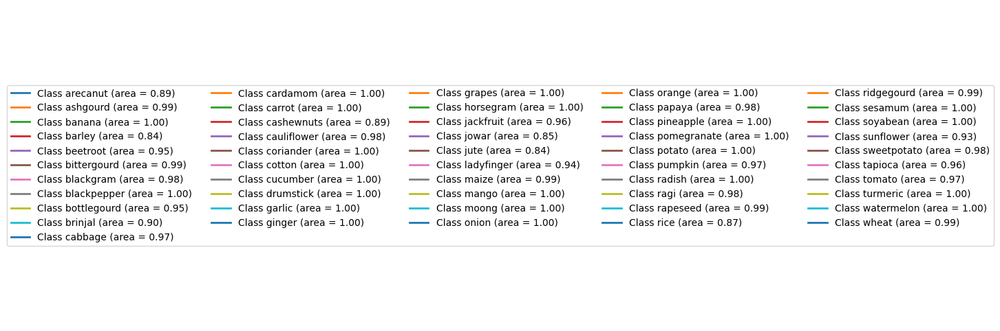

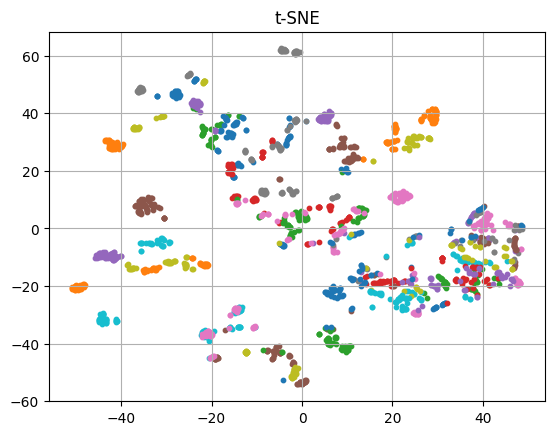

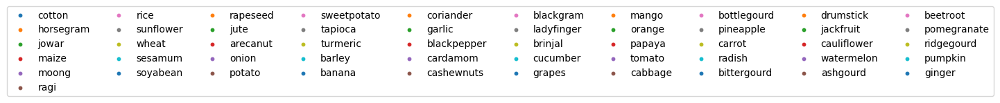

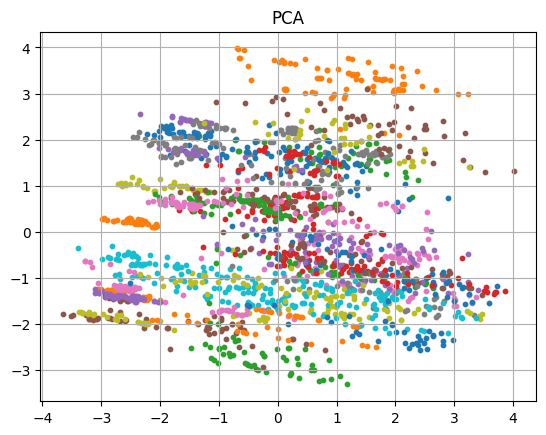

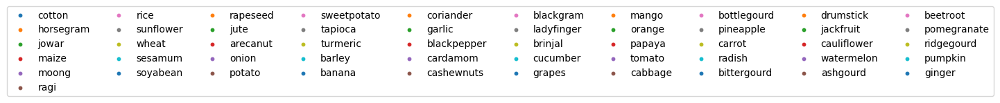

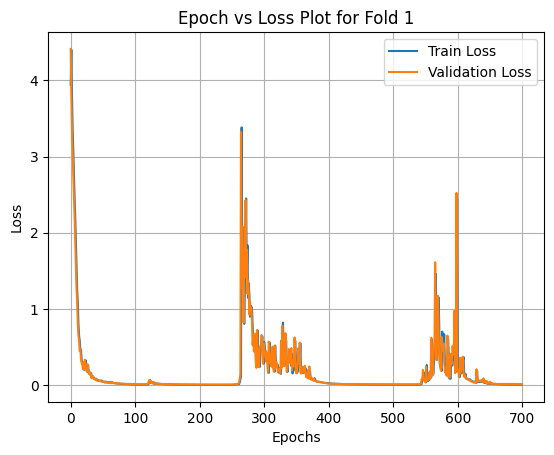

Epoch [700/700], Train Loss: 0.0088, Validation Loss: 0.0165
Fold 1, Train Loss: 0.008702841587364674, Train Accuracy: 99.71%, Validation Loss: 0.016544479876756668, Validation Accuracy: 99.53%
Fold 1, Train Precision: 0.9972, Train Recall: 0.9971,Train Negative Rate: 0.9999 ,Train F1: 0.9971
Fold 1, Validation Precision: 0.9953, Validation Recall: 0.9953,Validation Negative Rate: 0.9999 ,Validation F1: 0.9953
Fold 2, Train Loss: 0.012721685692667961, Train Accuracy: 99.57%, Validation Loss: 0.024205276742577553, Validation Accuracy: 99.47%
Fold 2, Train Precision: 0.9957, Train Recall: 0.9957,Train Negative Rate: 0.9999 ,Train F1: 0.9957
Fold 2, Validation Precision: 0.9948, Validation Recall: 0.9947,Validation Negative Rate: 0.9999 ,Validation F1: 0.9946
Fold 3, Train Loss: 0.02404157817363739, Train Accuracy: 99.15%, Validation Loss: 0.0309623833745718, Validation Accuracy: 98.94%
Fold 3, Train Precision: 0.9915, Train Recall: 0.9915,Train Negative Rate: 0.9998 ,Train F1: 0.9915
Fol

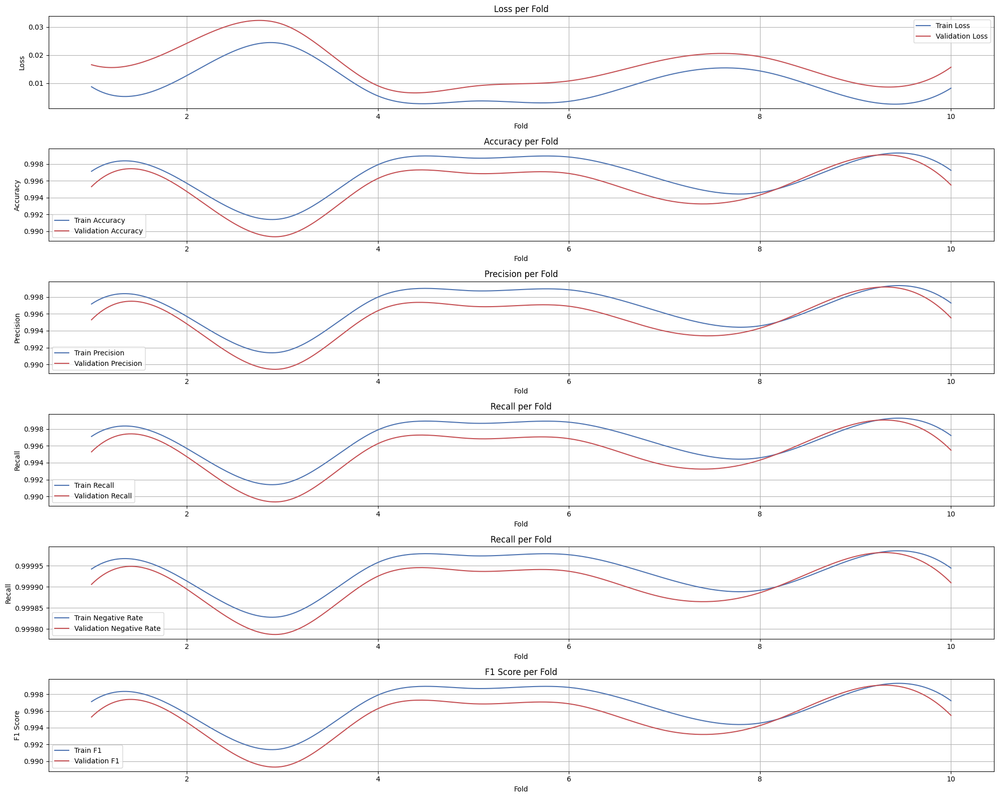

Average Train Loss: 0.0098
Average Validation Loss: 0.0164
Average Train Accuracy: 99.6599%
Average Validation Accuracy: 99.5157%
Average Train Precision: 99.6619%
Average Validation Precision: 99.5217%
Average Train Recall: 99.6599%
Average Validation Recall: 99.5157%
Average Train Negative Rate: 99.9932%
Average Validation Negative Rate: 99.9903%
Average Train F1: 99.6587%
Average Validation F1: 99.5135%


In [51]:
sns.reset_orig()
model,criterion = train_validation(train_features, test_features, train_target, test_target,name,optimal_num_epochs, optimal_learning_rate)
df6 = cross_check(features,target,name,10,optimal_num_epochs, optimal_learning_rate)
sns.set_theme()

In [52]:
df1.to_csv(f"../Results/{model_name}_Initial.csv",index=False)
df2.to_csv(f"../Results/{model_name}_ROS.csv",index=False)
df3.to_csv(f"../Results/{model_name}_RUS.csv",index=False)
df4.to_csv(f"../Results/{model_name}_SMOTE.csv",index=False)
df5.to_csv(f"../Results/{model_name}_SMOTE+TOMEK.csv",index=False)
df6.to_csv(f"../Results/{model_name}_SMOTEENN.csv",index=False)